<a href="https://colab.research.google.com/github/Kh0uloud/Modeling-Mental-Health-Trends-Using-Social-Media-Data/blob/main/MDDL_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install hashformers

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil
import json
from glob import glob
import os
from tqdm import tqdm
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
import re
from pathlib import Path
from dateutil import parser
import ast

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import scipy.stats as stats
import math

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.model_selection import train_test_split
import shap

from statsmodels.api import OLS

tqdm.pandas()

# Unzipping Data

In [ ]:
!apt-get install p7zip-full -y  # Install 7-Zip (only needed once)
!7z x "/content/drive/MyDrive/MentalHealthProject/Dataset_MDDL.zip" -o"/content/data" -y

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs AMD EPYC 7B12 (830F10),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/MentalHealthProject/                                                     1 file, 8393734330 bytes (8005 MiB)

Extracting archive: /content/drive/MyDrive/MentalHealthProject/Dataset_MDDL.zip
  2% 4096 Open               10% 20480 Open                43% 81920 Open                79% 151552 Open                

In [ ]:
shutil.rmtree("/content/data/Dataset/unlabeled")

In [ ]:
shutil.move("/content/data/Dataset/labeled/positive", "/content/drive/MyDrive/MentalHealthProject/LabeledPos")

'/content/drive/MyDrive/MentalHealthProject/LabeledPos'

In [ ]:
print(len(glob(os.path.join("/content/data/Dataset/labeled/positive/data/timeline", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledPos/data/timeline", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/positive/data/tweet", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledPos/data/tweet", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/positive/data/users", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledPos/data/users", "*"))))

0 2626
0 6493
0 5899


In [ ]:
shutil.copytree("/content/data/Dataset/labeled/negative", "/content/drive/MyDrive/MentalHealthProject/LabeledNeg")

'/content/drive/MyDrive/MentalHealthProject/LabeledNeg'

In [ ]:
print(len(glob(os.path.join("/content/data/Dataset/labeled/negative/data/timeline", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/timeline", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/negative/data/tweet", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/tweet", "*"))))

print(len(glob(os.path.join("/content/data/Dataset/labeled/negative/data/users", "*"))), len(glob(os.path.join("/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data/users", "*"))))

5373 5373
5384 5384
5160 5160


In [ ]:
shutil.rmtree("/content/data")

# Data

The dataset is the MDDL (Multimodal Dictionary Learning) dataset, designed for depression detection via social media, specifically Twitter. It contains a combination of user profile features, tweet metadata, and timelines of user interactions. This dataset has been used to create two distinct labels: depressed and non-depressed users based on the content of their tweets. <br>

<h4>Structure of the Dataset: </h4>

1.   Users: Each JSON file in this folder contains detailed information about a specific user. Each record includes user profile features (account metadata, profile details, activity statistics, etc.)
2.   Tweets: Each JSON file in this folder contains tweet-level data with information such as the tweet content, sentiment, engagement statistics (like retweets and likes), and metadata.
3.	Timeline: This folder contains multiple rows per file, each representing a tweet from a particular user. These rows contain time-stamped data such as tweet content, engagement, and user interaction metadata.


## Data extraction and features comprehension

In [ ]:
pos_data = "/content/drive/MyDrive/MentalHealthProject/LabeledPos/data"
files = glob(os.path.join(pos_data, "timeline", "*.json"))

# Read all JSON files and concatenate them
df_timeline_list = [pd.read_json(file, lines=True) for file in tqdm(files)]
df_timeline_pos = pd.concat(df_timeline_list, ignore_index=True)

KeyboardInterrupt: 

In [ ]:
files = glob(os.path.join(pos_data, "tweet", "*.json"))

# Read all JSON files and concatenate them
df_tweet_list = [pd.read_json(file, lines=True) for file in tqdm(files)]
df_tweet = pd.concat(df_tweet_list, ignore_index=True)

In [ ]:
pos_data = "/content/drive/MyDrive/MentalHealthProject/LabeledPos/data"
files = glob(os.path.join(pos_data, "users", "*.json"))

# Read all JSON files and concatenate them
df_users_list = [pd.read_json(file, lines=True) for file in tqdm(files)]
df_users_pos = pd.concat(df_users_list, ignore_index=True)

100%|██████████| 5899/5899 [06:17<00:00, 15.62it/s]


In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"

files = glob(os.path.join(neg_data, "timeline", "*.json"))[:2000]

non_empty_files = []  # List to store non-empty file names

def process_json_file(file_path):
    """Reads a JSON file, extracts valid JSON objects, and returns a DataFrame."""
    with open(file_path, "r", encoding="utf-8") as file:
        content = file.read().strip()

    # Split based on `{"created_at"`, keeping the delimiter
    objects = re.split(r'(?=\{"created_at")', content)

    json_objects = []
    for obj in objects:
        obj = obj.strip()
        if obj:
            try:
                json_objects.append(json.loads(obj))
            except json.JSONDecodeError:
                continue  # Skip invalid JSON objects

    if json_objects:
        non_empty_files.append(file_path)  # Store non-empty file names

    return pd.DataFrame(json_objects) if json_objects else pd.DataFrame()

def process_multiple_json_files(file_paths):
    """Processes multiple JSON files and concatenates the resulting DataFrames."""
    dfs = [process_json_file(file) for file in tqdm(file_paths)]
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# Process all files
df_timeline_neg = process_multiple_json_files(files)

100%|██████████| 2000/2000 [1:52:47<00:00,  3.38s/it]
<ipython-input-3-b103485892f1>:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()


In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"

files = glob(os.path.join(neg_data, "timeline", "*.json"))[:2000]

non_empty_files = []  # List to store non-empty file names

def process_json_file(file_path):
    """Reads a JSON file, extracts valid JSON objects, and returns a DataFrame."""
    with open(file_path, "r", encoding="utf-8") as file:
        content = file.read().strip()

    # Split based on `{"created_at"`, keeping the delimiter
    objects = re.split(r'(?=\{"created_at")', content)

    json_objects = []
    for obj in objects:
        obj = obj.strip()
        if obj:
            try:
                json_objects.append(json.loads(obj))
            except json.JSONDecodeError:
                continue  # Skip invalid JSON objects

    if json_objects:
        non_empty_files.append(file_path)  # Store non-empty file names

    return pd.DataFrame(json_objects) if json_objects else pd.DataFrame()

def process_multiple_json_files(file_paths):
    """Processes multiple JSON files and concatenates the resulting DataFrames."""
    dfs = [process_json_file(file) for file in tqdm(file_paths)]
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# Process all files
df_timeline_neg = process_multiple_json_files(files)

100%|██████████| 2000/2000 [53:21<00:00,  1.60s/it]
<ipython-input-3-b103485892f1>:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()


In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_neg_1_3.csv"
df_timeline_neg.to_csv(save_path, index=False)

len(non_empty_files), len(files)

(1995, 2000)

In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"

files = glob(os.path.join(neg_data, "timeline", "*.json"))[2000:4000]

non_empty_files = []  # List to store non-empty file names

def process_json_file(file_path):
    """Reads a JSON file, extracts valid JSON objects, and returns a DataFrame."""
    with open(file_path, "r", encoding="utf-8") as file:
        content = file.read().strip()

    # Split based on `{"created_at"`, keeping the delimiter
    objects = re.split(r'(?=\{"created_at")', content)

    json_objects = []
    for obj in objects:
        obj = obj.strip()
        if obj:
            try:
                json_objects.append(json.loads(obj))
            except json.JSONDecodeError:
                continue  # Skip invalid JSON objects

    if json_objects:
        non_empty_files.append(file_path)  # Store non-empty file names

    return pd.DataFrame(json_objects) if json_objects else pd.DataFrame()

def process_multiple_json_files(file_paths):
    """Processes multiple JSON files and concatenates the resulting DataFrames."""
    dfs = [process_json_file(file) for file in tqdm(file_paths)]
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# Process all files
df_timeline_neg = process_multiple_json_files(files)

100%|██████████| 2000/2000 [46:30<00:00,  1.40s/it]
<ipython-input-4-c5cf87644b0a>:33: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()


In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_neg_2_3.csv"
df_timeline_neg.to_csv(save_path, index=False)

len(non_empty_files), len(files)

(1999, 2000)

In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"

files = glob(os.path.join(neg_data, "timeline", "*.json"))[4000:]

non_empty_files = []  # List to store non-empty file names

def process_json_file(file_path):
    """Reads a JSON file, extracts valid JSON objects, and returns a DataFrame."""
    with open(file_path, "r", encoding="utf-8") as file:
        content = file.read().strip()

    # Split based on `{"created_at"`, keeping the delimiter
    objects = re.split(r'(?=\{"created_at")', content)

    json_objects = []
    for obj in objects:
        obj = obj.strip()
        if obj:
            try:
                json_objects.append(json.loads(obj))
            except json.JSONDecodeError:
                continue  # Skip invalid JSON objects

    if json_objects:
        non_empty_files.append(file_path)  # Store non-empty file names

    return pd.DataFrame(json_objects) if json_objects else pd.DataFrame()

def process_multiple_json_files(file_paths):
    """Processes multiple JSON files and concatenates the resulting DataFrames."""
    dfs = [process_json_file(file) for file in tqdm(file_paths)]
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# Process all files
df_timeline_neg = process_multiple_json_files(files)

100%|██████████| 1373/1373 [48:59<00:00,  2.14s/it]
<ipython-input-3-060783250492>:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()


In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_neg_3_3.csv"
df_timeline_neg.to_csv(save_path, index=False)

len(non_empty_files), len(files)

(1373, 1373)

In [ ]:
"""
files = glob(os.path.join(neg_data, "tweet", "*.json"))
df_tweet_list = []
for file in files:
    try:
        df_tweet_list.append(pd.read_json(file, lines=True))
    except:
        print(f"file ({os.path.basename(file)}) couldn't be read")
        continue
df_tweet_neg = pd.concat(df_tweet_list, ignore_index=True)
print('------------------------ \n')"""

In [ ]:
neg_data = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/data"
files = glob(os.path.join(neg_data, "users", "*.json"))
df_users_list = []
for file in tqdm(files):
    try:
        df_users_list.append(pd.read_json(file, lines=True))
    except:
        print(f"file ({os.path.basename(file)}) couldn't be read")
        continue
df_users_neg = pd.concat(df_users_list, ignore_index=True)

100%|██████████| 5160/5160 [07:48<00:00, 11.02it/s]


In [ ]:
print(f"df_timeline columns: {df_timeline.columns}")
print('---------------- \n')

print(f"df_tweet columns: {df_tweet.columns}")
print('---------------- \n')

print(f"df_users columns: {df_users.columns}")

df_timeline columns: Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'retweet_count', 'favorite_count',
       'favorited', 'retweeted', 'possibly_sensitive', 'lang',
       'extended_entities', 'retweeted_status', 'quoted_status_id',
       'quoted_status_id_str', 'quoted_status', 'withheld_scope',
       'withheld_copyright', 'withheld_in_countries'],
      dtype='object')
---------------- 

df_tweet columns: Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'retwee

## Data preprocessing and Features Engineering

### User Data

<table border="1">
  <thead>
    <tr>
      <th>Category</th>
      <th>Potential Features</th>
      <th>Reason for Inclusion</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>User Profile Features</td>
      <td>followers_count, friends_count, statuses_count, listed_count, verified</td>
      <td>Social influence, engagement level</td>
    </tr>
    <tr>
      <td>Behavioral Features</td>
      <td>favourites_count, geo_enabled, profile_use_background_image, default_profile, default_profile_image, has_extended_profile</td>
      <td>Activity and customization trends</td>
    </tr>
    <tr>
      <td>Time-based Features</td>
      <td>created_at, utc_offset, time_zone</td>
      <td>Account age and timezone effects</td>
    </tr>
    <tr>
      <td>Tweet-Based Features</td>
      <td>status (text sentiment score)</td>
      <td>Emotional sentiment of tweets</td>
    </tr>
    <tr>
      <td>Visual & Style Preferences</td>
      <td>profile_background_color, profile_link_color, profile_sidebar_fill_color, profile_text_color</td>
      <td>Color psychology & depression detection</td>
    </tr>
  </tbody>
</table>


#### Collect Users Data from Negative Users (non-depressed) and Positive Users (depressed)
Basic Data Exploration

In [ ]:
df_users_neg['depression'] = False  # Negative Data
df_users_pos['depression'] = True   # Positive Data

In [ ]:
users = pd.concat([df_users_pos, df_users_neg])

# Shuffling rows
users = users.sample(frac=1, random_state=42)
users.shape

(11059, 45)

In [ ]:
# Extract numeric and categorical columns
num_cols = users.select_dtypes(include=[np.number]).columns
cat_cols = users.select_dtypes(exclude=[np.number]).columns

In [ ]:
# Summary statistics for numerical features
users[num_cols].describe()

,id,id_str,followers_count,friends_count,listed_count,favourites_count,utc_offset,statuses_count
count,1.105900e+04,1.105900e+04,11059.000000,11059.000000,11059.000000,11059.000000,7424.000000,1.105900e+04
mean,6.940020e+16,6.940020e+16,1922.818428,878.860476,30.488290,9325.841215,-11824.137931,3.233261e+04
std,2.201478e+17,2.201478e+17,13030.652658,3019.073749,147.757149,20292.786411,19195.717064,7.179868e+04
min,1.090400e+04,1.090400e+04,0.000000,0.000000,0.000000,0.000000,-39600.000000,1.000000e+00
25%,2.576247e+08,2.576247e+08,163.000000,148.000000,1.000000,275.500000,-28800.000000,2.997500e+03
50%,9.569353e+08,9.569353e+08,472.000000,360.000000,5.000000,2132.000000,-18000.000000,1.223800e+04
75%,2.807765e+09,2.807765e+09,1239.000000,806.000000,20.000000,9430.000000,0.000000,3.614800e+04
max,8.194569e+17,8.194569e+17,986769.000000,126748.000000,8324.000000,356830.000000,46800.000000,2.363105e+06


In [ ]:
# Make sure ids are unique accross the dataframe
print(f"Total number of users: {len(users)}, \nTotal number of unique users: {users.id.nunique()}, \n \nRedundant users ids: \n{users.id.value_counts().loc[lambda x: x > 1]}")
print('-------------------- \n')
# Extract redundant ids, display to check if they correspond to the same persons
redundant_ids = users.id.value_counts().loc[lambda x: x > 1].index.tolist()
print(users[users["id"].isin(redundant_ids)][['id', 'name', 'screen_name', 'location', 'depression']])

# Remove rows with the redundant ids, as they represent conflicting info (depression)
users = users[~users["id"].isin(redundant_ids)]

Total number of users: 11059, 
Total number of unique users: 11055, 
 
Redundant users ids: 
id
332432312     2
295636725     2
20022913      2
1200392156    2
Name: count, dtype: int64
-------------------- 

              id               name    screen_name  \
1790  1200392156          Kana | カナ  Rotten_Velvet   
3821    20022913  Justin/Cyberwaste  iAmCyberwaste   
102     20022913       Justin Lutze  iAmCyberwaste   
2646   332432312             kagome        chxrnxe   
4409  1200392156        ( ͡° ͜ʖ ͡°)  Rotten_Velvet   
4959   295636725      wretched king    ZaPrototype   
2803   295636725  Yo Favorite Bitch    ZaPrototype   
4918   332432312             kagome        chxrnxe   

                        location  depression  
1790    Perth, Western Australia       False  
3821  New South Wales, Australia       False  
102   New South Wales, Australia        True  
2646                                    True  
4409    Perth, Western Australia        True  
4959                  

In [ ]:
# Delete irrelevant columns
print(users.protected.unique(), users.contributors_enabled.unique(), users.is_translator.unique(), users.following.unique(), users.follow_request_sent.unique(), users.notifications.unique())

users = users.drop(['id_str', 'protected', 'contributors_enabled', 'is_translator', 'following', 'follow_request_sent', 'notifications'], axis=1)

[False] [False] [False] [0.0 nan] [False] [0.0 nan]


In [ ]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11051 entries, 3643 to 1371
Data columns (total 38 columns):
 #   Column                              Non-Null Count  Dtype              
---  ------                              --------------  -----              
 0   id                                  11051 non-null  int64              
 1   name                                11051 non-null  object             
 2   screen_name                         11051 non-null  object             
 3   location                            11051 non-null  object             
 4   profile_location                    541 non-null    object             
 5   description                         11051 non-null  object             
 6   url                                 4280 non-null   object             
 7   entities                            11051 non-null  object             
 8   followers_count                     11051 non-null  int64              
 9   friends_count                       11051 

#### Encode Colors for Analysis

<table border="1">
  <thead>
    <tr>
      <th>Category</th>
      <th>Potential Features</th>
      <th>Reason for Inclusion</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>Visual & Style Preferences</td>
      <td>profile_background_color, <br> profile_link_color, <br> profile_sidebar_border_color, <br> profile_sidebar_fill_color, <br> profile_text_color</td>
      <td>Color psychology & depression detection</td>
    </tr>
  </tbody>
</table>


Conclusion: Given the focus on mental health prediction, we will start with profile_background_color. It is likely to be the most psychologically meaningful, plus it's highly correlated with profile_sidebar_border_color_brightness and profile_sidebar_fill_color_brightness.

In [ ]:
# Convert Numeric Values to Hex Format in color columns
# because Some values are integers rather than hexadecimal color codes

def convert_to_hex(color):
    if pd.isna(color) or color in [np.inf, -np.inf]:  # Handle NaN values
        return "ffffff"  # Default color (white)
    elif isinstance(color, (int, float)):
        try:
          return f"{int(color):06X}"  # Convert integer to hex (6-character)
        except :
          print(color)
          print(f"{int(color):06X}")
    elif isinstance(color, str):
        return color.lower()  # Ensure consistency
    else:
        return "ffffff"  # Default fallback

users["profile_background_color"] = users["profile_background_color"].apply(convert_to_hex)

users["profile_link_color"] = users["profile_link_color"].apply(convert_to_hex)

users["profile_sidebar_border_color"] = users["profile_sidebar_border_color"].apply(convert_to_hex)

users["profile_sidebar_fill_color"] = users["profile_sidebar_fill_color"].apply(convert_to_hex)

users["profile_text_color"] = users["profile_text_color"].apply(convert_to_hex)

In [ ]:
# Convert hex colors to RGB values

def hex_to_rgb(hex_color):
    """Converts a hex color code (string) into an RGB tuple."""
    if isinstance(hex_color, str):
        hex_color = hex_color.lstrip('#')  # Remove '#' if present
        return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))  # RGB
    else:
        return (0, 0, 0)  # Default to black for invalid color codes

for color_column in ['profile_background_color', 'profile_link_color',
                     'profile_sidebar_border_color', 'profile_sidebar_fill_color',
                     'profile_text_color']:
    users[[f'{color_column}_r', f'{color_column}_g', f'{color_column}_b']] = \
        users[color_column].apply(lambda x: pd.Series(hex_to_rgb(x)))

In [ ]:
# Color brightness (to analyze psychological effects)

def calculate_brightness(r, g, b):
    return 0.299 * r + 0.587 * g + 0.114 * b

for color_column in ['profile_background_color', 'profile_link_color',
                     'profile_sidebar_border_color', 'profile_sidebar_fill_color',
                     'profile_text_color']:
    users[f'{color_column}_brightness'] = users.apply(
        lambda row: calculate_brightness(row[f'{color_column}_r'], row[f'{color_column}_g'], row[f'{color_column}_b']), axis=1
    )

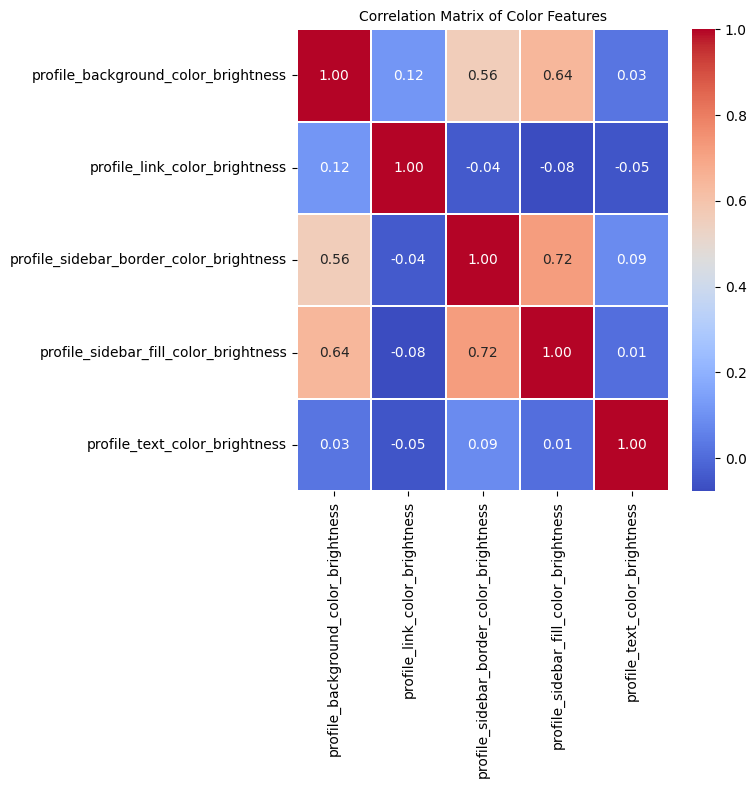

In [ ]:
# List of color-related columns (RGB components for each color)
color_columns = [
    'profile_background_color_brightness',
    'profile_link_color_brightness',
    'profile_sidebar_border_color_brightness',
    'profile_sidebar_fill_color_brightness',
    'profile_text_color_brightness'
]

# Compute the correlation matrix
corr_matrix = users[color_columns].corr()

plt.figure(figsize=(6, 6))

# Create a heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.3)
plt.title('Correlation Matrix of Color Features', fontsize=10)
plt.show()

In [ ]:
users = users.drop(['profile_background_color_r', 'profile_background_color_g', 'profile_background_color_b',
    'profile_link_color_r', 'profile_link_color_g', 'profile_link_color_b',
    'profile_sidebar_border_color_r', 'profile_sidebar_border_color_g', 'profile_sidebar_border_color_b',
    'profile_sidebar_fill_color_r', 'profile_sidebar_fill_color_g', 'profile_sidebar_fill_color_b',
    'profile_text_color_r', 'profile_text_color_g', 'profile_text_color_b',
    'profile_link_color_brightness',
    'profile_sidebar_border_color_brightness',
    'profile_sidebar_fill_color_brightness',
    'profile_text_color_brightness'
    ], axis=1)

#### Further Preprocessing Needed

*   Account Age
*   Convert Categorical to Numerical
*   Normalize Continuous Variables
*   Extract Numerical Values from Dates (If required)
*   Process Text Data (Later)


In [ ]:
# Account Age
users["account_age"] = (pd.Timestamp.now(tz="UTC") - users["created_at"]).dt.days / 365
print(f"The account_age min value (in years): {users.account_age.min()}, \nThe account_age max value (in years): {users.account_age.max()}")

The account_age min value (in years): 8.227397260273973, 
The account_age max value (in years): 18.443835616438356


In [ ]:
# Get Numeric Columns
numeric_columns = users.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'id' in numeric_columns:
    numeric_columns.remove('id')
print(f"Numeric Columns: {numeric_columns}")

# Scaling Numeric Columns (MinMax)
scaler = MinMaxScaler()
users[numeric_columns] = scaler.fit_transform(users[numeric_columns])

Numeric Columns: ['followers_count', 'friends_count', 'listed_count', 'favourites_count', 'utc_offset', 'statuses_count', 'profile_background_color_brightness', 'account_age']


In [ ]:
# Convert Boolean Columns to 0 or 1
bool_columns = users.select_dtypes(include=['bool']).columns.tolist()
print(f"boolean Columns: {bool_columns}")

users[bool_columns] = users[bool_columns].astype(int)

boolean Columns: ['geo_enabled', 'verified', 'is_translation_enabled', 'profile_background_tile', 'profile_use_background_image', 'has_extended_profile', 'default_profile', 'default_profile_image', 'depression']


In [ ]:
users["creation_year"] = users["created_at"].dt.year

#### Feature Selection
<table border="1" style="border-collapse: collapse; width: 100%; text-align: left;">
  <thead>
    <tr style="background-color: #f2f2f2;">
      <th style="padding: 8px;">Category</th>
      <th style="padding: 8px;">Features</th>
      <th style="padding: 8px;">Justification</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td style="padding: 8px;">User Influence & Engagement</td>
      <td style="padding: 8px;">followers_count, <br> friends_count, <br> listed_count, <br> statuses_count, <br> favourites_count</td>
      <td style="padding: 8px;">Social engagement level— <br> People with higher/lower engagement may exhibit different online <br>behaviors related to mental health.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Account Information</td>
      <td style="padding: 8px;">account_age</td>
      <td style="padding: 8px;">Account age—<br> Older vs. newer accounts may reflect different behavioral patterns.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Behavioral Features</td>
      <td style="padding: 8px;">geo_enabled, <br> profile_use_background_image, <br> has_extended_profile, <br> default_profile, <br> default_profile_image</td>
      <td style="padding: 8px;">Customization & privacy behavior— <br> These may indicate user engagement and personality.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Visual Preferences</td>
      <td style="padding: 8px;">profile_background_color_brightness</td>
      <td style="padding: 8px;">Color psychology— <br>
       Colors can indicate emotions and psychological states.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Verified Status</td>
      <td style="padding: 8px;">verified</td>
      <td style="padding: 8px;">Social credibility— <br> Verified users may behave differently online.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Language & Translation</td>
      <td style="padding: 8px;">is_translation_enabled </td>
      <td style="padding: 8px;">Global vs. local engagement— <br> Multilingual users might have different social patterns.</td>
    </tr>
    <tr>
      <td style="padding: 8px;">Target Variable</td>
      <td style="padding: 8px;">depression</td>
      <td style="padding: 8px;">Our regression target— <br> Deppressed or not</td>
    </tr>
  </tbody>
</table>


In [ ]:
num_cols = ['creation_year', 'geo_enabled', 'profile_use_background_image', 'has_extended_profile', 'default_profile',
    'default_profile_image', 'verified', 'is_translation_enabled']

# Define subplot layout
cols = 3  # Number of columns
rows = math.ceil(len(num_cols) / cols)  # Number of rows

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[f"Avg {var} vs Depression" for var in num_cols],
    horizontal_spacing=0.1,  # Adjust spacing
    vertical_spacing=0.1
)

# Add each variable's plot to the figure
for idx, var in enumerate(num_cols):
    row = idx // cols + 1
    col = idx % cols + 1

    variable_count = users.groupby([var, 'depression'])[var].count().unstack()

    # Add bars for each depression category
    for depression_status in [0, 1]:
        fig.add_trace(
            go.Bar(
                x=variable_count.index,
                y=variable_count[depression_status],
                name=f"Depression: {'True' if depression_status == 1 else 'False'}",
                text=variable_count[depression_status].round(2),  # Round for better display
                textposition='outside',
                width=0.2,
                marker=dict(line=dict(width=2, color='rgba(0,0,0,1)'), opacity=1)
            ),
            row=row, col=col
            )

# Update layout
fig.update_layout(
    title="Comparison of Numerical Features with Depression",
    height=rows * 300,  # Adjust height dynamically
    width=1200,  # Set width for better visibility
    plot_bgcolor='rgba(34, 34, 34, 1)',
    paper_bgcolor='rgba(34, 34, 34, 1)',
    font=dict(color='white'),
    barmode='group',  # Ensures bars for depression=True and False are placed side by side
    showlegend=False
)

fig.show()

In [ ]:
# Numerical columns
num_cols = [
    'followers_count', 'friends_count', 'listed_count', 'favourites_count', 'statuses_count',
    'profile_background_color_brightness', 'account_age'
]

# Define subplot layout
cols = 3  # Number of columns
rows = math.ceil(len(num_cols) / cols)  # Number of rows

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[f"Avg {var} vs Depression" for var in num_cols],
    horizontal_spacing=0.1,  # Adjust spacing
    vertical_spacing=0.1
)

# Add each variable's plot to the figure
for idx, var in enumerate(num_cols):
    row = idx // cols + 1
    col = idx % cols + 1

    variable_count = users.groupby('depression')[var].mean()

    fig.add_trace(
        go.Bar(
            x=variable_count.index,
            y=variable_count.values,
            marker_color='rgb(156, 39, 176)',
            text=variable_count.round(2),
            textposition='outside',
            width=0.2,
            marker=dict(line=dict(width=1, color='rgba(0,0,0,1)'), opacity=1)
        ),
        row=row, col=col
    )

# Update layout
fig.update_layout(
    title="Comparison of Numerical Features with Depression",
    height=rows * 300,  # Adjust height dynamically
    width=1200,  # Set width for better visibility
    plot_bgcolor='rgba(34, 34, 34, 1)',
    paper_bgcolor='rgba(34, 34, 34, 1)',
    font=dict(color='white'),
    showlegend=False
)

fig.show()

In [ ]:
# Extract numeric and categorical columns
num_cols = users.select_dtypes(include=[np.number]).columns

# Assuming `train_data` is your DataFrame and `num_cols` is a list of numerical columns
corr_matrix = users[num_cols].corr()

fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='Viridis',
    colorbar=dict(title='Correlation'),
))

fig.update_layout(
    title='Correlation Heatmap',
    xaxis_title='Features',
    yaxis_title='Features',
    width=800,
    height=700,
    template='plotly_dark',  # Use dark theme
)

fig.show()

In [ ]:
users = users[['id', 'followers_count', 'friends_count', 'listed_count', 'favourites_count', 'statuses_count', 'geo_enabled', 'profile_use_background_image', 'has_extended_profile', 'default_profile', 'default_profile_image', 'profile_background_color_brightness', 'account_age', 'verified', 'is_translation_enabled', 'depression']]

In [ ]:
users

,id,followers_count,friends_count,listed_count,favourites_count,statuses_count,geo_enabled,profile_use_background_image,has_extended_profile,default_profile,default_profile_image,profile_background_color_brightness,account_age,verified,is_translation_enabled,depression
3643,1057022347,0.000471,0.004931,0.000240,0.005445,0.002718,0,1,1,0,0,0.106498,0.394208,0,0,0
1636,171999132,0.000255,0.016718,0.000601,0.001973,0.000604,0,1,0,0,0,0.282984,0.632609,0,0,0
4703,751907980405198848,0.001638,0.000828,0.005766,0.099888,0.006630,0,0,0,0,0,0.000000,0.049879,0,0,0
2992,2236408118,0.005013,0.036608,0.000841,0.005770,0.002221,0,1,0,0,0,1.000000,0.303030,0,0,1
5502,434369401,0.000197,0.002477,0.000120,0.009385,0.008613,0,1,0,1,0,0.842118,0.498257,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,322279406,0.000933,0.003038,0.000240,0.024547,0.011156,1,0,1,0,0,0.486122,0.544382,0,0,1
5191,1895493180,0.007947,0.041326,0.002883,0.049556,0.017103,1,1,1,0,0,0.842118,0.323679,0,0,1
5390,2317448645,0.000643,0.006225,0.000120,0.002508,0.003144,0,1,0,1,0,0.842118,0.288549,0,0,1
860,21038530,0.000003,0.000039,0.000000,0.000000,0.000003,0,1,0,1,1,0.842118,0.773934,0,0,1


In [ ]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11051 entries, 3643 to 1371
Data columns (total 16 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   11051 non-null  int64  
 1   followers_count                      11051 non-null  float64
 2   friends_count                        11051 non-null  float64
 3   listed_count                         11051 non-null  float64
 4   favourites_count                     11051 non-null  float64
 5   statuses_count                       11051 non-null  float64
 6   geo_enabled                          11051 non-null  int64  
 7   profile_use_background_image         11051 non-null  int64  
 8   has_extended_profile                 11051 non-null  int64  
 9   default_profile                      11051 non-null  int64  
 10  default_profile_image                11051 non-null  int64  
 11  profile_background_color_bright

### Timeline Data

#### Timeline




##### Timeline Positive Data

In [ ]:
df_timeline_pos["user_id"] = df_timeline_pos["user"].progress_apply(lambda x: x.get("id") if isinstance(x, dict) else None)
print(f"\n{df_timeline_pos.user_id.nunique()}")

100%|██████████| 506158/506158 [00:01<00:00, 408878.25it/s]


2512


In [ ]:
df_timeline_pos.columns

Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'retweet_count', 'favorite_count',
       'favorited', 'retweeted', 'possibly_sensitive', 'lang',
       'extended_entities', 'retweeted_status', 'quoted_status_id',
       'quoted_status_id_str', 'quoted_status', 'withheld_scope',
       'withheld_copyright', 'withheld_in_countries', 'user_id'],
      dtype='object')

In [ ]:
df_timeline_pos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506158 entries, 0 to 506157
Data columns (total 33 columns):
 #   Column                     Non-Null Count   Dtype              
---  ------                     --------------   -----              
 0   created_at                 506158 non-null  datetime64[ns, UTC]
 1   id                         506158 non-null  int64              
 2   id_str                     506158 non-null  int64              
 3   text                       506158 non-null  object             
 4   truncated                  506158 non-null  bool               
 5   entities                   506158 non-null  object             
 6   source                     506158 non-null  object             
 7   in_reply_to_status_id      117609 non-null  float64            
 8   in_reply_to_status_id_str  117609 non-null  float64            
 9   in_reply_to_user_id        135908 non-null  float64            
 10  in_reply_to_user_id_str    135908 non-null  float64     

In [ ]:
# Number of duplicate rows
red_rows_all_data = df_timeline_pos.duplicated(['created_at', 'id', 'id_str', 'text', 'truncated', 'source',
                                                'in_reply_to_status_id', 'in_reply_to_status_id_str',
                                                'in_reply_to_user_id', 'in_reply_to_user_id_str',
                                                'in_reply_to_screen_name', 'contributors', 'is_quote_status',
                                                'retweet_count', 'favorite_count', 'favorited', 'retweeted',
                                                'possibly_sensitive', 'lang', 'quoted_status_id', 'quoted_status_id_str',
                                                'withheld_scope', 'withheld_copyright', 'user_id']).sum()
print(f"Number of redundant rows: {red_rows_all_data}")

red_rows = df_timeline_pos.duplicated(subset=['user_id', 'text']).sum()
print(f"Number of redundant rows (on user_id and tweet): {red_rows}")

df_timeline_pos = df_timeline_pos.drop_duplicates(subset=["user_id", "text"])

Number of redundant rows: 15442
Number of redundant rows (on user_id and tweet): 18099


In [ ]:
df_timeline_pos

,created_at,id,id_str,text,truncated,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,lang,extended_entities,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status,withheld_scope,withheld_copyright,withheld_in_countries,user_id
0,2015-01-14 01:05:16+00:00,555168736664363009,555168736664363008,Lady Sings the Blues - 'I was diagnosed with c...,False,"{'hashtags': [{'text': 'mentalhealth', 'indice...","<a href=""http://www.hootsuite.com"" rel=""nofoll...",NaN,NaN,NaN,...,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88746594
1,2015-01-13 19:05:24+00:00,555078174368088064,555078174368088064,Looking for a book that helps explain mental h...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://www.hootsuite.com"" rel=""nofoll...",NaN,NaN,NaN,...,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88746594
2,2015-01-13 13:40:21+00:00,554996372123156480,554996372123156480,What is #mentalillness ? http://t.co/JXz6622Rfy,False,"{'hashtags': [{'text': 'mentalillness', 'indic...","<a href=""http://www.hootsuite.com"" rel=""nofoll...",NaN,NaN,NaN,...,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88746594
3,2015-01-13 01:05:15+00:00,554806345573339136,554806345573339136,Check out our online bookstore to read up on #...,False,"{'hashtags': [{'text': 'mentalhealth', 'indice...","<a href=""http://www.hootsuite.com"" rel=""nofoll...",NaN,NaN,NaN,...,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88746594
4,2015-01-13 00:50:16+00:00,554802576374628352,554802576374628352,Does Legalizing #Marijuana Also Lower Overdose...,False,"{'hashtags': [{'text': 'Marijuana', 'indices':...","<a href=""http://www.hootsuite.com"" rel=""nofoll...",NaN,NaN,NaN,...,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88746594
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
506146,2015-12-31 08:01:46+00:00,682471696234840064,682471696234840064,"@ItsJRE I've been with EXO for a long time, an...",False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",6.818503e+17,6.818503e+17,432587869.0,...,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,583084366
506147,2015-12-31 08:01:06+00:00,682471528928292864,682471528928292864,"@ItsJRE He may be my bias, but it's not just b...",False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",6.818503e+17,6.818503e+17,432587869.0,...,en,"{'media': [{'id': 682471485076848641, 'id_str'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,583084366
506148,2015-12-31 08:00:00+00:00,682471249013043201,682471249013043200,@ItsJRE He pushes himself so hard and strives ...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",6.818503e+17,6.818503e+17,432587869.0,...,en,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,583084366
506149,2015-12-31 07:58:17+00:00,682470819893739520,682470819893739520,@ItsJRE Kai's dedication inspired me to get ba...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",6.818503e+17,6.818503e+17,432587869.0,...,en,"{'media': [{'id': 682470791800320000, 'id_str'...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,583084366


In [ ]:
df_timeline_pos = df_timeline_pos[df_timeline_pos['lang']=='en']

In [ ]:
df_timeline_pos.truncated.nunique(), df_timeline_pos.source.nunique(), df_timeline_pos.contributors.nunique(), df_timeline_pos.possibly_sensitive.nunique(), df_timeline_pos.lang.nunique(), df_timeline_pos.withheld_scope.nunique(), df_timeline_pos.withheld_copyright.nunique()

(1, 263, 0, 2, 1, 1, 1)

In [ ]:
df_timeline_pos.drop(['contributors', 'lang', 'withheld_scope', 'user',
                      'withheld_copyright', 'withheld_in_countries'], axis=1, inplace=True)

<ipython-input-81-936334cb45e6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timeline_pos.drop(['contributors', 'lang', 'withheld_scope', 'user',


##### Timeline Negative Data

In [ ]:
save_path1 = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_neg_1_3.csv"
df_timeline_neg1 = pd.read_csv(save_path1)

save_path2 = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_neg_2_3.csv"
df_timeline_neg2 = pd.read_csv(save_path2)

save_path3 = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_neg_3_3.csv"
df_timeline_neg3 = pd.read_csv(save_path3)

df_timeline_neg = pd.concat([df_timeline_neg1, df_timeline_neg2, df_timeline_neg3], axis=0, ignore_index=True)

df_timeline_neg["user"] = df_timeline_neg["user"].progress_apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
df_timeline_neg["user_id"] = df_timeline_neg["user"].progress_apply(lambda x: x.get("id") if isinstance(x, dict) else None)
print(df_timeline_neg["user_id"].nunique())

<ipython-input-3-ed3f5068f101>:2: DtypeWarning: Columns (13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  df_timeline_neg1 = pd.read_csv(save_path1)
<ipython-input-3-ed3f5068f101>:5: DtypeWarning: Columns (13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  df_timeline_neg2 = pd.read_csv(save_path2)
<ipython-input-3-ed3f5068f101>:8: DtypeWarning: Columns (27,28,29) have mixed types. Specify dtype option on import or set low_memory=False.
  df_timeline_neg3 = pd.read_csv(save_path3)
100%|██████████| 2711606/2711606 [00:03<00:00, 727344.70it/s]

3966


In [ ]:
df_timeline_neg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2711606 entries, 0 to 2711605
Data columns (total 31 columns):
 #   Column                     Dtype  
---  ------                     -----  
 0   created_at                 object 
 1   id                         int64  
 2   id_str                     int64  
 3   text                       object 
 4   truncated                  bool   
 5   entities                   object 
 6   source                     object 
 7   in_reply_to_status_id      float64
 8   in_reply_to_status_id_str  float64
 9   in_reply_to_user_id        float64
 10  in_reply_to_user_id_str    float64
 11  in_reply_to_screen_name    object 
 12  user                       object 
 13  geo                        object 
 14  coordinates                object 
 15  place                      object 
 16  contributors               float64
 17  is_quote_status            bool   
 18  retweet_count              int64  
 19  favorite_count             int64  
 20  fa

In [ ]:
# Number of duplicate rows
red_rows_all_data = df_timeline_neg.duplicated(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities',
                                       'source', 'in_reply_to_status_id', 'in_reply_to_status_id_str',
                                       'in_reply_to_user_id', 'in_reply_to_user_id_str',
                                       'in_reply_to_screen_name', 'geo', 'coordinates', 'place',
                                       'contributors', 'is_quote_status', 'retweet_count', 'favorite_count',
                                       'favorited', 'retweeted', 'possibly_sensitive', 'lang',
                                       'extended_entities', 'quoted_status_id', 'quoted_status_id_str',
                                       'withheld_scope', 'withheld_copyright', 'withheld_in_countries',
                                       'user_id']).sum()
print(f"Number of redundant rows: {red_rows_all_data}")

red_rows = df_timeline_neg.duplicated(subset=["user_id", "text"]).sum()
print(f"Number of redundant rows (on user_id and tweet): {red_rows}")

df_timeline_neg = df_timeline_neg.drop_duplicates(subset=["user_id", "text"])

Number of redundant rows: 763312
Number of redundant rows (on user_id and tweet): 1023645


In [ ]:
df_timeline_neg = df_timeline_neg[df_timeline_neg['lang']=='en']

In [ ]:
df_timeline_neg.columns

Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place',
       'contributors', 'is_quote_status', 'retweet_count', 'favorite_count',
       'favorited', 'retweeted', 'possibly_sensitive', 'lang',
       'extended_entities', 'quoted_status_id', 'quoted_status_id_str',
       'withheld_scope', 'withheld_copyright', 'withheld_in_countries',
       'user_id'],
      dtype='object')

In [ ]:
df_timeline_neg.truncated.nunique(), df_timeline_neg.entities.nunique(), df_timeline_neg.source.nunique(), df_timeline_neg.geo.nunique(), df_timeline_neg.place.nunique(), df_timeline_neg.contributors.nunique(), df_timeline_neg.possibly_sensitive.nunique(), df_timeline_neg.lang.nunique(), df_timeline_neg.withheld_scope.nunique(), df_timeline_neg.withheld_copyright.nunique(), df_timeline_neg.withheld_in_countries.nunique(),

(2, 399406, 319, 915, 1250, 0, 2, 1, 1, 1, 1)

In [ ]:
df_timeline_neg.drop(['contributors', 'lang', 'withheld_scope', 'user',
                      'withheld_copyright', 'withheld_in_countries'], axis=1, inplace=True)

In [ ]:
df_timeline_neg

,created_at,id,id_str,text,truncated,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,extended_entities,quoted_status_id,quoted_status_id_str,user_id
0,Mon Jan 09 05:21:13 +0000 2017,818326742515544065,818326742515544065,RT alshlaqy: Techecho_Ar \nFile manager,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://ifttt.com"" rel=""nofollow"">IFTT...",NaN,NaN,NaN,...,False,0,0,False,False,NaN,NaN,NaN,NaN,2451860677
1,Fri Jan 06 18:53:39 +0000 2017,817444033991741440,817444033991741440,RT HmoodePhone: Techecho_Ar twitter,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://ifttt.com"" rel=""nofollow"">IFTT...",NaN,NaN,NaN,...,False,0,0,False,False,NaN,NaN,NaN,NaN,2451860677
2,Fri Jan 06 18:18:07 +0000 2017,817435090989023232,817435090989023232,RT GhoshehTareq: Techecho_Ar google fit,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://ifttt.com"" rel=""nofollow"">IFTT...",NaN,NaN,NaN,...,False,0,0,False,False,NaN,NaN,NaN,NaN,2451860677
3,Wed Jan 11 16:57:31 +0000 2017,819226748344737794,819226748344737794,baby https://t.co/Xwh4Psk7CF,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/android"" ...",NaN,NaN,NaN,...,False,1,2,False,False,False,"{'media': [{'id': 819226277462863873, 'id_str'...",NaN,NaN,390569110
4,Sun Jan 08 21:37:28 +0000 2017,818210034857496576,818210034857496576,[MV] AFTER SCHOOL '첫사랑(First Love)' Music Vid...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",NaN,NaN,NaN,...,False,0,0,False,False,False,NaN,NaN,NaN,390569110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1089910,Wed Dec 14 11:19:26 +0000 2016,808994806722600960,808994806722600960,I liked a @YouTube video from @chaboyyhd https...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://www.google.com/"" rel=""nofollow...",NaN,NaN,NaN,...,False,0,0,False,False,False,NaN,NaN,NaN,390684514
1089911,Wed Dec 14 10:58:37 +0000 2016,808989567722422272,808989567722422272,I liked a @YouTube video from @taraartsgame ht...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://www.google.com/"" rel=""nofollow...",NaN,NaN,NaN,...,False,0,0,False,False,False,NaN,NaN,NaN,390684514
1089912,Wed Dec 14 09:12:53 +0000 2016,808962955740151808,808962955740151808,I liked a @YouTube video from @taraartsgame ht...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://www.google.com/"" rel=""nofollow...",NaN,NaN,NaN,...,False,0,0,False,False,False,NaN,NaN,NaN,390684514
1089913,Wed Dec 14 09:05:40 +0000 2016,808961139539316736,808961139539316736,I liked a @YouTube video from @ketendangs http...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://www.google.com/"" rel=""nofollow...",NaN,NaN,NaN,...,False,0,0,False,False,False,NaN,NaN,NaN,390684514


In [ ]:
df_timeline_neg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1089915 entries, 0 to 1089914
Data columns (total 25 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   created_at                 1089915 non-null  object 
 1   id                         1089915 non-null  int64  
 2   id_str                     1089915 non-null  int64  
 3   text                       1089915 non-null  object 
 4   truncated                  1089915 non-null  bool   
 5   entities                   1089915 non-null  object 
 6   source                     1089566 non-null  object 
 7   in_reply_to_status_id      437243 non-null   float64
 8   in_reply_to_status_id_str  437243 non-null   float64
 9   in_reply_to_user_id        464239 non-null   float64
 10  in_reply_to_user_id_str    464239 non-null   float64
 11  in_reply_to_screen_name    464239 non-null   object 
 12  geo                        2107 non-null     object 
 13  coordinates 

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_neg.csv"
df_timeline_neg.to_csv(save_path, index=False)

#### Collect Data from Negative Users (non-depressed) and Positive Users (depressed)

Data Collection and cvs Saving

In [ ]:
df_timeline_neg['depression'] = False  # Negative Data
df_timeline_pos['depression'] = True   # Positive Data

df_timeline = pd.concat([df_timeline_neg, df_timeline_pos])

# Shuffling rows
df_timeline = df_timeline.sample(frac=1, random_state=42)
df_timeline.shape

<ipython-input-82-a899ea551654>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timeline_pos['depression'] = True   # Positive Data


(1533646, 28)

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/timeline_full_data.csv"
df_timeline.to_csv(save_path, index=False)

In [ ]:
# Count the number of rows for each unique user_id for df_timeline_pos
user_counts_pos = df_timeline[df_timeline['depression']==True].groupby('user_id').size().reset_index(name='count')
user_counts_pos = user_counts_pos.sort_values(by='count', ascending=False)

# Count the number of rows for each unique user_id for df_timeline_neg
user_counts_neg = df_timeline[df_timeline['depression']==False].groupby('user_id').size().reset_index(name='count')
user_counts_neg = user_counts_neg.sort_values(by='count', ascending=False)

In [ ]:
user_counts_pos['count'].describe(), user_counts_neg['count'].describe()

(count    2511.000000
 mean      176.714855
 std       256.744771
 min         1.000000
 25%        31.000000
 50%        92.000000
 75%       210.000000
 max      2537.000000
 Name: count, dtype: float64,
 count    3586.000000
 mean      303.936141
 std       461.632668
 min         1.000000
 25%        27.000000
 50%       112.000000
 75%       360.750000
 max      2928.000000
 Name: count, dtype: float64)

In [ ]:
df_timeline.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1533646 entries, 242408 to 121958
Data columns (total 28 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   created_at                 1533646 non-null  object 
 1   id                         1533646 non-null  int64  
 2   id_str                     1533646 non-null  int64  
 3   text                       1533646 non-null  object 
 4   truncated                  1533646 non-null  bool   
 5   entities                   1533646 non-null  object 
 6   source                     1533297 non-null  object 
 7   in_reply_to_status_id      537838 non-null   float64
 8   in_reply_to_status_id_str  537838 non-null   float64
 9   in_reply_to_user_id        580304 non-null   float64
 10  in_reply_to_user_id_str    580304 non-null   float64
 11  in_reply_to_screen_name    580304 non-null   object 
 12  geo                        6274 non-null     object 
 13  coordinates  

#### Feature Engineering

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline_full_data.csv"
df_timeline = pd.read_csv(file_path)

In [ ]:
df_timeline

,created_at,id,id_str,text,truncated,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,favorited,retweeted,possibly_sensitive,extended_entities,quoted_status_id,quoted_status_id_str,user_id,depression,retweeted_status,quoted_status
0,Mon Jan 09 19:41:44 +0000 2017,818543297144688640,818543297144688640,I will never get over this https://t.co/BtCGeh...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,...,False,False,False,"{'media': [{'id': 818543074066530304, 'id_str'...",NaN,NaN,818496156397355008,False,NaN,NaN
1,Wed Dec 21 06:21:15 +0000 2016,811456478380953600,811456478380953600,@mswro2012 @BFCDrinkers said New York was mile...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.113686e+17,8.113686e+17,9.048069e+08,...,False,False,NaN,NaN,NaN,NaN,156719664,False,NaN,NaN
2,Sun Dec 18 14:48:50 +0000 2016,810497052035731456,810497052035731456,Having a boyfriend is just keeping one another...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://www.facebook.com/twitter"" rel=...",NaN,NaN,NaN,...,False,False,False,NaN,NaN,NaN,780398708114481152,False,NaN,NaN
3,Thu Dec 29 21:48:00 +0000 2016,814588806636666880,814588806636666880,@beano160 @Holly_Cxoxo @Tiger_BW That is still...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.145786e+17,8.145786e+17,1.652448e+09,...,False,False,NaN,NaN,NaN,NaN,4092129317,False,NaN,NaN
4,Sun Jan 08 16:17:26 +0000 2017,818129493613121537,818129493613121537,@deanzail I see.. How come you know about that,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.181289e+17,8.181289e+17,3.314997e+09,...,False,False,NaN,NaN,NaN,NaN,759763192331460609,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1533641,Tue Dec 20 09:00:20 +0000 2016,811134125306429440,811134125306429440,I enjoy shit so different,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://github.com/boodoo/ebooks_exam...",NaN,NaN,NaN,...,False,False,NaN,NaN,NaN,NaN,757273993485221888,False,NaN,NaN
1533642,2016-01-08 22:25:47+00:00,685588236836712448,685588236836712448,RT @GirlOxygen: Why wouldn't you wanna laugh w...,False,"{'hashtags': [{'text': 'UndateableLive', 'indi...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,...,False,False,NaN,NaN,NaN,NaN,4012254483,True,{'created_at': 'Fri Jan 08 21:29:38 +0000 2016...,NaN
1533643,Tue Dec 20 09:38:18 +0000 2016,811143680191033344,811143680191033344,@KonceptzJa looool look like the entire bottle,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.111436e+17,8.111436e+17,2.988038e+08,...,False,False,NaN,NaN,NaN,NaN,3920877853,False,NaN,NaN
1533644,Fri Dec 30 11:18:49 +0000 2016,814792855042588673,814792855042588673,@aneeqa_shaikh ya Allah. I've lost my energy f...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",8.147927e+17,8.147927e+17,3.104462e+08,...,False,False,NaN,NaN,NaN,NaN,2503930410,False,NaN,NaN


In [ ]:
# Feature Engineering From Structured Data


df_timeline["created_at"] = df_timeline["created_at"].progress_apply(lambda x: x if isinstance(x, pd.Timestamp) else parser.parse(str(x)))
#df_timeline["created_at"] = pd.to_datetime(df_timeline["created_at"], utc=True)
print(df_timeline["created_at"].apply(type).value_counts())

# Step 1: Extract source information and count unique sources per user
def clean_source(df):
    df["source"] = df["source"].str.extract(r'>(.*?)<')
    source_counts = df.groupby("user_id")["source"].nunique().reset_index()
    source_counts.rename(columns={"source": "unique_sources"}, inplace=True)
    return df, source_counts

df_timeline, df_source = clean_source(df_timeline)

# Step 2: Feature Engineering for Varying Features
def compute_aggregates(df):
    return df.groupby("user_id").agg(
        total_retweets=("retweet_count", "sum"),
        total_favorites=("favorite_count", "sum"),
        avg_retweets=("retweet_count", "mean"),
        avg_favorites=("favorite_count", "mean"),
        tweet_count=("text", "count"),
    ).reset_index()

df_agg = compute_aggregates(df_timeline)

# Step 3: Compute Tweet Frequency
def compute_tweet_frequency(df):
    df_sorted = df.sort_values(by=["user_id", "created_at"])
    df_sorted["time_diff"] = df_sorted.groupby("user_id")["created_at"].diff().dt.total_seconds()

    tweet_freq = df_sorted.groupby("user_id").agg(
        mean_time_gap=("time_diff", "mean"),
        median_time_gap=("time_diff", "median"),
        std_time_gap=("time_diff", "std"),
        total_timespan=("created_at", lambda x: (x.max() - x.min()).total_seconds()),
    ).reset_index()

    # Compute total number of tweets per user
    tweet_counts = df_sorted.groupby("user_id")["text"].count()

    # Ensure 'total_timespan' is not zero to avoid division errors
    tweet_freq["tweet_rate"] = tweet_freq.progress_apply(
        lambda row: 1 if row["total_timespan"] == 0 else tweet_counts.get(row["user_id"], 0) / (row["total_timespan"] / 86400),
        axis=1
    )
    #tweet_freq["tweet_rate"] = tweet_freq["total_timespan"].apply(lambda x: 1 if x == 0 else df_sorted.groupby("user_id")["text"].count() / (x / 86400))  # Tweets per day

    return tweet_freq

df_freq = compute_tweet_frequency(df_timeline)

# Step 3: Compute Quote-Based Features
def compute_quote_features(df):
    quote_features = df.groupby("user_id").agg(
        total_quotes=("is_quote_status", "sum"),
        quote_ratio=("is_quote_status", "mean")
    ).reset_index()

    quoted_interactions = df[df["quoted_status_id"].notna()].merge(
        df[["user_id", "depression"]].rename(columns={"user_id": "quoted_status_id", "depression": "quoted_depressed"}),
        on="quoted_status_id", how="left"
    )

    quoted_counts = quoted_interactions.groupby("user_id")["quoted_depressed"].sum().reset_index()
    quoted_counts.rename(columns={"quoted_depressed": "quotes_from_depressed"}, inplace=True)

    total_quotes = quoted_interactions.groupby("user_id")["quoted_depressed"].count().reset_index()
    total_quotes.rename(columns={"quoted_depressed": "total_quotes"}, inplace=True)

    quoted_counts = quoted_counts.merge(total_quotes, on="user_id", how="left")
    quoted_counts["quotes_from_non_depressed"] = quoted_counts["total_quotes"] - quoted_counts["quotes_from_depressed"]

    return quote_features.merge(quoted_counts, on="user_id", how="left")

df_quotes = compute_quote_features(df_timeline)

# Step 4: Compute Interaction-Based Features
def compute_interaction_features(df):
    interactions = df.groupby("user_id")["in_reply_to_user_id"].nunique().reset_index()
    interactions.rename(columns={"in_reply_to_user_id": "unique_interactions"}, inplace=True)

    depressed_interactions = df[df["in_reply_to_user_id"].notna()].merge(
        df[["user_id", "depression"]].rename(columns={"user_id": "in_reply_to_user_id", "depression": "reply_depressed"}),
        on="in_reply_to_user_id", how="left"
    )

    depressed_counts = depressed_interactions.groupby("user_id")["reply_depressed"].sum().reset_index()
    depressed_counts.rename(columns={"reply_depressed": "interactions_with_depressed"}, inplace=True)

    total_interactions = depressed_interactions.groupby("user_id")["reply_depressed"].count().reset_index()
    total_interactions.rename(columns={"reply_depressed": "total_interactions"}, inplace=True)

    depressed_counts = depressed_counts.merge(total_interactions, on="user_id", how="left")
    depressed_counts["interactions_with_non_depressed"] = depressed_counts["total_interactions"] - depressed_counts["interactions_with_depressed"]

    return interactions.merge(depressed_counts, on="user_id", how="left")

df_interactions = compute_interaction_features(df_timeline)

# Step 5: Remove Duplicate Tweets
df_unique = df_timeline.drop_duplicates(subset=["user_id", "text"])


# Merge all processed data
df_final = df_agg.merge(df_freq, on="user_id", how="left")\
                   .merge(df_interactions, on="user_id", how="left")\
                   .merge(df_source, on="user_id", how="left")\
                   .merge(df_quotes, on="user_id", how="left")

# Keep the depression label
df_final = df_final.merge(df_timeline[["user_id", "depression"]].drop_duplicates(), on="user_id", how="left")

# Drop unnecessary columns
df_final.drop(columns=["total_timespan"], inplace=True)

100%|██████████| 1533646/1533646 [02:26<00:00, 10474.90it/s]


created_at
<class 'pandas._libs.tslibs.timestamps.Timestamp'>    1533646
Name: count, dtype: int64


100%|██████████| 6097/6097 [00:00<00:00, 77527.48it/s]


In [ ]:
# Feature Engineering From Unstructured Data (Text)


# Step 6: Aggregate Text per User
def aggregate_text(df):
    return df.groupby("user_id")["text"].apply(lambda x: " ".join(x)).reset_index()

df_text = aggregate_text(df_unique)

# Step 7: Aggregate Entities per User into Separate Text Columns
def aggregate_entities_text(df):
    def merge_entities(entities_list):
        aggregated = {"hashtags": set(), "symbols": set()}

        for entity in entities_list:
            entity_dict = ast.literal_eval(entity)  # Convert string to dictionary

            # Extract the text field from dictionaries
            hashtags = [h["text"] for h in entity_dict.get("hashtags", [])]
            symbols = [s["text"] for s in entity_dict.get("symbols", [])]

            aggregated["hashtags"].update(hashtags)
            aggregated["symbols"].update(symbols)

        # Convert sets to comma-separated text strings
        return (
            ", ".join(aggregated["hashtags"]),
            ", ".join(aggregated["symbols"])
        )

    # Apply function to grouped data
    entity_df = df.groupby("user_id")["entities"].apply(merge_entities).reset_index()

    # Expand tuple into separate columns
    entity_df[["hashtags", "symbols"]] = pd.DataFrame(entity_df["entities"].tolist(), index=entity_df.index)
    entity_df.drop(columns=["entities"], inplace=True)

    return entity_df

df_entities = aggregate_entities_text(df_timeline)

# Merge each entity type into final dataset
df_final = df_final.merge(df_entities, on="user_id", how="left")

In [ ]:
!pip install wordsegment
from wordsegment import load, segment

# Load word corpus
load()
# Example function to split hashtags
def split_hashtag(hashtag):
    return " ".join(segment(hashtag.lstrip("#")))  # Remove # and segment words
# Example
print(split_hashtag("#tellittomyheart"))
# Output: 'tell it to my heart'

df_final[["hashtags", "symbols"]] = df_final[["hashtags", "symbols"]].replace("", np.nan)

df_final[df_final['hashtags'].notna()][['hashtags', 'depression']]

,hashtags,depression
0,"DominionS3, Free2BeYOU, Free2Luv, depressionaw...",True
1,"12sEverywhere, LegionOfBoom, twitterbowl, MedH...",True
2,"TheLongDark, help, posts, NotAllAtheists, fall...",True
5,"4Corners, LordSugarBook, Amazon, miningboom, A...",True
6,"tellittomyheart, PS4share, gregisms, 205Live, ...",False
...,...,...
3487,"DMmeTriz, AskCamDatingAdvice, DMMETRIZ",False
3489,freethenipples,False
3493,"BlackLivesMatter, Kardashians, Hollywood, Kard...",False
3494,"銀魂クラスタと繋がりたい, 銀魂なりきりさんと繋がりたい, RTした人全員フォローする, R...",False


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6097 entries, 0 to 6096
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   user_id                          6097 non-null   int64  
 1   total_retweets                   6097 non-null   int64  
 2   total_favorites                  6097 non-null   int64  
 3   avg_retweets                     6097 non-null   float64
 4   avg_favorites                    6097 non-null   float64
 5   tweet_count                      6097 non-null   int64  
 6   mean_time_gap                    5922 non-null   float64
 7   median_time_gap                  5922 non-null   float64
 8   std_time_gap                     5817 non-null   float64
 9   tweet_rate                       6097 non-null   float64
 10  unique_interactions              6097 non-null   int64  
 11  interactions_with_depressed      5041 non-null   object 
 12  total_interactions  

In [ ]:
# Fill 'mean_time_gap' with the mean value of people with the same depression condition (Only one value was missing)
df_final['mean_time_gap'] = df_final.groupby('depression')['mean_time_gap'].transform(lambda x: x.fillna(x.mean()))
df_final['median_time_gap'] = df_final.groupby('depression')['median_time_gap'].transform(lambda x: x.fillna(x.mean()))
df_final['std_time_gap'] = df_final.groupby('depression')['std_time_gap'].transform(lambda x: x.fillna(x.mean()))

# Fill nan values in 'interactions_with_depressed', 'total_interactions', and 'interactions_with_non_depressed' with 0 (There were no interactions)
df_final['interactions_with_depressed'] = df_final['interactions_with_depressed'].fillna(0)
df_final['total_interactions'] = df_final['total_interactions'].fillna(0)
df_final['interactions_with_non_depressed'] = df_final['interactions_with_non_depressed'].fillna(0)

# Drop the 'quotes_from_depressed' and 'quotes_from_non_depressed' columns (we can also fill with 0; no interactions)
df_final = df_final.drop(columns=['quotes_from_depressed', 'total_quotes_y', 'quotes_from_non_depressed'])

"""
df_final['quotes_from_depressed'] = df_final['quotes_from_depressed'].fillna(0)
df_final['total_quotes_y'] = df_final['total_quotes_y'].fillna(0)
df_final['quotes_from_non_depressed'] = df_final['quotes_from_non_depressed'].fillna(0)
"""

<ipython-input-8-6b6f6c6e2d04>:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_final['interactions_with_depressed'] = df_final['interactions_with_depressed'].fillna(0)
<ipython-input-8-6b6f6c6e2d04>:9: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_final['interactions_with_non_depressed'] = df_final['interactions_with_non_depressed'].fillna(0)


"\ndf_final['quotes_from_depressed'] = df_final['quotes_from_depressed'].fillna(0)\ndf_final['total_quotes_y'] = df_final['total_quotes_y'].fillna(0)\ndf_final['quotes_from_non_depressed'] = df_final['quotes_from_non_depressed'].fillna(0)\n"

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_structured_data.csv"
df_final.to_csv(save_path, index=False)

#### Data Exploration

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_structured_data.csv"
df_final = pd.read_csv(save_path)

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6097 entries, 0 to 6096
Data columns (total 18 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   user_id                          6097 non-null   int64  
 1   total_retweets                   6097 non-null   int64  
 2   total_favorites                  6097 non-null   int64  
 3   avg_retweets                     6097 non-null   float64
 4   avg_favorites                    6097 non-null   float64
 5   tweet_count                      6097 non-null   int64  
 6   mean_time_gap                    6097 non-null   float64
 7   median_time_gap                  6097 non-null   float64
 8   std_time_gap                     6097 non-null   float64
 9   tweet_rate                       6097 non-null   float64
 10  unique_interactions              6097 non-null   int64  
 11  interactions_with_depressed      6097 non-null   int64  
 12  total_interactions  

In [ ]:
# Extract numeric and categorical columns
num_cols = df_final.select_dtypes(include=[np.number]).columns
cat_cols = df_final.select_dtypes(exclude=[np.number]).columns

In [ ]:
num_cols

Index(['user_id', 'total_retweets', 'total_favorites', 'avg_retweets',
       'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
       'std_time_gap', 'tweet_rate', 'unique_interactions',
       'interactions_with_depressed', 'total_interactions',
       'interactions_with_non_depressed', 'unique_sources', 'total_quotes_x',
       'quote_ratio'],
      dtype='object')

In [ ]:
# Summary statistics for numerical features
df_final[num_cols].describe()

,user_id,total_retweets,total_favorites,avg_retweets,avg_favorites,tweet_count,mean_time_gap,median_time_gap,std_time_gap,tweet_rate,unique_interactions,interactions_with_depressed,total_interactions,interactions_with_non_depressed,unique_sources,total_quotes_x,quote_ratio
count,6.097000e+03,6.097000e+03,6097.000000,6097.000000,6097.000000,6097.000000,6.097000e+03,6.097000e+03,6.097000e+03,6097.000000,6097.000000,6097.000000,6.097000e+03,6.097000e+03,6097.000000,6097.000000,6097.000000
mean,7.595613e+16,6.548225e+04,336.788093,366.848800,1.249189,251.541086,7.217351e+04,4.264866e+04,9.757328e+04,57.701129,24.402493,612.233557,1.095861e+04,1.034638e+04,2.079711,3.092176,0.011853
std,2.291582e+17,4.412404e+05,4356.195388,2544.205993,19.290643,395.458497,1.864587e+05,1.645195e+05,3.575117e+05,2222.225607,66.810997,8391.474641,9.774250e+04,9.744603e+04,1.325555,10.947322,0.037110
min,1.191300e+04,0.000000e+00,0.000000,0.000000,0.000000,1.000000,1.000000e+00,0.000000e+00,5.000000e-01,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000
25%,2.873977e+08,2.000000e+00,4.000000,0.025157,0.069892,29.000000,6.937722e+03,3.210000e+02,1.704939e+04,1.216154,1.000000,0.000000,0.000000e+00,0.000000e+00,1.000000,0.000000,0.000000
50%,1.157452e+09,3.400000e+01,28.000000,0.231011,0.307692,102.000000,2.053319e+04,1.888500e+03,4.079455e+04,4.019831,8.000000,0.000000,0.000000e+00,0.000000e+00,2.000000,0.000000,0.000000
75%,2.898422e+09,1.485000e+03,140.000000,14.181604,0.888889,280.000000,6.665443e+04,1.589600e+04,9.606986e+04,11.993014,25.000000,0.000000,5.600000e+02,9.000000e+01,3.000000,1.000000,0.007290
max,8.194559e+17,1.205827e+07,283355.000000,126999.115385,1453.102564,2928.000000,5.358080e+06,2.423137e+06,1.804307e+07,172800.000000,2696.000000,440208.000000,5.181840e+06,5.181840e+06,12.000000,299.000000,1.000000


In [ ]:
df_final[cat_cols].describe()

,depression
count,6097
unique,2
top,False
freq,3586


In [ ]:
df_final['depression']= df_final['depression'].astype(int)

# Numerical columns
num_cols = ['total_retweets', 'total_favorites', 'avg_retweets',
            'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
            'std_time_gap', 'tweet_rate', 'unique_interactions',
            'total_interactions', 'unique_sources', 'total_quotes_x', 'quote_ratio']

# Calculate the class distribution (normalize to get the weights)
class_distribution = df_final['depression'].value_counts(normalize=True)
weights = 1 / class_distribution

# Define subplot layout
cols = 3  # Number of columns
rows = math.ceil(len(num_cols) / cols)  # Number of rows

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[f"Avg {var} vs Depression" for var in num_cols],
    horizontal_spacing=0.1,  # Adjust spacing
    vertical_spacing=0.1
)

# Add each variable's plot to the figure
for idx, var in enumerate(num_cols):
    row = idx // cols + 1
    col = idx % cols + 1

    variable_count = df_final.groupby('depression')[var].mean()

    fig.add_trace(
        go.Bar(
            x=variable_count.index,
            y=variable_count.values,
            marker_color='rgb(156, 39, 176)',
            text=variable_count.round(2),
            textposition='outside',
            width=0.2,
            marker=dict(line=dict(width=1, color='rgba(0,0,0,1)'), opacity=1)
        ),
        row=row, col=col
    )

# Update layout
fig.update_layout(
    title="Comparison of Numerical Features with Depression",
    height=rows * 300,  # Adjust height dynamically
    width=1200,  # Set width for better visibility
    plot_bgcolor='rgba(34, 34, 34, 1)',
    paper_bgcolor='rgba(34, 34, 34, 1)',
    font=dict(color='white'),
    showlegend=False
)

fig.show()

In [ ]:
# Get Numeric Columns
numeric_columns = df_final.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'depression' in numeric_columns:
    numeric_columns.remove('depression')
if 'user_id' in numeric_columns:
    numeric_columns.remove('user_id')
print(f"Numeric Columns: {numeric_columns}")

# Scaling Numeric Columns (MinMax)
scaler = MinMaxScaler()
df_final[numeric_columns] = scaler.fit_transform(df_final[numeric_columns])

# Convert Boolean Columns to 0 or 1
bool_columns = df_final.select_dtypes(include=['bool']).columns.tolist()
print(f"boolean Columns: {bool_columns}")

df_final[bool_columns] = df_final[bool_columns].astype(int)

Numeric Columns: ['total_retweets', 'total_favorites', 'avg_retweets', 'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap', 'std_time_gap', 'tweet_rate', 'unique_interactions', 'interactions_with_depressed', 'total_interactions', 'interactions_with_non_depressed', 'unique_sources', 'total_quotes_x', 'quote_ratio']
boolean Columns: ['depression']


#### **Structured Metadata;** User Data and timeline concatenation (datasets with preprocessed numerical features)

In [ ]:
users = users[['id', 'followers_count', 'listed_count', 'favourites_count', 'statuses_count', 'has_extended_profile', 'default_profile', 'profile_background_color_brightness', 'account_age', 'depression']]

In [ ]:
df_final.columns

Index(['user_id', 'total_retweets', 'total_favorites', 'avg_retweets',
       'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
       'std_time_gap', 'tweet_rate', 'unique_interactions',
       'interactions_with_depressed', 'total_interactions',
       'interactions_with_non_depressed', 'unique_sources', 'total_quotes_x',
       'quote_ratio', 'depression'],
      dtype='object')

In [ ]:
df_final.rename(columns={'user_id': 'id'}, inplace=True)

In [ ]:
len(df_final), len(users)

(6097, 11051)

In [ ]:
# Merge the two DataFrames on 'user_id' and 'depression'
merged_df = pd.merge(df_final, users, on=['id', 'depression'], how='inner')

In [ ]:
len(merged_df)

6093

In [ ]:
# Get class distribution
class_distribution = merged_df["depression"].value_counts(normalize=True) * 100

# Print the proportion of each class
class_distribution

,proportion
depression,
0,58.805186
1,41.194814


In [ ]:
# Extract numeric and categorical columns
num_cols = merged_df.select_dtypes(include=[np.number]).columns

# Assuming `train_data` is your DataFrame and `num_cols` is a list of numerical columns
corr_matrix = merged_df[num_cols].corr()

fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='Viridis',
    colorbar=dict(title='Correlation'),
))

fig.update_layout(
    title='Correlation Heatmap',
    xaxis_title='Features',
    yaxis_title='Features',
    width=800,
    height=700,
    template='plotly_dark',  # Use dark theme
)

fig.show()

In [ ]:
merged_df.columns

Index(['id', 'total_retweets', 'total_favorites', 'avg_retweets',
       'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
       'std_time_gap', 'tweet_rate', 'unique_interactions',
       'interactions_with_depressed', 'total_interactions',
       'interactions_with_non_depressed', 'unique_sources', 'total_quotes_x',
       'quote_ratio', 'depression', 'followers_count', 'listed_count',
       'favourites_count', 'statuses_count', 'has_extended_profile',
       'default_profile', 'profile_background_color_brightness',
       'account_age'],
      dtype='object')

In [ ]:
merged_df = merged_df[['id', 'avg_retweets', 'avg_favorites', 'tweet_count',
                       'mean_time_gap', 'tweet_rate', 'unique_interactions',
                       'interactions_with_depressed', 'total_interactions',
                       'unique_sources', 'quote_ratio', 'followers_count',
                       'favourites_count', 'statuses_count', 'has_extended_profile',
                       'profile_background_color_brightness', 'account_age', 'depression']]

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/structured_data.csv"
merged_df.to_csv(save_path, index=False)

# Classification

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
import requests
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from tqdm import tqdm

from sklearn.ensemble import StackingClassifier, VotingClassifier

## Using Users data only. Best_Accuracy=0.6899

In [ ]:
def run_model(data, model, name):
    # Separate features (X) and target (y)
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

    # Apply SMOTE (Synthetic Minority Over-sampling Technique) to balance the classes in the training set
    smote = SMOTE(random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

    # Fit the model on the resampled training data
    model.fit(X_train_resampled, y_train_resampled)

    # Make predictions on the test set
    predictions = model.predict(X_test)

    # Return the model's predictions and the actual labels (y_test)
    return predictions, y_test

In [ ]:
models = {
    "Logistic Regression": (LogisticRegression(), {
        "penalty": ['l1', 'l2'],
        "C": [0.01, 0.1, 1, 10, 100],
        "solver": ['liblinear']
    }),
    "Gradient Boosting": (GradientBoostingClassifier(), {
        "n_estimators": [50, 100, 300, 500],
        "learning_rate": [0.01, 0.1, 0.2, 0.3],
        "max_depth": [3, 5, 7, 10]
    }),
    "AdaBoost": (AdaBoostClassifier(), {
        "n_estimators": [50, 100, 200, 300],
        "learning_rate": [0.01, 0.1, 0.2, 0.5]
    }),
    "Gaussian Naive Bayes": (GaussianNB(), {
        "var_smoothing": [1e-10, 1e-9, 1e-8, 1e-7]
    }),
    "K-Nearest Neighbors": (KNeighborsClassifier(), {
        "n_neighbors": [3, 5, 7, 9, 11],
        "weights": ['uniform', 'distance'],
        "metric": ['euclidean', 'manhattan', 'chebyshev']
    }),
    "Decision Tree": (DecisionTreeClassifier(), {
        "criterion": ['gini', 'entropy'],
        "max_depth": [5, 10, 20, 30, None],
        "min_samples_split": [2, 5, 10]
    }),
    "Random Forest": (RandomForestClassifier(), {
        "n_estimators": [50, 100, 300, 500],
        "max_depth": [10, 20, 30, None],
        "min_samples_split": [2, 5, 10]
    }),
    "Support Vector Machine": (SVC(probability=True), {
        "C": [0.01, 0.1, 1, 10, 100],
        "kernel": ['linear', 'rbf', 'poly'],
        "gamma": [0.001, 0.01, 0.1, 1]
    })
}

def models_with_hyperparameter_tuning(data, models=models):
    results = []  # Stores final evaluation results
    cm_data = []  # Stores confusion matrix
    roc_data = []  # Stores ROC curve data

    # Separate features (X) and target (y)
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

    for name, (model, param_grid) in tqdm(models.items()):
        print(f"Tuning {name}...")

        grid_search = GridSearchCV(model, param_grid, cv=4, scoring='accuracy', n_jobs=-1, verbose=1)
        grid_search.fit(X_train, y_train)

        best_model = grid_search.best_estimator_
        print(f"Best params for {name}: {grid_search.best_params_}")

        # Run model with best hyperparameters
        predictions, y_test = run_model(data, best_model, name)

        # Evaluate the model
        accuracy, precision, recall, f1, cm = evaluate_model(y_test, predictions)

        # ROC curve data
        fpr, tpr, _ = roc_curve(y_test, predictions)
        roc_auc = auc(fpr, tpr)

        results.append({
            "Model": name,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1
        })

        cm_data.append({
            "Model": name,
            "Matrix": cm
        })

        roc_data.append({
            "Model": name,
            "FPR": fpr.tolist(),
            "TPR": tpr.tolist(),
            "AUC": roc_auc
        })

        print(f"\naccuracy: {accuracy} \n")

    results_df = pd.DataFrame(results).round(4).sort_values(by="Accuracy", ascending=False)
    return results_df, cm_data, roc_data

In [ ]:
def evaluate_model(y_true, y_pred):
    # Calculate accuracy
    accuracy = accuracy_score(y_true, y_pred)

    # Calculate precision
    precision = precision_score(y_true, y_pred)

    # Calculate recall
    recall = recall_score(y_true, y_pred)

    # Calculate F1 score
    f1 = f1_score(y_true, y_pred)

    # Calculate the confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    return accuracy, precision, recall, f1, cm

### Evaluating Models and Hyperparameters optimization using GridSearch
<h3> Best Accuracy achieved: 0.6815 </h3>

In [ ]:
# Evaluate model performance using different models
performance, cm_data, roc_data = models_with_hyperparameter_tuning(users)

  0%|          | 0/8 [00:00<?, ?it/s]

Tuning Logistic Regression...
Fitting 4 folds for each of 6 candidates, totalling 24 fits
Best params for Logistic Regression: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}


 12%|█▎        | 1/8 [00:03<00:25,  3.64s/it]


accuracy: 0.6278648974668275 

Tuning Gradient Boosting...
Fitting 4 folds for each of 8 candidates, totalling 32 fits
Best params for Gradient Boosting: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


 25%|██▌       | 2/8 [02:32<08:55, 89.24s/it]


accuracy: 0.6845597104945718 

Tuning AdaBoost...
Fitting 4 folds for each of 4 candidates, totalling 16 fits
Best params for AdaBoost: {'learning_rate': 0.1, 'n_estimators': 100}


 38%|███▊      | 3/8 [02:46<04:34, 54.95s/it]


accuracy: 0.6369119420989143 

Tuning Gaussian Naive Bayes...
Fitting 4 folds for each of 3 candidates, totalling 12 fits
Best params for Gaussian Naive Bayes: {'var_smoothing': 1e-09}


 50%|█████     | 4/8 [02:47<02:13, 33.42s/it]


accuracy: 0.5156815440289505 

Tuning K-Nearest Neighbors...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for K-Nearest Neighbors: {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'uniform'}


 62%|██████▎   | 5/8 [03:00<01:18, 26.24s/it]


accuracy: 0.6242460796139928 

Tuning Decision Tree...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for Decision Tree: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 2}


 75%|███████▌  | 6/8 [03:04<00:37, 18.67s/it]


accuracy: 0.6423401688781665 

Tuning Random Forest...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for Random Forest: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 100}


 88%|████████▊ | 7/8 [05:18<00:56, 56.42s/it]


accuracy: 0.6845597104945718 

Tuning Support Vector Machine...
Fitting 4 folds for each of 12 candidates, totalling 48 fits
Best params for Support Vector Machine: {'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}


100%|██████████| 8/8 [20:06<00:00, 150.78s/it]


accuracy: 0.6109770808202654 



In [ ]:
performance

,Model,Accuracy,Precision,Recall,F1 Score
1,Gradient Boosting,0.6846,0.6667,0.8167,0.7341
6,Random Forest,0.6846,0.6782,0.7771,0.7243
5,Decision Tree,0.6423,0.6425,0.7421,0.6887
2,AdaBoost,0.6369,0.5953,0.9966,0.7453
0,Logistic Regression,0.6279,0.6482,0.6606,0.6543
4,K-Nearest Neighbors,0.6242,0.6436,0.6618,0.6525
7,Support Vector Machine,0.6110,0.6083,0.7590,0.6754
3,Gaussian Naive Bayes,0.5157,0.7288,0.1459,0.2432


In [ ]:
# Evaluate model performance using different models
performance, cm_data, roc_data = models_with_hyperparameter_tuning(users)

  0%|          | 0/8 [00:00<?, ?it/s]

Tuning Logistic Regression...
Fitting 4 folds for each of 10 candidates, totalling 40 fits
Best params for Logistic Regression: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}


 12%|█▎        | 1/8 [00:08<01:02,  8.88s/it]


accuracy: 0.6278648974668275 

Tuning Gradient Boosting...
Fitting 4 folds for each of 64 candidates, totalling 256 fits
Best params for Gradient Boosting: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 500}


 25%|██▌       | 2/8 [37:32<2:12:20, 1323.38s/it]


accuracy: 0.672496984318456 

Tuning AdaBoost...
Fitting 4 folds for each of 16 candidates, totalling 64 fits
Best params for AdaBoost: {'learning_rate': 0.5, 'n_estimators': 300}


 38%|███▊      | 3/8 [39:16<1:03:53, 766.75s/it] 


accuracy: 0.6519903498190591 

Tuning Gaussian Naive Bayes...
Fitting 4 folds for each of 4 candidates, totalling 16 fits
Best params for Gaussian Naive Bayes: {'var_smoothing': 1e-10}


 50%|█████     | 4/8 [39:17<30:56, 464.23s/it]  


accuracy: 0.5156815440289505 

Tuning K-Nearest Neighbors...
Fitting 4 folds for each of 30 candidates, totalling 120 fits
Best params for K-Nearest Neighbors: {'metric': 'chebyshev', 'n_neighbors': 11, 'weights': 'uniform'}


 62%|██████▎   | 5/8 [39:48<15:24, 308.02s/it]


accuracy: 0.6375150784077201 

Tuning Decision Tree...
Fitting 4 folds for each of 30 candidates, totalling 120 fits
Best params for Decision Tree: {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 10}


 75%|███████▌  | 6/8 [39:58<06:53, 206.86s/it]


accuracy: 0.6477683956574186 

Tuning Random Forest...
Fitting 4 folds for each of 48 candidates, totalling 192 fits
Best params for Random Forest: {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 300}


 88%|████████▊ | 7/8 [50:26<05:44, 344.52s/it]


accuracy: 0.6821471652593486 

Tuning Support Vector Machine...
Fitting 4 folds for each of 60 candidates, totalling 240 fits


 88%|████████▊ | 7/8 [6:50:24<58:37, 3517.78s/it]


KeyboardInterrupt: 

In [ ]:
performance

,Model,Accuracy,Precision,Recall,F1 Score
1,Gradient Boosting,0.6846,0.6667,0.8167,0.7341
6,Random Forest,0.6846,0.6782,0.7771,0.7243
5,Decision Tree,0.6423,0.6425,0.7421,0.6887
2,AdaBoost,0.6369,0.5953,0.9966,0.7453
0,Logistic Regression,0.6279,0.6482,0.6606,0.6543
4,K-Nearest Neighbors,0.6242,0.6436,0.6618,0.6525
7,Support Vector Machine,0.6110,0.6083,0.7590,0.6754
3,Gaussian Naive Bayes,0.5157,0.7288,0.1459,0.2432


In [ ]:
# Fixing the random seed for reproducibility
RANDOM_SEED = 42

# Define hyperparameter grids
param_grids = {
    "GradientBoosting": {
        "n_estimators": [100, 300, 500, 800, 1000],
        "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.2, 0.3],
        "max_depth": [3, 5, 7, 10]
    },
    "RandomForest": {
        "n_estimators": [100, 300, 500, 800],
        "max_depth": [10, 20, 30, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "AdaBoost": {
        "n_estimators": [100, 300, 500],
        "learning_rate": [0.01, 0.1, 0.3, 0.5, 1.0]
    },
    "DecisionTree": {
        "criterion": ["gini", "entropy"],
        "max_depth": [5, 10, 20, 30, None],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    },
    "SVM": {
        "C": [0.01, 0.1, 1, 10, 100, 500, 1000],
        "kernel": ["linear", "rbf"],
        "gamma": ["scale", "auto", 0.001, 0.01, 0.1, 1]
    }
}

models = {
    "GradientBoosting": GradientBoostingClassifier(random_state=RANDOM_SEED),
    "RandomForest": RandomForestClassifier(random_state=RANDOM_SEED),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_SEED),
    "DecisionTree": DecisionTreeClassifier(random_state=RANDOM_SEED),
    "SVM": SVC(random_state=RANDOM_SEED)
}

def models_with_hyperparameter_tuning(data, models=models, param_grids=param_grids, RANDOM_SEED=RANDOM_SEED):
    results = []  # Stores final evaluation results
    cm_data = []  # Stores confusion matrix
    roc_data = []  # Stores ROC curve data

    # Separate features (X) and target (y)
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

    for name, model in tqdm(models.items()):
        print(f"Tuning {name}...")
        if name == "Support Vector Machine":
            grid_search = RandomizedSearchCV(model, param_grids[name], n_iter=20, cv=4, scoring='accuracy', random_state=RANDOM_SEED, n_jobs=-1)
        else:
            grid_search = GridSearchCV(model, param_grids[name], cv=4, scoring='accuracy', n_jobs=-1, verbose=1)
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        print(f"Best params for {name}: {grid_search.best_params_}")

        # Run model with best hyperparameters
        predictions, y_test = run_model(data, best_model, name)

        # Evaluate the model
        accuracy, precision, recall, f1, cm = evaluate_model(y_test, predictions)

        # ROC curve data
        fpr, tpr, _ = roc_curve(y_test, predictions)
        roc_auc = auc(fpr, tpr)

        results.append({
            "Model": name,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1 Score": f1
        })

        cm_data.append({
            "Model": name,
            "Matrix": cm
        })

        roc_data.append({
            "Model": name,
            "FPR": fpr.tolist(),
            "TPR": tpr.tolist(),
            "AUC": roc_auc
        })

        print(f"\naccuracy: {accuracy} \n")

    results_df = pd.DataFrame(results).round(4).sort_values(by="Accuracy", ascending=False)
    return results_df, cm_data, roc_data

In [ ]:
# Evaluate model performance using different models
performance, cm_data, roc_data = models_with_hyperparameter_tuning(users)

  0%|          | 0/5 [00:00<?, ?it/s]

Tuning GradientBoosting...
Fitting 4 folds for each of 120 candidates, totalling 480 fits
Best params for GradientBoosting: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 800}


 20%|██        | 1/5 [2:35:36<10:22:27, 9336.96s/it]


accuracy: 0.6815440289505428 

Tuning RandomForest...
Fitting 4 folds for each of 144 candidates, totalling 576 fits
Best params for RandomForest: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}


 40%|████      | 2/5 [3:27:23<4:43:36, 5672.11s/it] 


accuracy: 0.6815440289505428 

Tuning AdaBoost...
Fitting 4 folds for each of 15 candidates, totalling 60 fits
Best params for AdaBoost: {'learning_rate': 1.0, 'n_estimators': 500}


 60%|██████    | 3/5 [3:30:17<1:45:23, 3161.66s/it]


accuracy: 0.6640530759951749 

Tuning DecisionTree...
Fitting 4 folds for each of 90 candidates, totalling 360 fits
Best params for DecisionTree: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}


 80%|████████  | 4/5 [3:30:46<32:04, 1924.62s/it]  


accuracy: 0.6477683956574186 

Tuning SVM...
Fitting 4 folds for each of 84 candidates, totalling 336 fits


#### Feature Importance Analysis

Features which are important in Gradient Boosting, SHAP, and MI, are critical

Features which are important in Gradient Boosting but not in Permutation Importance, might be leading to overfitting: friends_count with importance_mean=0.00048251

Drop Features That Have Low Importance Across All Methods: verified, default_profile_image, profile_use_background_image, is_translation_enabled, geo_enabled


In [ ]:
# Separate features (X) and target (y)
X = users.drop(["id", "depression"], axis=1)
y = users["depression"]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=RANDOM_SEED)

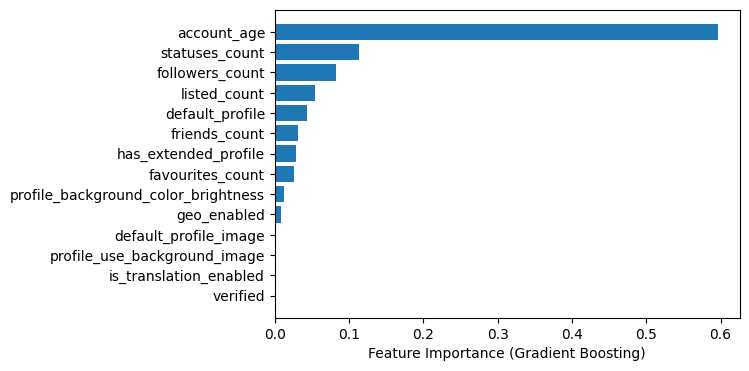

In [ ]:
# Define best hyperparameters
best_params = {
    "n_estimators": 800,
    "learning_rate": 0.01,
    "max_depth": 3,
    "random_state": RANDOM_SEED  # Ensuring reproducibility
}

# Train Gradient Boosting model
gb_model = GradientBoostingClassifier(**best_params)
gb_model.fit(X_train, y_train)

# Extract feature importance
importances = gb_model.feature_importances_
feature_names = X_train.columns

# Sort features by importance
sorted_idx = np.argsort(importances)

# Plot
plt.figure(figsize=(6, 4))
plt.barh(range(len(sorted_idx)), importances[sorted_idx], align="center")
plt.yticks(range(len(sorted_idx)), feature_names[sorted_idx])
plt.xlabel("Feature Importance (Gradient Boosting)")
plt.show()

 99%|===================| 9289/9393 [01:49<00:01]       

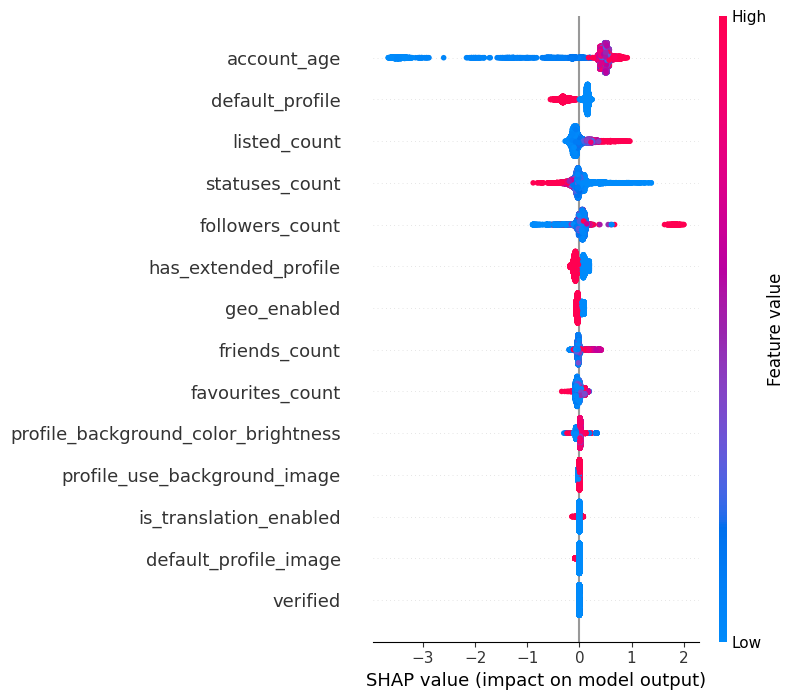

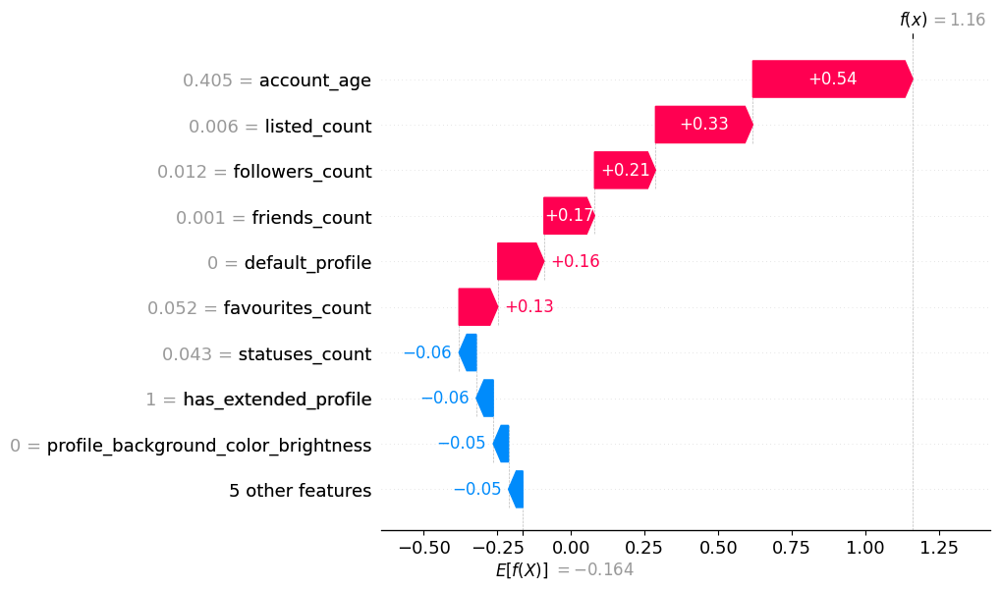

In [ ]:
import shap

# SHAP Explainer
explainer = shap.Explainer(gb_model, X_train)
shap_values = explainer(X_train)

# Summary plot (Global Importance)
shap.summary_plot(shap_values, X_train)

# Waterfall plot (Local Importance for one sample)
shap.waterfall_plot(shap_values[0])

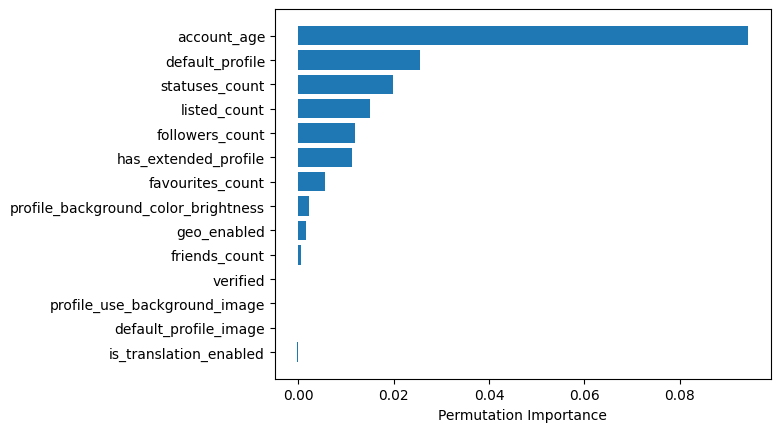

In [ ]:
from sklearn.inspection import permutation_importance

# Compute permutation importance
result = permutation_importance(gb_model, X_test, y_test, n_repeats=10, random_state=42)

# Sort and visualize
sorted_idx = result.importances_mean.argsort()
plt.barh(range(len(sorted_idx)), result.importances_mean[sorted_idx])
plt.yticks(range(len(sorted_idx)), X_train.columns[sorted_idx])
plt.xlabel("Permutation Importance")
plt.show()

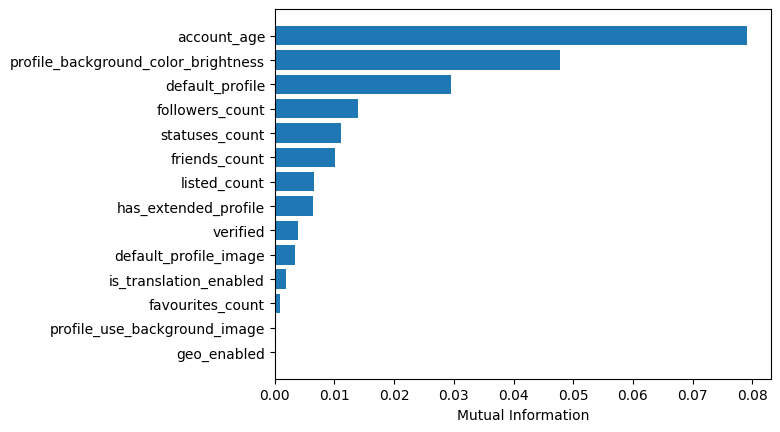

In [ ]:
from sklearn.feature_selection import mutual_info_classif

# Compute mutual information
mi = mutual_info_classif(X_train, y_train)

# Plot
plt.barh(range(len(mi)), np.sort(mi))
plt.yticks(range(len(mi)), X_train.columns[np.argsort(mi)])
plt.xlabel("Mutual Information")
plt.show()

#### Plots

In [ ]:
def plot_confusion_matrix(cm, labels, model_name, ax):
    # Create an image of the confusion matrix
    im = ax.imshow(cm, interpolation='nearest')

    # Add a colorbar to the plot
    ax.figure.colorbar(im, ax=ax)

    # Set axis labels and title
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=labels, yticklabels=labels,
           title=f'Confusion Matrix for {model_name}',
           ylabel='True label',
           xlabel='Predicted label')

    # Add text annotations for each cell in the matrix
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center", color="w")

In [ ]:
def plot_confusion_matrices(cm_data, columns, rows):
    # Determine the number of models and create subplots accordingly
    num_models = len(cm_data)
    fig, axes = plt.subplots(rows, columns, figsize=(15, 10))

    # Iterate through the confusion matrix data for each model
    for i, entry in enumerate(cm_data):
        model_name = entry['Model']
        cm = entry['Matrix']
        class_labels = ['Class 0', 'Class 1']  # Replace with your actual class labels
        row = i // columns
        col = i % columns
        ax = axes[row, col]
        plot_confusion_matrix(cm, class_labels, model_name, ax)

    # Turn off empty subplots
    for i in range(len(cm_data), columns * rows):
        row = i // columns
        col = i % columns
        axes[row, col].axis('off')

    # Adjust the layout and display the subplots
    plt.tight_layout()
    plt.show()

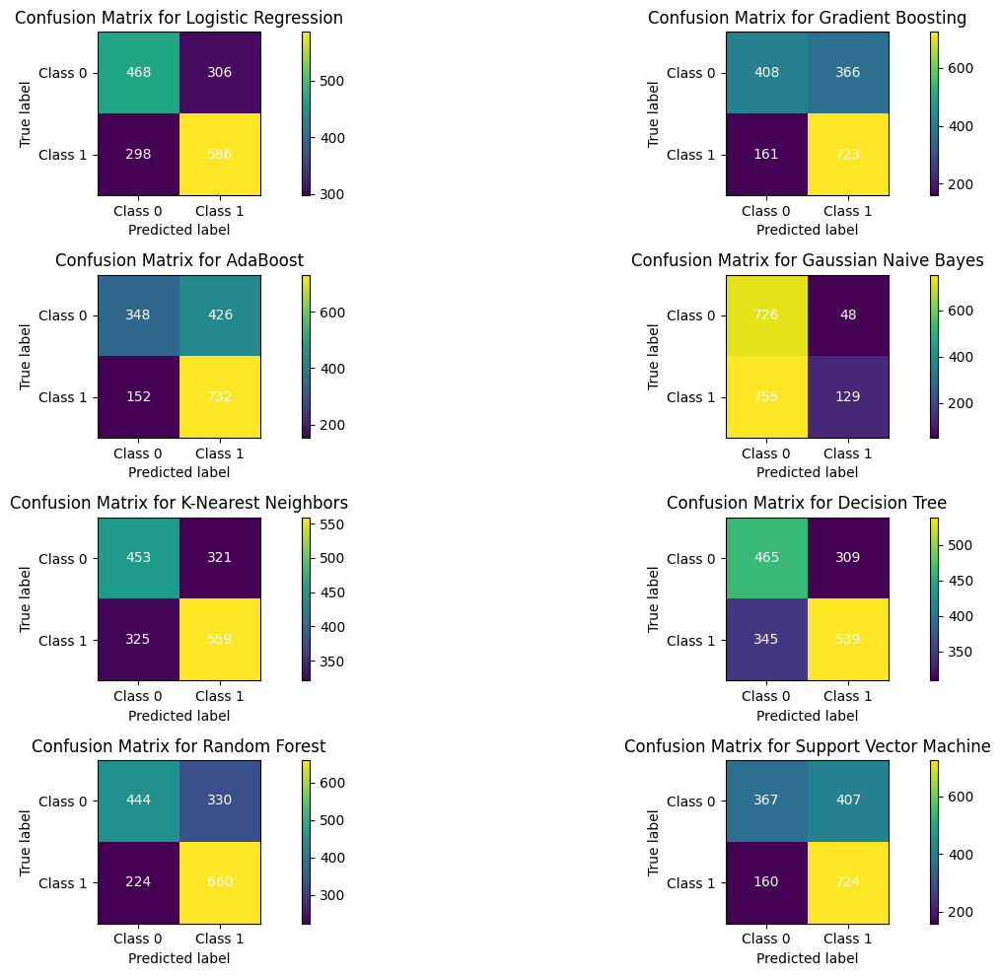

In [ ]:
plot_confusion_matrices(cm_data, columns=2, rows=4)

In [ ]:
def plot_roc_curve(roc_data):
    plt.figure(figsize=(8, 6))
    plt.title('Receiver Operating Characteristic (ROC) Curve')

    for model_data in roc_data:
        model_name = model_data['Model']
        fpr = model_data['FPR']
        tpr = model_data['TPR']
        auc = model_data['AUC']

        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guess')  # Removed color='gray'
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

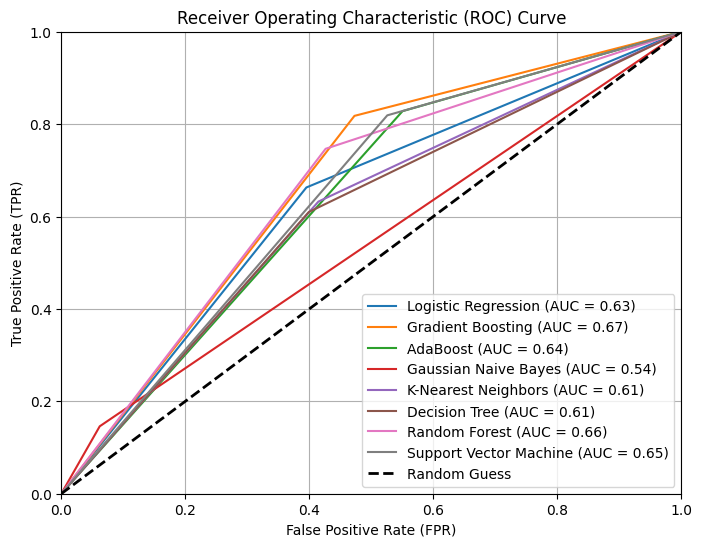

In [ ]:
plot_roc_curve(roc_data)

### Refining features choice
<h3> Best Accuracy achieved: 0.6834 </h3>
(Features Selection from insights extracted in previous runs + parameters optimization using Optuna with TPE)

In [ ]:
users = users[['id', 'followers_count', 'listed_count', 'favourites_count', 'statuses_count', 'has_extended_profile', 'default_profile', 'profile_background_color_brightness', 'account_age', 'depression']]

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.8/231.8 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 5.9 MB/s eta 0:00:00


In [ ]:
import optuna

# Fixing the random seed for reproducibility
RANDOM_SEED = 42

# Separate features (X) and target (y)
def prepare_data(data):
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]
    return train_test_split(X, y, stratify=y, test_size=0.15, random_state=RANDOM_SEED)

# Define the objective function for Optuna
def objective(trial, model_name, X_train, y_train, X_test, y_test):
    if model_name == "GradientBoosting":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3, log=True),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = GradientBoostingClassifier(**params)

    elif model_name == "RandomForest":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "max_depth": trial.suggest_categorical("max_depth", [10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = RandomForestClassifier(**params)

    elif model_name == "AdaBoost":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 500, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 1.0, log=True),
            "random_state": RANDOM_SEED
        }
        model = AdaBoostClassifier(**params)

    elif model_name == "DecisionTree":
        params = {
            "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
            "max_depth": trial.suggest_categorical("max_depth", [5, 10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = DecisionTreeClassifier(**params)

    elif model_name == "SVM":
        params = {
            "C": trial.suggest_loguniform("C", 0.01, 1000),
            "kernel": trial.suggest_categorical("kernel", ["linear", "rbf"]),
            "gamma": trial.suggest_categorical("gamma", ["scale", "auto", 0.001, 0.01, 0.1, 1]),
            "random_state": RANDOM_SEED
        }
        model = SVC(**params, probability=True)

    # Train the model
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    # Compute accuracy as objective metric
    return accuracy_score(y_test, predictions)

# Run Bayesian Optimization for each model
def optimize_models(data, n_trials=30):
    X_train, X_test, y_train, y_test = prepare_data(data)

    models = ["GradientBoosting", "RandomForest", "AdaBoost", "DecisionTree", "SVM"]
    best_results = []

    for model_name in tqdm(models):
        print(f"\nOptimizing {model_name}...")

        study = optuna.create_study(direction="maximize")
        study.optimize(lambda trial: objective(trial, model_name, X_train, y_train, X_test, y_test), n_trials=n_trials)

        print(f"Best Params for {model_name}: {study.best_params}\nBest Accuracy: {study.best_value:.4f}")

        best_results.append({
            "Model": model_name,
            "Best Params": study.best_params,
            "Best Accuracy": study.best_value
        })

    return pd.DataFrame(best_results)

In [ ]:
# Separate features (X) and target (y)
def prepare_data(data):
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]
    return train_test_split(X, y, stratify=y, test_size=0.15, random_state=RANDOM_SEED)

# Run the optimization
optimized_results = optimize_models(users, n_trials=70)

  0%|          | 0/5 [00:00<?, ?it/s][I 2025-03-12 12:18:25,491] A new study created in memory with name: no-name-73613d74-e9ad-4ed8-80b8-12af1584923c



Optimizing GradientBoosting...


[I 2025-03-12 12:18:29,772] Trial 0 finished with value: 0.6525934861278649 and parameters: {'n_estimators': 100, 'learning_rate': 0.003660243754314708, 'max_depth': 5, 'subsample': 0.6686832650806444, 'min_samples_split': 9, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.6525934861278649.
[I 2025-03-12 12:19:42,897] Trial 1 finished with value: 0.6682750301568154 and parameters: {'n_estimators': 800, 'learning_rate': 0.014361787897555786, 'max_depth': 7, 'subsample': 0.8963639180626116, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.6682750301568154.
[I 2025-03-12 12:20:04,981] Trial 2 finished with value: 0.6646562123039808 and parameters: {'n_estimators': 800, 'learning_rate': 0.05779103308500945, 'max_depth': 4, 'subsample': 0.932359554377971, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 1 with value: 0.6682750301568154.
[I 2025-03-12 12:20:34,241] Trial 3 finished with value: 0.6718938480096501 and parameters: {'n_estimators'

Best Params for GradientBoosting: {'n_estimators': 200, 'learning_rate': 0.04292328360731279, 'max_depth': 3, 'subsample': 0.8559460764227613, 'min_samples_split': 6, 'min_samples_leaf': 1}
Best Accuracy: 0.6834

Optimizing RandomForest...


[I 2025-03-12 12:31:51,339] Trial 0 finished with value: 0.6670687575392038 and parameters: {'n_estimators': 400, 'max_depth': 30, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.6670687575392038.
[I 2025-03-12 12:32:01,918] Trial 1 finished with value: 0.6767189384800965 and parameters: {'n_estimators': 700, 'max_depth': 10, 'min_samples_split': 7, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.6767189384800965.
[I 2025-03-12 12:32:07,256] Trial 2 finished with value: 0.6749095295536791 and parameters: {'n_estimators': 400, 'max_depth': 10, 'min_samples_split': 3, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.6767189384800965.
[I 2025-03-12 12:32:29,587] Trial 3 finished with value: 0.669481302774427 and parameters: {'n_estimators': 1000, 'max_depth': 20, 'min_samples_split': 9, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.6767189384800965.
[I 2025-03-12 12:32:37,694] Trial 4 finished with value: 0.6634499396863691 and parameters: 

Best Params for RandomForest: {'n_estimators': 500, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1}
Best Accuracy: 0.6815

Optimizing AdaBoost...


[I 2025-03-12 12:42:35,102] Trial 0 finished with value: 0.6592279855247286 and parameters: {'n_estimators': 500, 'learning_rate': 0.6521797315727202}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:41,370] Trial 1 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 500, 'learning_rate': 0.04038052406658868}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:43,714] Trial 2 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 200, 'learning_rate': 0.03938362248782386}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:47,945] Trial 3 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 400, 'learning_rate': 0.01265750696046762}. Best is trial 0 with value: 0.6592279855247286.
[I 2025-03-12 12:42:49,007] Trial 4 finished with value: 0.6369119420989143 and parameters: {'n_estimators': 100, 'learning_rate': 0.07202886392954426}. Best is trial 0 with value: 0.65922798552472

Best Params for AdaBoost: {'n_estimators': 500, 'learning_rate': 0.996822176901094}
Best Accuracy: 0.6785

Optimizing DecisionTree...


[I 2025-03-12 12:48:08,342] Trial 1 finished with value: 0.5892641737032569 and parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.5910735826296744.
[I 2025-03-12 12:48:08,442] Trial 2 finished with value: 0.6073582629674307 and parameters: {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 2 with value: 0.6073582629674307.
[I 2025-03-12 12:48:08,562] Trial 3 finished with value: 0.5910735826296744 and parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_split': 10, 'min_samples_leaf': 5}. Best is trial 2 with value: 0.6073582629674307.
[I 2025-03-12 12:48:08,673] Trial 4 finished with value: 0.6079613992762364 and parameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 6, 'min_samples_leaf': 4}. Best is trial 4 with value: 0.6079613992762364.
[I 2025-03-12 12:48:08,793] Trial 5 finished with value: 0.594692400482509 and 

Best Params for DecisionTree: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 3}
Best Accuracy: 0.6544

Optimizing SVM...


[I 2025-03-12 12:48:42,023] Trial 0 finished with value: 0.6145958986731002 and parameters: {'C': 0.02579099724939115, 'kernel': 'rbf', 'gamma': 'scale'}. Best is trial 0 with value: 0.6145958986731002.
<ipython-input-51-cf019209181b>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-03-12 12:49:10,497] Trial 1 finished with value: 0.6652593486127865 and parameters: {'C': 1.1087608088290748, 'kernel': 'rbf', 'gamma': 1}. Best is trial 1 with value: 0.6652593486127865.
<ipython-input-51-cf019209181b>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-03-12 12:49:44,428] Trial 2 finished with value: 0.6109770808202654 and parameters: {'C': 227.5567105156162

In [ ]:
"""
GradientBoosting: {'n_estimators': 200, 'learning_rate': 0.04292328360731279, 'max_depth': 3, 'subsample': 0.8559460764227613, 'min_samples_split': 6, 'min_samples_leaf': 1}
RandomForest: {'n_estimators': 500, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_leaf': 1}
AdaBoost: {'n_estimators': 500, 'learning_rate': 0.996822176901094}
DecisionTree: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 3}
SVM: {'C': 10.030070750656739, 'kernel': 'rbf', 'gamma': 'auto'}
"""

### Ensemble Learning for performance boosting
<h3> Best Accuracy achieved: 0.6899879 </h3>

In [ ]:
# Split the dataset into training and testing sets
X = users.drop(["id", "depression"], axis=1)
y = users["depression"]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.15, random_state=42)

In [ ]:
# Define models with optimal hyperparameters
gb_model = GradientBoostingClassifier(n_estimators=800, learning_rate=0.01, max_depth=3, random_state=42)
rf_model = RandomForestClassifier(n_estimators=300, max_depth=30, min_samples_leaf= 1, min_samples_split=10, random_state=42)
adab_model = AdaBoostClassifier(learning_rate=1.0, n_estimators=500, random_state=42)

logreg_model = LogisticRegression(C=0.1, penalty='l1', solver='liblinear', random_state=42)

In [ ]:
# Voting Classifier (Ensemble)
voting_clf = VotingClassifier(estimators=[
    ('gb', gb_model),
    ('rf', rf_model),
    ('adab', adab_model)
], voting='soft')  # 'soft' averages probabilities; 'hard' takes majority vote

# Fit and evaluate
voting_clf.fit(X_train, y_train)
voting_preds = voting_clf.predict(X_test)

In [ ]:
# Stacking Classifier
stacking_clf = StackingClassifier(estimators=[
    ('gb', gb_model),
    ('rf', rf_model),
    ('adab', adab_model)
], final_estimator=logreg_model, passthrough=True)  # passthrough=True allows raw features + meta-model

# Fit and evaluate
stacking_clf.fit(X_train, y_train)
stacking_preds = stacking_clf.predict(X_test)

In [ ]:
print("Voting Classifier Accuracy:", accuracy_score(y_test, voting_preds))
print("Stacking Classifier Accuracy:", accuracy_score(y_test, stacking_preds))

Voting Classifier Accuracy: 0.6815440289505428
Stacking Classifier Accuracy: 0.6899879372738239


## Using features extracted from 2 datasets: Users and Users’ Tweet Timelines. Best_Accuracy=0.9518

*   Users:
    *   Profile Metadata
*   Users’ Tweet Timelines:
    *   Engagement Patterns
    *   Interaction Patterns
    *   Posting Behaviors



In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 18.4 MB/s eta 0:00:00


In [ ]:
import optuna

# Fixing the random seed for reproducibility
RANDOM_SEED = 42

# Separate features (X) and target (y)
def prepare_data(data, test_size=0.15):
    X = data.drop(["id", "depression"], axis=1)
    y = data["depression"]
    return train_test_split(X, y, stratify=y, test_size=test_size, random_state=RANDOM_SEED)

# Define the objective function for Optuna
def objective(trial, model_name, X_train, y_train, X_test, y_test):
    if model_name == "GradientBoosting":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3, log=True),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = GradientBoostingClassifier(**params)

    elif model_name == "RandomForest":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 1000, step=100),
            "max_depth": trial.suggest_categorical("max_depth", [10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = RandomForestClassifier(**params)

    elif model_name == "AdaBoost":
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 500, step=100),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 1.0, log=True),
            "random_state": RANDOM_SEED
        }
        model = AdaBoostClassifier(**params)

    elif model_name == "DecisionTree":
        params = {
            "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
            "max_depth": trial.suggest_categorical("max_depth", [5, 10, 20, 30, None]),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
            "random_state": RANDOM_SEED
        }
        model = DecisionTreeClassifier(**params)

    elif model_name == "SVM":
        params = {
            "C": trial.suggest_loguniform("C", 0.01, 1000),
            "kernel": trial.suggest_categorical("kernel", ["linear", "rbf"]),
            "gamma": trial.suggest_categorical("gamma", ["scale", "auto", 0.001, 0.01, 0.1, 1]),
            "random_state": RANDOM_SEED
        }
        model = SVC(**params)

    # Train the model
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    # Compute accuracy as objective metric
    return accuracy_score(y_test, predictions)

# Run Bayesian Optimization for each model
def optimize_models(data, n_trials=30):
    X_train, X_test, y_train, y_test = prepare_data(data)

    models = ["SVM", "GradientBoosting", "RandomForest", "AdaBoost", "DecisionTree"]
    best_results = []

    for model_name in tqdm(models):
        print(f"\nOptimizing {model_name}...")

        study = optuna.create_study(direction="maximize")
        study.optimize(lambda trial: objective(trial, model_name, X_train, y_train, X_test, y_test), n_trials=n_trials)

        print(f"Best Params for {model_name}: {study.best_params}\nBest Accuracy: {study.best_value:.4f}")

        best_results.append({
            "Model": model_name,
            "Best Params": study.best_params,
            "Best Accuracy": study.best_value
        })

    return pd.DataFrame(best_results)

In [ ]:
# Run the optimization
optimized_results = optimize_models(merged_df, n_trials=70)

  0%|          | 0/5 [00:00<?, ?it/s][I 2025-04-02 14:36:12,767] A new study created in memory with name: no-name-f66ce3fa-22e2-4349-bf97-b72502186bb8
<ipython-input-45-74cc093d7e2c>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.




Optimizing SVM...


[I 2025-04-02 14:36:14,811] Trial 0 finished with value: 0.6816192560175055 and parameters: {'C': 0.780169100233999, 'kernel': 'linear', 'gamma': 0.001}. Best is trial 0 with value: 0.6816192560175055.
<ipython-input-45-74cc093d7e2c>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-04-02 14:36:17,226] Trial 1 finished with value: 0.8238512035010941 and parameters: {'C': 485.795768328385, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 1 with value: 0.8238512035010941.
<ipython-input-45-74cc093d7e2c>:56: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

[I 2025-04-02 14:36:18,537] Trial 2 finished with value: 0.7691466083150985 and parameters: {'C': 590.1658485

Best Params for SVM: {'C': 991.8577626252073, 'kernel': 'rbf', 'gamma': 1}
Best Accuracy: 0.8490

Optimizing GradientBoosting...


[I 2025-04-02 14:40:34,302] Trial 0 finished with value: 0.937636761487965 and parameters: {'n_estimators': 800, 'learning_rate': 0.03997703436633295, 'max_depth': 10, 'subsample': 0.8972547834705875, 'min_samples_split': 3, 'min_samples_leaf': 4}. Best is trial 0 with value: 0.937636761487965.
[I 2025-04-02 14:40:42,079] Trial 1 finished with value: 0.9234135667396062 and parameters: {'n_estimators': 100, 'learning_rate': 0.004648196905680108, 'max_depth': 10, 'subsample': 0.9295825019698996, 'min_samples_split': 8, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.937636761487965.
[I 2025-04-02 14:40:55,477] Trial 2 finished with value: 0.9332603938730853 and parameters: {'n_estimators': 300, 'learning_rate': 0.007546455795492525, 'max_depth': 7, 'subsample': 0.5629760027073899, 'min_samples_split': 4, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.937636761487965.
[I 2025-04-02 14:41:27,388] Trial 3 finished with value: 0.9442013129102844 and parameters: {'n_estimators': 

Best Params for GradientBoosting: {'n_estimators': 1000, 'learning_rate': 0.22132944375008318, 'max_depth': 5, 'subsample': 0.7098092451187741, 'min_samples_split': 3, 'min_samples_leaf': 4}
Best Accuracy: 0.9519

Optimizing RandomForest...


[I 2025-04-02 15:14:29,422] Trial 0 finished with value: 0.9387308533916849 and parameters: {'n_estimators': 400, 'max_depth': 30, 'min_samples_split': 10, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.9387308533916849.
[I 2025-04-02 15:14:31,979] Trial 1 finished with value: 0.9409190371991247 and parameters: {'n_estimators': 200, 'max_depth': None, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.9409190371991247.
[I 2025-04-02 15:14:35,087] Trial 2 finished with value: 0.937636761487965 and parameters: {'n_estimators': 200, 'max_depth': 30, 'min_samples_split': 6, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.9409190371991247.
[I 2025-04-02 15:14:37,870] Trial 3 finished with value: 0.9420131291028446 and parameters: {'n_estimators': 200, 'max_depth': 10, 'min_samples_split': 8, 'min_samples_leaf': 4}. Best is trial 3 with value: 0.9420131291028446.
[I 2025-04-02 15:14:51,278] Trial 4 finished with value: 0.9398249452954048 and parameters

Best Params for RandomForest: {'n_estimators': 400, 'max_depth': None, 'min_samples_split': 3, 'min_samples_leaf': 1}
Best Accuracy: 0.9442

Optimizing AdaBoost...


[I 2025-04-02 15:21:34,618] Trial 0 finished with value: 0.8676148796498906 and parameters: {'n_estimators': 400, 'learning_rate': 0.014063957669367985}. Best is trial 0 with value: 0.8676148796498906.
[I 2025-04-02 15:21:40,530] Trial 1 finished with value: 0.9179431072210066 and parameters: {'n_estimators': 500, 'learning_rate': 0.1331594699074197}. Best is trial 1 with value: 0.9179431072210066.
[I 2025-04-02 15:21:43,915] Trial 2 finished with value: 0.9266958424507659 and parameters: {'n_estimators': 300, 'learning_rate': 0.2868848193357565}. Best is trial 2 with value: 0.9266958424507659.
[I 2025-04-02 15:21:45,047] Trial 3 finished with value: 0.899343544857768 and parameters: {'n_estimators': 100, 'learning_rate': 0.3739337366835951}. Best is trial 2 with value: 0.9266958424507659.
[I 2025-04-02 15:21:50,597] Trial 4 finished with value: 0.9321663019693655 and parameters: {'n_estimators': 400, 'learning_rate': 0.5302277904018472}. Best is trial 4 with value: 0.9321663019693655.

Best Params for AdaBoost: {'n_estimators': 200, 'learning_rate': 0.8344986857815359}
Best Accuracy: 0.9420

Optimizing DecisionTree...


[I 2025-04-02 15:24:53,267] Trial 2 finished with value: 0.9179431072210066 and parameters: {'criterion': 'gini', 'max_depth': 30, 'min_samples_split': 7, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.9234135667396062.
[I 2025-04-02 15:24:53,330] Trial 3 finished with value: 0.9168490153172867 and parameters: {'criterion': 'gini', 'max_depth': 20, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.9234135667396062.
[I 2025-04-02 15:24:53,375] Trial 4 finished with value: 0.9080962800875274 and parameters: {'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 10, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.9234135667396062.
[I 2025-04-02 15:24:53,441] Trial 5 finished with value: 0.9223194748358862 and parameters: {'criterion': 'entropy', 'max_depth': 30, 'min_samples_split': 2, 'min_samples_leaf': 4}. Best is trial 0 with value: 0.9234135667396062.
[I 2025-04-02 15:24:53,507] Trial 6 finished with value: 0.9179431072210066 and parameter

Best Params for DecisionTree: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_split': 8, 'min_samples_leaf': 4}
Best Accuracy: 0.9278


In [ ]:
optimized_results.sort_values('Best Accuracy', ascending=False)

,Model,Best Params,Best Accuracy
1,GradientBoosting,"{'n_estimators': 1000, 'learning_rate': 0.2213...",0.951860
2,RandomForest,"{'n_estimators': 400, 'max_depth': None, 'min_...",0.944201
3,AdaBoost,"{'n_estimators': 200, 'learning_rate': 0.83449...",0.942013
4,DecisionTree,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.927790
0,SVM,"{'C': 991.8577626252073, 'kernel': 'rbf', 'gam...",0.849015


In [ ]:
merged_df.columns

Index(['id', 'avg_retweets', 'avg_favorites', 'tweet_count', 'mean_time_gap',
       'tweet_rate', 'unique_interactions', 'interactions_with_depressed',
       'total_interactions', 'unique_sources', 'quote_ratio',
       'followers_count', 'favourites_count', 'statuses_count',
       'has_extended_profile', 'profile_background_color_brightness',
       'account_age', 'depression'],
      dtype='object')

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6093 entries, 0 to 6092
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   6093 non-null   int64  
 1   avg_retweets                         6093 non-null   float64
 2   avg_favorites                        6093 non-null   float64
 3   tweet_count                          6093 non-null   float64
 4   mean_time_gap                        6093 non-null   float64
 5   tweet_rate                           6093 non-null   float64
 6   unique_interactions                  6093 non-null   float64
 7   interactions_with_depressed          6093 non-null   float64
 8   total_interactions                   6093 non-null   float64
 9   unique_sources                       6093 non-null   float64
 10  quote_ratio                          6093 non-null   float64
 11  followers_count               

In [ ]:
X = merged_df.drop(["id", "depression"], axis=1)
y = merged_df["depression"]

# Define your best model with the optimal parameters
best_model = GradientBoostingClassifier(
    n_estimators=1000,
    learning_rate=0.22132944375008318,
    max_depth=5,
    subsample=0.7098092451187741,
    min_samples_split=3,
    min_samples_leaf=4,
    random_state=42
)

# Fit the model on the data
best_model.fit(X, y)

# Extract leaf indices for all data samples
leaf_indices = best_model.apply(X)  # Shape: (num_samples, num_trees)

# Reshape the embeddings into a usable form
metadata_embeddings = pd.DataFrame(leaf_indices.reshape(X.shape[0], -1))

# Add the 'id' column from merged_df
metadata_embeddings.insert(0, "id", merged_df["id"].values)

print(f"Metadata Embeddings Shape: {metadata_embeddings.shape}")

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names



Metadata Embeddings Shape: (6093, 1001)


In [ ]:
metadata_embeddings

,id,0,1,2,3,4,5,6,7,8,...,992,993,994,995,996,997,998,999,prob_class_0,prob_class_1
0,11913,36.0,33.0,33.0,34.0,37.0,36.0,38.0,36.0,37.0,...,25.0,16.0,46.0,56.0,32.0,25.0,34.0,23.0,4.042708e-09,1.000000e+00
1,12719,22.0,21.0,15.0,22.0,20.0,19.0,24.0,19.0,24.0,...,5.0,39.0,46.0,16.0,5.0,42.0,16.0,5.0,1.000000e+00,1.907493e-08
2,823654,36.0,33.0,33.0,34.0,37.0,36.0,38.0,36.0,37.0,...,25.0,42.0,46.0,55.0,5.0,42.0,34.0,23.0,7.128564e-10,1.000000e+00
3,1865661,22.0,21.0,15.0,22.0,23.0,19.0,24.0,19.0,24.0,...,5.0,42.0,46.0,55.0,5.0,42.0,16.0,29.0,1.000000e+00,2.169960e-10
4,4856011,21.0,18.0,12.0,19.0,20.0,18.0,24.0,26.0,21.0,...,5.0,32.0,46.0,16.0,51.0,42.0,9.0,5.0,9.999995e-01,5.293481e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6088,819443795443982338,5.0,6.0,8.0,6.0,5.0,5.0,6.0,5.0,5.0,...,17.0,15.0,5.0,52.0,5.0,5.0,5.0,23.0,9.999997e-01,3.498438e-07
6089,819445547748601858,5.0,5.0,5.0,5.0,5.0,5.0,6.0,5.0,8.0,...,6.0,5.0,5.0,52.0,5.0,5.0,39.0,23.0,1.000000e+00,2.147210e-08
6090,819452923071565824,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,8.0,...,5.0,5.0,5.0,9.0,28.0,8.0,30.0,13.0,1.000000e+00,1.436310e-08
6091,819453310503714816,5.0,5.0,5.0,7.0,5.0,5.0,5.0,5.0,5.0,...,5.0,5.0,5.0,9.0,28.0,8.0,5.0,13.0,9.999998e-01,1.667532e-07


In [ ]:
# Extract probability distributions
proba_embeddings = best_model.predict_proba(X)

# Convert to DataFrame
proba_embeddings_df = pd.DataFrame(proba_embeddings, columns=["prob_class_0", "prob_class_1"])

# Add probabilities to the structured embeddings dataframe
metadata_embeddings["prob_class_0"] = proba_embeddings[:, 0]
metadata_embeddings["prob_class_1"] = proba_embeddings[:, 1]

In [ ]:
# Extract feature importances
feature_importance_values = best_model.feature_importances_

# Get feature names (excluding 'id' and 'depression')
feature_names = merged_df.drop(columns=["id", "depression"]).columns

# Create a DataFrame
feature_importance = pd.DataFrame({
    "Feature": feature_names,
    "Importance": feature_importance_values
})

# Sort by importance (descending)
feature_importance = feature_importance.sort_values(by="Importance", ascending=False)

feature_importance

,Feature,Importance
0,avg_retweets,0.552017
11,favourites_count,0.090813
12,statuses_count,0.071245
15,account_age,0.070559
6,interactions_with_depressed,0.048782
1,avg_favorites,0.042404
10,followers_count,0.023257
3,mean_time_gap,0.022663
5,unique_interactions,0.016276
4,tweet_rate,0.015547


In [ ]:
!pip install eli5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.4/106.4 kB 3.4 MB/s eta 0:00:00


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

X_train, X_test, y_train, y_test = prepare_data(merged_df)
# Compute Permutation Importance
perm = PermutationImportance(best_model, scoring="accuracy", random_state=42).fit(X_test, y_test)

# Display importance
eli5.show_weights(perm, feature_names=X_test.columns.tolist())

Weight,Feature
0.2131 ± 0.0160,avg_retweets
0.0667 ± 0.0072,interactions_with_depressed
0.0481 ± 0.0085,statuses_count
0.0260 ± 0.0032,account_age
0.0184 ± 0.0089,avg_favorites
0.0118 ± 0.0016,tweet_count
0.0098 ± 0.0024,mean_time_gap
0.0081 ± 0.0045,favourites_count
0.0044 ± 0.0042,followers_count
0.0011 ± 0.0000,unique_interactions


In [ ]:
metadata_embeddings

,id,0,1,2,3,4,5,6,7,8,...,992,993,994,995,996,997,998,999,prob_class_0,prob_class_1
0,11913,36.0,33.0,33.0,34.0,37.0,36.0,38.0,36.0,37.0,...,25.0,16.0,46.0,56.0,32.0,25.0,34.0,23.0,4.042708e-09,1.000000e+00
1,12719,22.0,21.0,15.0,22.0,20.0,19.0,24.0,19.0,24.0,...,5.0,39.0,46.0,16.0,5.0,42.0,16.0,5.0,1.000000e+00,1.907493e-08
2,823654,36.0,33.0,33.0,34.0,37.0,36.0,38.0,36.0,37.0,...,25.0,42.0,46.0,55.0,5.0,42.0,34.0,23.0,7.128564e-10,1.000000e+00
3,1865661,22.0,21.0,15.0,22.0,23.0,19.0,24.0,19.0,24.0,...,5.0,42.0,46.0,55.0,5.0,42.0,16.0,29.0,1.000000e+00,2.169960e-10
4,4856011,21.0,18.0,12.0,19.0,20.0,18.0,24.0,26.0,21.0,...,5.0,32.0,46.0,16.0,51.0,42.0,9.0,5.0,9.999995e-01,5.293481e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6088,819443795443982338,5.0,6.0,8.0,6.0,5.0,5.0,6.0,5.0,5.0,...,17.0,15.0,5.0,52.0,5.0,5.0,5.0,23.0,9.999997e-01,3.498438e-07
6089,819445547748601858,5.0,5.0,5.0,5.0,5.0,5.0,6.0,5.0,8.0,...,6.0,5.0,5.0,52.0,5.0,5.0,39.0,23.0,1.000000e+00,2.147210e-08
6090,819452923071565824,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,8.0,...,5.0,5.0,5.0,9.0,28.0,8.0,30.0,13.0,1.000000e+00,1.436310e-08
6091,819453310503714816,5.0,5.0,5.0,7.0,5.0,5.0,5.0,5.0,5.0,...,5.0,5.0,5.0,9.0,28.0,8.0,5.0,13.0,9.999998e-01,1.667532e-07


100%|===================| 911/914 [00:38<00:00]       

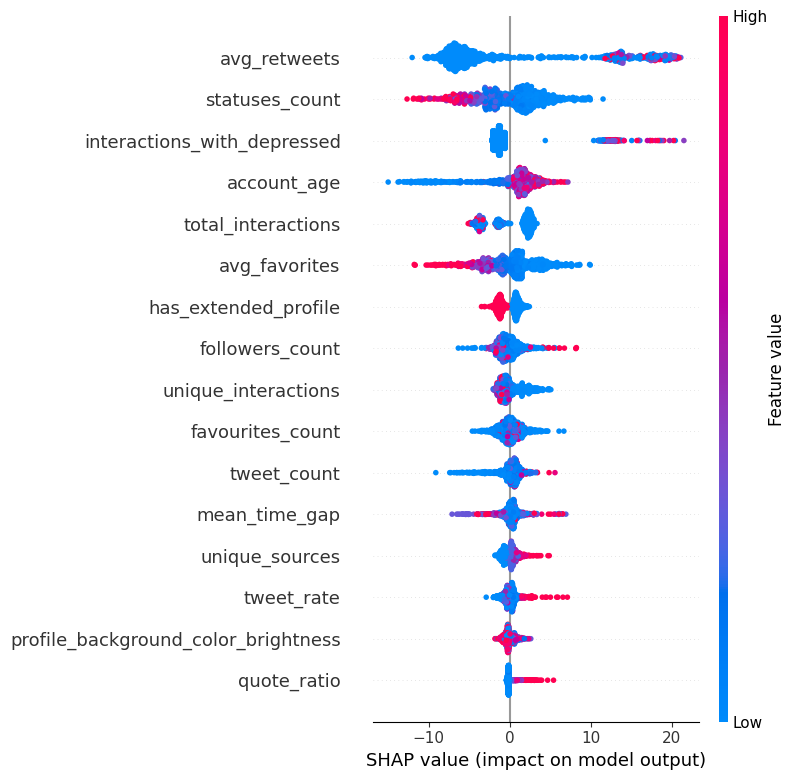

ValueError: visualize() can only display Explanation objects (or arrays of them)!

In [ ]:
import shap

# Initialize SHAP Explainer
explainer = shap.Explainer(best_model, X_train)

# Compute SHAP values
shap_values = explainer(X_test, check_additivity=False)

# Summary Plot (Global Feature Importance)
shap.summary_plot(shap_values, X_test)

# Force Plot (Local Explanation for One Instance)
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])

In [ ]:
!pip install lime
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values, feature_names=X_train.columns.tolist(), class_names=["No Depression", "Depression"], mode="classification"
)

# Explain a single prediction
exp = explainer.explain_instance(X_test.iloc[0].values, best_model.predict_proba)
exp.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



In [ ]:
# Explain a single prediction
exp = explainer.explain_instance(X_test.iloc[-1].values, best_model.predict_proba)
exp.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names



# NLP Analysis: Extracting meaningful patterns which will potentially boost accuracy when combined with existing numerical features (Profiles' Descriptions)

Objective: Instead of relying only on numerical user metadata, we introduce textual indicators that may strongly correlate with depression (e.g., words indicating isolation, hopelessness, or exhaustion). <br>

How It Helps:
*   Helps explain why some users are classified as depressed.
*   Reduces noise in classification models by adding interpretable signals.
*   Potentially boosts accuracy when combined with existing numerical features.

<h4>Topic Modeling & Semantic Understanding </h4>
Goal: Extract underlying themes from profile descriptions to identify depressive tendencies. </br>

<h4>TF-IDF: Term Frequency-Inverse Document Frequency </h4>
(Weighs words based on their importance in a document relative to their frequency across the entire dataset: Helps focus on depression-indicating terms while reducing the impact of frequent but irrelevant words.)

### Data Cleaning

In [ ]:
df_final

,user_id,total_retweets,total_favorites,avg_retweets,avg_favorites,tweet_count,mean_time_gap,median_time_gap,std_time_gap,tweet_rate,text,unique_interactions,interactions_with_depressed,total_interactions,interactions_with_non_depressed,unique_sources,total_quotes_x,quote_ratio,total_quotes_y,depression
0,11913,2.307891e-03,0.000454,5.548583e-04,0.000224,0.098698,0.000730,0.000037,0.001851,0.003418,"I know, my heart is aching for her.... https:/...",0.024516,1254,0.000514,0,0.142857,0.849372,0.916461,0.0,1
1,823654,2.766335e-03,0.000079,5.673509e-03,0.000332,0.011361,0.010070,0.000508,0.008331,0.000252,RT @_Snape_: I prefer the Quidditch World Cup ...,0.010323,0,0.000000,0,0.285714,0.000000,0.000000,NaN,1
2,5047181,1.873109e-03,0.000109,1.493949e-03,0.000178,0.029586,0.003802,0.000070,0.003030,0.000660,"But anyway, that dress, man, wtf. it's a free ...",0.003871,0,0.000000,0,0.285714,0.004184,0.014977,0.0,1
3,5330682,2.272240e-06,0.000007,1.619490e-06,0.000010,0.033136,0.003452,0.000252,0.002044,0.000726,@rogie Lack of anything smart to respond with....,0.021935,0,0.000000,0,0.785714,0.000000,0.000000,NaN,1
4,5498352,7.835311e-08,0.000000,6.056977e-07,0.000000,0.002840,0.032985,0.001127,0.028370,0.000082,Rakitic hace mes y medio que se cansó de corre...,0.003871,0,0.000000,0,0.142857,0.000000,0.000000,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3496,819081397772107776,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000710,0.005373,0.000989,0.002557,0.000618,smol nozomi goes at didney worl Next video inc...,0.000000,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0
3497,819089684626182144,0.000000e+00,0.000020,0.000000e+00,0.000075,0.012544,0.000276,0.000061,0.000303,0.009202,@JWyellowjasmine \nどんまい(笑)\n\nやっぱりWESTみると\n元気な...,0.028387,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0
3498,819140914685747200,2.115534e-06,0.000135,1.436486e-06,0.000188,0.034793,0.000088,0.000018,0.000118,0.028337,bbs money money money okay this is my real g'n...,0.011613,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0
3499,819430296592519168,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.005928,NaN,NaN,0.000154,hllo friends i am crazy with my friends in...,0.000000,0,0.000000,0,0.071429,0.000000,0.000000,NaN,0


In [ ]:
df_final.columns

Index(['user_id', 'total_retweets', 'total_favorites', 'avg_retweets',
       'avg_favorites', 'tweet_count', 'mean_time_gap', 'median_time_gap',
       'std_time_gap', 'tweet_rate', 'text', 'unique_interactions',
       'interactions_with_depressed', 'total_interactions',
       'interactions_with_non_depressed', 'unique_sources', 'total_quotes_x',
       'quote_ratio', 'total_quotes_y', 'depression'],
      dtype='object')

In [ ]:
! pip install langdetect
! pip install emoji
! pip install transformers
! pip install wordsegment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993223 sha256=e5968d39328e385c3f79d8c3c0d361be2e01a09db5c365588bd720a5f82f3f0b
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 37.2 MB/s eta 0:00:00


In [ ]:
import glob
import json
import seaborn as sns
from langdetect import detect
from langdetect import DetectorFactory

import matplotlib.pyplot as plt
plt.style.use('ggplot')

from pprint import pprint

from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import TweetTokenizer, RegexpTokenizer
import nltk
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
import string
import emoji
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from transformers import AutoTokenizer
from wordsegment import load, segment

In [ ]:
# Handling Multiple Languages
def language_detection (data, column):
    # hold label - language
    languages = []
    unk_lang_text = 0
    # go through each text
    for ii in tqdm(range(0,len(data))):
        # split by space into list, take the first x intex, join with space
        text = data.iloc[ii][column].split(" ")

        lang = "en"
        try:
            if len(text) > 50:
                lang = detect(" ".join(text[:50]))
            elif len(text) > 0:
                lang = detect(" ".join(text[:len(text)]))
        # ught... beginning of the document was not in a good format
        except Exception as e:
            all_words = set(text)
            try:
                lang = detect(" ".join(all_words))
            # what!! :( let's see if we can find any text in abstract...
            except Exception as e:
                lang = "unknown"
                unk_lang_text += 1
                pass

        # get the language
        languages.append(lang)

    return languages, unk_lang_text


# Getting the data for each languages
def language_data (languages):
    languages_dict = {}
    for lang in set(languages):
        languages_dict[lang] = languages.count(lang)
    return languages_dict


def word_count(text):
    return len(str(text).split(' '))

In [ ]:
def WordCount_TargetClass (data, column, target='depression'):
    data['word_count'] = data[column].apply(word_count)
    # Compute the average word count per depression class
    variable_count = data.groupby(target)['word_count'].mean()

    # Create a single bar plot
    fig = go.Figure()
    fig.add_trace(
        go.Bar(
            x=variable_count.index,
            y=variable_count.values,
            marker_color='rgb(156, 39, 176)',
            text=variable_count.round(2),
            textposition='outside',
            width=0.2,
            marker=dict(line=dict(width=1, color='rgba(0,0,0,1)'), opacity=1)
        )
    )

    # Update layout
    fig.update_layout(
        title=f"Avg word_count vs {target}",
        height=400,
        width=400,
        plot_bgcolor='rgba(34, 34, 34, 1)',
        paper_bgcolor='rgba(34, 34, 34, 1)',
        font=dict(color='white'),
        showlegend=False
    )

    fig.show()

In [ ]:
nltk.download('omw-1.4')
nltk.download('wordnet')

lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
def vectorize(text, maxx_features, ngram_from, ngram_to, min_df=0.005, max_df=0.95):

    vectorizer = TfidfVectorizer(max_features=maxx_features, ngram_range=(ngram_from,ngram_to), min_df=min_df, max_df=max_df)
    X = vectorizer.fit_transform(text)

    count_values = X.toarray().sum(axis=0)
    vocab = vectorizer.vocabulary_
    df = pd.DataFrame(sorted([(count_values[i], k) for k, i in vocab.items()], reverse=True)
                         ).rename(columns={0: 'frequency', 1: 'ngrams'})

    return df

In [ ]:
# Contraction map
c_dict = {
    "ain't": "am not", "aren't": "are not", "can't": "cannot", "can't've": "cannot have",
    "'cause": "because", "could've": "could have", "couldn't": "could not", "couldn't've": "could not have",
    "didn't": "did not", "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hadn't've": "had not have",
    "hasn't": "has not", "haven't": "have not", "he'd": "he would", "he'd've": "he would have",
    "he'll": "he will", "he'll've": "he will have", "he's": "he is", "how'd": "how did",
    "how'd'y": "how do you", "how'll": "how will", "how's": "how is", "i'd": "I would",
    "i'd've": "I would have", "i'll": "I will", "i'll've": "I will have", "i'm": "I am",
    "i've": "I have", "isn't": "is not", "it'd": "it had", "it'd've": "it would have",
    "it'll": "it will", "it'll've": "it will have", "it's": "it is", "let's": "let us",
    "ma'am": "madam", "mayn't": "may not", "might've": "might have", "mightn't": "might not",
    "mightn't've": "might not have", "must've": "must have", "mustn't": "must not", "mustn't've": "must not have",
    "needn't": "need not", "needn't've": "need not have", "o'clock": "of the clock", "oughtn't": "ought not",
    "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",
    "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have",
    "she's": "she is", "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have",
    "so've": "so have", "so's": "so is", "that'd": "that would", "that'd've": "that would have",
    "that's": "that is", "there'd": "there had", "there'd've": "there would have", "there's": "there is",
    "they'd": "they would", "they'd've": "they would have", "they'll": "they will", "they'll've": "they will have",
    "they're": "they are", "they've": "they have", "to've": "to have", "wasn't": "was not",
    "we'd": "we had", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have",
    "we're": "we are", "we've": "we have", "weren't": "were not", "what'll": "what will",
    "what'll've": "what will have", "what're": "what are", "what's": "what is", "what've": "what have",
    "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",
    "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is",
    "who've": "who have", "why's": "why is", "why've": "why have", "will've": "will have", "bellletstaik": "bell let's talk",
    "won't": "will not", "won't've": "will not have", "would've": "would have", "wouldn't": "would not",
    "wouldn't've": "would not have", "y'all": "you all", "y'alls": "you alls", "y'all'd": "you all would",
    "y'all'd've": "you all would have", "y'all're": "you all are", "y'all've": "you all have", "you'd": "you had",
    "you'd've": "you would have", "you'll": "you will","you'll've": "you will have", "you're": "you are", "you've": "you have",
    "idk": "i don't know", "imo": "in my opinion", "imho": "in my humble opinion", "lmk": "let me know",
    "brb": "be right back", "gtg": "got to go", "ttyl": "talk to you later", "omg": "oh my God",
    "wtf": "what the fuck", "smh": "shaking my head", "rn": "right now", "yolo": "you only live once",
    "tbh": "to be honest", "hmu": "hit me up", "bff": "best friend forever", "fyi": "for your information",
    "btw": "by the way", "wdym": "what do you mean", "wbu": "what about you", "oop-": "oops", "bellletstalk": "bell let's talk",
    "lol": "laugh out loud", "lmao": "laughing my ass off", "lmfao": "laughing my fucking ass off", "rofl": "rolling on the floor laughing",
    "omg": "oh my god", "omfg": "oh my fucking god", "ftw": "for the win","idk": "i don’t know",
    "imo": "in my opinion", "imho": "in my humble opinion", "tbh": "to be honest", "ngl": "not gonna lie",
    "smh": "shaking my head", "icymi": "in case you missed it", "fomo": "fear of missing out", "dm": "direct message",
    "pm": "private message", "irl": "in real life", "tbt": "throwback thursday", "brb": "be right back",
    "afk": "away from keyboard", "jk": "just kidding", "idc": "i don’t care",
    "ikr": "i know, right?", "btw": "by the way", "fyi": "for your information", "tmi": "too much information",
    "bff": "best friends forever", "gg": "good game", "ggwp": "good game, well played", "hf": "have fun",
    "hbd": "happy birthday", "hbu": "how about you?", "hmu": "hit me up", "kys": "kill yourself",
    "kms": "kill myself", "nsfw": "not safe for work", "sfw": "safe for work", "smdh": "shaking my damn head",
    "stfu": "shut the fuck up", "tl;dr": "too long; didn’t read", "tt": "trending topic", "wyd": "what you doing?",
    "wya": "where you at?", "hml": "hit my line", "grwm": "get ready with me", "ootd": "outfit of the day",
    "sm": "social media", "ama": "ask me anything", "fwiw": "for what it’s worth", "imu": "i miss you",
    "ily": "i love you", "ilysm": "i love you so much", "ty": "thank you", "tysm": "thank you so much",
    "np": "no problem", "fml": "fuck my life", "bts": "behind the scenes", "slay": "doing something amazing",
    "no cap": "not lying", "sus": "suspicious", "vibe check": "assessing mood/energy", "ghosting": "ignoring someone completely",
    "hard launch": "publicly announcing a relationship",
    "MDD": "major depressive disorder",
    "GAD": "generalized anxiety disorder",
    "PTSD": "post-traumatic stress disorder",
    "SAD": "seasonal affective disorder",
    "BPD": "borderline personality disorder",
    "OCD": "obsessive-compulsive disorder",
    "ADHD": "attention-deficit hyperactivity disorder",
    "ED": "eating disorder",
    "DBT": "dialectical behavior therapy",
    "CBT": "cognitive behavioral therapy",
    "SSRI": "selective serotonin reuptake inhibitor",
    "SNRI": "serotonin-norepinephrine reuptake inhibitor",
    "DSM-5": "diagnostic and statistical manual of mental disorders, fifth edition",
    "PPD": "postpartum depression",
    "ASD": "autism spectrum disorder",
    "PMDD": "premenstrual dysphoric disorder",
    "SI": "suicidal ideation",
    "SH": "self-harm",
    "MH": "mental health",
    "mdd": "major depressive disorder",
    "gad": "generalized anxiety disorder",
    "ptsd": "post-traumatic stress disorder",
    "sad": "seasonal affective disorder",
    "bpd": "borderline personality disorder",
    "ocd": "obsessive-compulsive disorder",
    "adhd": "attention-deficit hyperactivity disorder",
    "ed": "eating disorder",
    "dbt": "dialectical behavior therapy",
    "cbt": "cognitive behavioral therapy",
    "ssri": "selective serotonin reuptake inhibitor",
    "snri": "serotonin-norepinephrine reuptake inhibitor",
    "dsm-5": "diagnostic and statistical manual of mental disorders, fifth edition",
    "ppd": "postpartum depression",
    "asd": "autism spectrum disorder",
    "pmdd": "premenstrual dysphoric disorder",
    "si": "suicidal ideation",
    "sh": "self-harm",
    "mh": "mental health"
}

# Compiling the contraction dict
c_re = re.compile('(%s)' % '|'.join(c_dict.keys()))

# List of stop words
add_stop = ['said', 'say', '...', 'like', 'cnn', 'ad','et','al','et.','al.']

"""
stop_words = ENGLISH_STOP_WORDS.union(add_stop)
custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure',
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.',
    'al.', 'Elsevier', 'PMC', 'CZI', 'www', 'http', 'No.' , 'no.', 'et.', 'al.',
    'rt', 'wa', 'doe', 'xx', 'th', 'la', 'nd', 'ur', 'im', 'dm', 'hi', 'ha', 'haha',
    'oh', 'htt', 'ht', 'xd', 'ya', 'll', 'ok', 'okk', 'okkk', 'blah'
]
for w in custom_stop_words:
    if w not in stop_words:
        stop_words.union(w)
"""

# **Stop words list**
default_stop_words = set(ENGLISH_STOP_WORDS.union(add_stop))  # Convert frozenset to normal set
custom_stop_words = {
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure',
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.',
    'al.', 'Elsevier', 'PMC', 'CZI', 'www', 'http', 'No.' , 'no.', 'et.', 'al.',
    'rt', 'wa', 'doe', 'xx', 'th', 'la', 'nd', 'ur', 'im', 'dm', 'hi', 'ha', 'haha',
    'oh', 'htt', 'ht', 'xd', 'ya', 'll', 'ok', 'okk', 'okkk', 'blah',
    'rt', 'dm', 'idk', 'omg', 'lol', 'lmao', 'rofl', 'smh', 'btw', 'brb', 'gtg', 'tbh',
    'imo', 'imho', 'fyi', 'nvm', 'ya', "y'all", 'ok', 'okay', 'u', 'ur', 'imma', 'yolo', 'thx',
    'ty', 'tyvm', 'pls', 'plz', 'cuz', 'dunno', 'prolly', 'sry', 'ttyl', 'sup', 'wbu', 'wyd',
    'wdym', 'wth', 'wtf', 'bday', 'rn', 'asap', 'gr8', 'haha', 'hehe', 'xd', 'lmfao', 'hmu', 'oop',
    'oop-', 'lol', 'omg', 'yes', 'yeah', 'yea', 'ugh', 'nigga', 'hey', 'af', 'hahaha', 'bc', 'tho',
    'yo', 'yep', 'yup', 'st', 'yay', 'lil', 'hoe', 'si', 'cuz', 'nah', 'em', 'mr', 'ah',
    'tf', 'yall', 'da', 'aw', 'xxx', 'ft', 'uh', 'um', 'egg', 'ed', 'eh', 'mm', 'yuo', 'ik'
}


# Ensure all stop words are lowercase
stop_words = default_stop_words.union(custom_stop_words)

punc = list(set(string.punctuation))

def casual_tokenizer(text):
    tokenizer = TweetTokenizer()
    tokens = tokenizer.tokenize(text)
    return tokens


def expandContractions(text, c_re=c_re):
    def replace(match):
        return c_dict[match.group(0)]
    return c_re.sub(replace, text)


# Load tokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
# Function to tokenize hashtag
def split_hashtag_bert(hashtag):
    tokens = tokenizer.tokenize(hashtag.lstrip("#"))
    return " ".join(tokens)


# Load word corpus
load()
# Split hashtag-like words into separate words
def split_hashtag(hashtag):
    return segment(hashtag.lstrip("#"))  # Return a list of words instead of a string


def process_text(text):
    text = casual_tokenizer(text)
    text = [each.lower() for each in text]
    #text = [emoji.replace_emoji(each, replace="") for each in text]  # Remove emojis
    #text = [split_hashtag(each) for each in text]  # Split hashtags only
    text = [word for each in text for word in (each if isinstance(each, list) else [each])]  # Flatten list
    text = [each.strip() for each in text]
    text = [re.sub(r'http[s]?://\S+', '', each) for each in text]   # Remove URLs
    text = [re.sub(r'@\w+', '', each) for each in text]             # Remove mentions (@usernames)
    text = [re.sub(r'#', '', each) for each in text]                # Remove remaining hashtags
    text = [re.sub('[0-9]+', '', each) for each in text]
    text = [expandContractions(each, c_re=c_re) for each in text]
    text = [lemmatizer.lemmatize(each) for each in text]
    text = [w for w in text if w not in punc]
    text = [w for w in text if w not in stop_words]
    text = [each for each in text if len(each) > 1]
    return text

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

#### Timeline Data (Users' Tweets)

In [ ]:
df_timeline

,created_at,id,id_str,text,truncated,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,favorited,retweeted,possibly_sensitive,extended_entities,quoted_status_id,quoted_status_id_str,user_id,depression,retweeted_status,quoted_status
0,Mon Jan 09 19:41:44 +0000 2017,818543297144688640,818543297144688640,I will never get over this https://t.co/BtCGeh...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,...,False,False,False,"{'media': [{'id': 818543074066530304, 'id_str'...",NaN,NaN,818496156397355008,False,NaN,NaN
1,Wed Dec 21 06:21:15 +0000 2016,811456478380953600,811456478380953600,@mswro2012 @BFCDrinkers said New York was mile...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.113686e+17,8.113686e+17,9.048069e+08,...,False,False,NaN,NaN,NaN,NaN,156719664,False,NaN,NaN
2,Sun Dec 18 14:48:50 +0000 2016,810497052035731456,810497052035731456,Having a boyfriend is just keeping one another...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://www.facebook.com/twitter"" rel=...",NaN,NaN,NaN,...,False,False,False,NaN,NaN,NaN,780398708114481152,False,NaN,NaN
3,Thu Dec 29 21:48:00 +0000 2016,814588806636666880,814588806636666880,@beano160 @Holly_Cxoxo @Tiger_BW That is still...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.145786e+17,8.145786e+17,1.652448e+09,...,False,False,NaN,NaN,NaN,NaN,4092129317,False,NaN,NaN
4,Sun Jan 08 16:17:26 +0000 2017,818129493613121537,818129493613121537,@deanzail I see.. How come you know about that,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.181289e+17,8.181289e+17,3.314997e+09,...,False,False,NaN,NaN,NaN,NaN,759763192331460609,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1533641,Tue Dec 20 09:00:20 +0000 2016,811134125306429440,811134125306429440,I enjoy shit so different,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""https://github.com/boodoo/ebooks_exam...",NaN,NaN,NaN,...,False,False,NaN,NaN,NaN,NaN,757273993485221888,False,NaN,NaN
1533642,2016-01-08 22:25:47+00:00,685588236836712448,685588236836712448,RT @GirlOxygen: Why wouldn't you wanna laugh w...,False,"{'hashtags': [{'text': 'UndateableLive', 'indi...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,...,False,False,NaN,NaN,NaN,NaN,4012254483,True,{'created_at': 'Fri Jan 08 21:29:38 +0000 2016...,NaN
1533643,Tue Dec 20 09:38:18 +0000 2016,811143680191033344,811143680191033344,@KonceptzJa looool look like the entire bottle,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",8.111436e+17,8.111436e+17,2.988038e+08,...,False,False,NaN,NaN,NaN,NaN,3920877853,False,NaN,NaN
1533644,Fri Dec 30 11:18:49 +0000 2016,814792855042588673,814792855042588673,@aneeqa_shaikh ya Allah. I've lost my energy f...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",8.147927e+17,8.147927e+17,3.104462e+08,...,False,False,NaN,NaN,NaN,NaN,2503930410,False,NaN,NaN


In [ ]:
df_timeline["text"] = df_timeline["text"].astype(str).fillna("")
df_timeline["text"] = df_timeline["text"].replace("", "unknown")

languages, unk_lang_text = language_detection (df_timeline, "text")

print("Total: {}\n".format(len(languages)))
print(f"\nTweets with unknown languages: {unk_lang_text}")

languages_dict = language_data (languages)
pprint(languages_dict)

100%|██████████| 1533646/1533646 [2:19:20<00:00, 183.43it/s]


Total: 1533646


Tweets with unknown languages: 168
{'af': 16485,
 'ar': 2,
 'bn': 2,
 'ca': 5060,
 'cs': 1112,
 'cy': 12402,
 'da': 7248,
 'de': 16184,
 'el': 1,
 'en': 1348915,
 'es': 3093,
 'et': 8082,
 'fa': 1,
 'fi': 4769,
 'fr': 8155,
 'gu': 1,
 'hi': 1,
 'hr': 3257,
 'hu': 993,
 'id': 9837,
 'it': 8185,
 'ja': 30,
 'kn': 1,
 'ko': 11,
 'lt': 747,
 'lv': 377,
 'ne': 9,
 'nl': 10911,
 'no': 10906,
 'pl': 3607,
 'pt': 3007,
 'ro': 3920,
 'sk': 1831,
 'sl': 2360,
 'so': 15068,
 'sq': 2067,
 'sv': 5836,
 'sw': 4053,
 'th': 8,
 'tl': 10357,
 'tr': 2600,
 'uk': 24,
 'unknown': 168,
 'ur': 7,
 'vi': 1954,
 'zh-cn': 2}


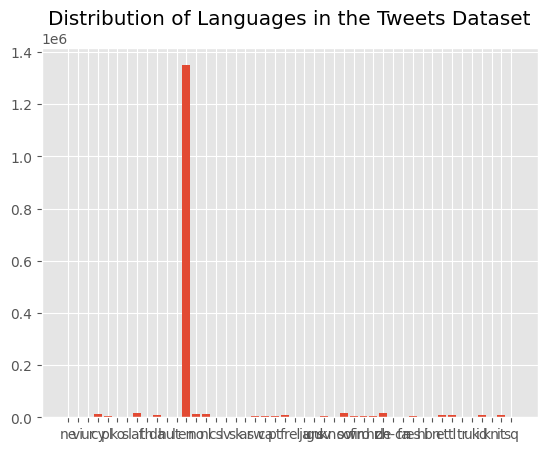

In [ ]:
df_timeline['language'] = languages
plt.bar(range(len(languages_dict)), list(languages_dict.values()), align='center')
plt.xticks(range(len(languages_dict)), list(languages_dict.keys()))
plt.title("Distribution of Languages in the Tweets Dataset")
plt.show()

In [ ]:
df_timeline[df_timeline['language'] == 'unknown'].text

,text
7202,New Emoji🤣🤡🤠🤤🤥🤐🤢🤧🕵🏻‍♀️🕵🏻👩🏼‍⚕️👨🏼‍⚕️👩🏼‍🌾👨🏼‍🌾👩🏻‍🍳...
20814,ｊｉｍｉｎ ｗｉｔｈ ｈｉｓｃｒｅｅｐｙｓｍｉｌｅ
21685,RT @ChristmasCount: 🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟🌟\n🌟🎅🎅🎅🎅🌟🎅🎅🎅🎅🌟\n...
37465,GOSH😍😍😍😍😍😍😍😍😍 https://t.co/BhcMMO3xQg
40275,RT if u love\n❤❤❤❤\n❤\n❤ ❤❤\n❤ ❤\...
...,...
1497195,she lost😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭😭 ...
1512966,THEYRE@COMIGNGNGNNF
1515299,*Worst behavior* 😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂...
1521431,Jonathan to Nigerians : 😛😛😛😛😝😝😝😝😝😝😝😝😝😝😝😝😝😝😝😝😝😝...


In [ ]:
df_timeline = df_timeline[df_timeline['language'] == 'en']

df_timeline['word_count'] = df_timeline['text'].apply(word_count)
df_timeline['word_count'].describe()

<ipython-input-15-5a9d551f7144>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timeline['word_count'] = df_timeline['text'].apply(word_count)


,word_count
count,1.348915e+06
mean,1.328902e+01
std,6.678607e+00
min,1.000000e+00
25%,8.000000e+00
50%,1.200000e+01
75%,1.800000e+01
max,1.130000e+02


In [ ]:
WordCount_TargetClass (df_timeline, 'text', target='depression')

<ipython-input-7-e98451e0e2fb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['word_count'] = data[column].apply(word_count)


In [ ]:
df_timeline.columns

Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
       'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str',
       'in_reply_to_screen_name', 'geo', 'coordinates', 'place',
       'is_quote_status', 'retweet_count', 'favorite_count', 'favorited',
       'retweeted', 'possibly_sensitive', 'extended_entities',
       'quoted_status_id', 'quoted_status_id_str', 'user_id', 'depression',
       'retweeted_status', 'quoted_status', 'language', 'word_count'],
      dtype='object')

In [ ]:
df_final = df_timeline[['created_at', 'user_id', 'id', 'text',
                           'in_reply_to_status_id', 'in_reply_to_user_id',
                           'is_quote_status', 'quoted_status_id', 'retweeted_status',
                           'quoted_status', 'word_count', 'depression']]

In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1348915 entries, 0 to 1533645
Data columns (total 12 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   created_at             1348915 non-null  object 
 1   user_id                1348915 non-null  int64  
 2   id                     1348915 non-null  int64  
 3   text                   1348915 non-null  object 
 4   in_reply_to_status_id  452500 non-null   float64
 5   in_reply_to_user_id    490601 non-null   float64
 6   is_quote_status        1348915 non-null  bool   
 7   quoted_status_id       7986 non-null     float64
 8   retweeted_status       96236 non-null    object 
 9   quoted_status          4335 non-null     object 
 10  word_count             1348915 non-null  int64  
 11  depression             1348915 non-null  bool   
dtypes: bool(2), float64(3), int64(3), object(4)
memory usage: 115.8+ MB


In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_unstructured_data.csv"
df_final.to_csv(save_path, index=False)

In [ ]:
tqdm.pandas()  # Enables tqdm for Pandas

In [ ]:
df_timeline['processed_text'] = df_timeline['text'].progress_apply(process_text)

100%|██████████| 697571/697571 [05:54<00:00, 1966.88it/s]
<ipython-input-16-158587007f0e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_timeline['processed_text'] = df_timeline['text'].progress_apply(process_text)


In [ ]:
text_1 = df_timeline['processed_text'].values
text = []
for x in text_1:
    text.append(' '.join(x))

df_timeline['processedtext'] = text
text_1

array(["['ugly', 'wig']", "['met']", "['snapchat', 'stats']", ...,
       "['killeating disorder', 'haram', 'atrending topicacks', 'troop', 'yobe']",
       "['addeating disorder', 'video', 'playlist', 'fact']",
       "['that is', 'self-harmit', 'early', 'moright nowing', 'layereating disorder', 'kak', 'hot', 'fuck', 'man', 'I am', 'buright nowing', ':(']"],
      dtype=object)

In [ ]:
df_final[df_final['processed_text_2']!=''].iloc[-1].text, df_final[df_final['processed_text_2']!=''].iloc[-1].processed_text_2,

("So that's the shit part about an early morning. All layered up and now its kak hot. Fuck man I'm burning up:(",
 'that is self-harmit early moright nowing layereating disorder kak hot fuck man I am buright nowing :(')

In [ ]:
df_final

,id,created_at,user_id,text,favorited,retweeted,favorite_count,retweet_count,in_reply_to_status_id,target,language,word_count,processed_text,processed_text_2
0,599400213002911744,2015-05-16 02:25:21+00:00,5.953225e+08,what is with the ugly wig http://t.co/RsddXnvkcj,False,False,1,0,NaN,True,en,7,"[ugly, wig]",ugly wig
1,507961236630548480,2014-09-05 18:39:30+00:00,2.416790e+09,@thats0justine pls have you met me,False,False,0,0,5.079577e+17,True,en,6,[met],met
2,682248060790005760,2015-12-30 17:13:07+00:00,2.301939e+09,Snapchat Stats!!! https://t.co/f85RgZPsSd http...,False,False,0,0,NaN,True,en,4,"[snapchat, stats]",snapchat stats
3,819145249419300864,Wed Jan 11 11:33:41 +0000 2017,NaN,Defendant 'cuts throat' in Haverfordwest Magis...,False,False,0,0,NaN,False,en,8,"[defendant, cut, throat, haverfordwest, magist...",defendant cut throat haverfordwest magistrate ...
4,817219461384060929,Fri Jan 06 04:01:17 +0000 2017,NaN,Your mind is brimming with good ideas about ne...,False,False,0,0,NaN,False,en,15,"[mind, brimming, good, idea, nearly, cancer]",mind brimming good idea nearly cancer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1003485,819443505936367616,Thu Jan 12 07:18:50 +0000 2017,NaN,I LOVE YOU LEE MINHO,False,False,0,0,NaN,False,en,5,"[love, lee, minho]",love lee minho
1003486,444551167683465217,2014-03-14 19:10:32+00:00,1.168311e+08,"DOPE!!!Freddie Gibbs's ""Real (Jeezy Diss) [Pro...",False,False,0,0,NaN,True,en,10,"[dope, freating disorderdie, gibbs's, real, je...",dope freating disorderdie gibbs's real jeezy d...
1003487,818352101877252096,Mon Jan 09 07:01:59 +0000 2017,NaN,Many Killed As B’haram Attacks Troops In Yobe ...,False,False,0,0,NaN,False,en,9,"[killeating disorder, haram, atrending topicac...",killeating disorder haram atrending topicacks ...
1003488,810906631299092482,Mon Dec 19 17:56:21 +0000 2016,NaN,I added a video to a @YouTube playlist https:/...,False,False,1,0,NaN,False,en,13,"[addeating disorder, video, playlist, fact]",addeating disorder video playlist fact


In [ ]:
df_final = df_final.drop(columns=['processed_text', 'processed_text_2', 'language'])

save_path = "/content/drive/MyDrive/MentalHealthProject/timeline_indiv_texts.csv"
df_final.to_csv(save_path, index=False)

In [ ]:
# Print most frequent bigrams

max_features = 2**12
df_bigram = vectorize(text, max_features, 2, 2, min_df=0.001, max_df=0.95)

df_bigram.head(60)

,frequency,ngrams
0,148.778147,laugh out
1,144.618596,out loud
2,131.509322,neeating disorder
3,131.173856,gin real
4,122.074480,self harme
5,118.743823,self harmit
6,114.816710,depressuicidal ideationon
7,96.372060,real life
8,86.428814,diagnoseating disorder
9,83.119480,self harmould


In [ ]:
# Print most frequent trigrams

df_trigram = vectorize(text, max_features, 3, 3, min_df=0.001, max_df=0.95)  # trigrams

df_trigram.head(60)

,frequency,ngrams
0,240.136958,laugh out loud
1,151.062112,gin real life
2,107.939554,oh my god
3,102.347754,disorder depressuicidal ideationon
4,101.605463,laughing my ass
5,101.497856,my ass off
6,98.104749,ask me anythingzing
7,96.854894,diagnoseating disorder depressuicidal
8,91.034069,seasonal affective disorder
9,90.655242,fami love you


In [ ]:
from hashformers import TransformerWordSegmenter as WordSegmenter

ws = WordSegmenter(
    segmenter_model_name_or_path="distilgpt2",
    segmenter_model_type="incremental",
    reranker_model_name_or_path=None
)


def process_text(text):
    text = casual_tokenizer(text)
    text = [each.lower() for each in text]
    text = [emoji.replace_emoji(each, replace="") for each in text]  # Remove emojis
    text = ws.segment(text)     # Split hashtags only
    text = [word for each in text for word in (each if isinstance(each, list) else [each])]  # Flatten list
    text = [each.strip() for each in text]
    text = [re.sub(r'http[s]?://\S+', '', each) for each in text]   # Remove URLs
    text = [re.sub(r'@\w+', '', each) for each in text]             # Remove mentions (@usernames)
    text = [re.sub(r'#', '', each) for each in text]                # Remove remaining hashtags
    text = [re.sub('[0-9]+', '', each) for each in text]
    text = [expandContractions(each, c_re=c_re) for each in text]
    text = [lemmatizer.lemmatize(each) for each in text]
    text = [w for w in text if w not in punc]
    text = [w for w in text if w not in stop_words]
    text = [each for each in text if len(each) > 1]
    return text

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/762 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

In [ ]:
def process_hashtags(text):
    if pd.notna(text):
        text = casual_tokenizer(text)
        text = ws.segment(text)     # Split hashtags only
        text = [each.lower() for each in text]
        text = [emoji.replace_emoji(each, replace="") for each in text]  # Remove emojis
        text = [word for each in text for word in (each if isinstance(each, list) else [each])]  # Flatten list
        text = [each.strip() for each in text]
        text = [re.sub(r'http[s]?://\S+', '', each) for each in text]   # Remove URLs
        text = [re.sub(r'@\w+', '', each) for each in text]             # Remove mentions (@usernames)
        text = [re.sub(r'#', '', each) for each in text]                # Remove remaining hashtags
        text = [re.sub('[0-9]+', '', each) for each in text]
        text = [expandContractions(each, c_re=c_re) for each in text]
        text = [lemmatizer.lemmatize(each) for each in text]
        text = [w for w in text if w not in punc]
        text = [w for w in text if w not in stop_words]
        text = [each for each in text if len(each) > 1]
    return text

In [ ]:
df_final.hashtags.iloc[0]

'ArchangelMichael, FF, runningupthathill, InThisMomentlyrics, Dominionstory, christiancooke, ReNewDominion, Michael, MarsIsComing, soreal, whyigive, BeKind, nochill, DOminionstory, teamarchangel, Nomalove, Clates, Curious, TeamMichael, Free2BeYOU, Dominion, DOMINION, WCW, DeanWinchester, dominion, depressionawareness, Monday, DominionStory, LetoBrothers, Flashbacks, SuicidePreventionMonth, LifesBigQuestions, Supernatural, DominionS3, ITM, GirlsWithGuns, 6yeargone, Alexs, Ep, Free2Luv, movingpastthetragedies, Noma, thetruth, NomaLove, Alex, GiveNomaHerWingsBack, Miguel, SongsforFlight, Renewdominion, Gabriel, RenewDominion, Hurricane, nomalove, TeamArchangel'

In [ ]:
process_hashtags(df_final.hashtags.iloc[0])

['archangel michael',
 'ff',
 'running up that hill',
 'in this moment lyrics',
 'dominion story',
 'christiancooke',
 're new dominion',
 'michael',
 'mars is coming',
 'so real',
 'why i give',
 'be kind',
 'no chill',
 'do minion story',
 'team archangel',
 'noma love',
 'clates',
 'curious',
 'team michael',
 'free',
 ' be you',
 'dominion',
 'dominion',
 'wcw',
 'dean winchester',
 'dominion',
 'depressuicidal ideationon awareness',
 'monday',
 'dominion story',
 'leto brothers',
 'flaself-harmbacks',
 'suicide prevention month',
 'life s big questions',
 'superight nowatural',
 'dominion s',
 'itm',
 'gin real lifes with guns',
 ' year gone',
 'alexs',
 'ep',
 'free',
 ' luv',
 'moving past the trageating disorderies',
 'noma',
 'the truth',
 'noma love',
 'alex',
 'give noma her wings back',
 'miguel',
 'songs for flight',
 'renew dominion',
 'gabriel',
 'renew dominion',
 'hurricane',
 'noma love',
 'team archangel']

In [ ]:
process_hashtags(df_final.hashtags.iloc[0])

['archangel michael',
 'ff',
 'running up that hill',
 'in this moment lyrics',
 'dominion story',
 'christiancooke',
 'renew dominion',
 'michael',
 'mars is coming',
 'so real',
 'why i give',
 'be kind',
 'no chill',
 'dominion story',
 'team archangel',
 'noma love',
 'clates',
 'curious',
 'team michael',
 'free',
 ' be you',
 'dominion',
 'dominion',
 'wcw',
 'deanwinchester',
 'dominion',
 'depressuicidal ideationon awareness',
 'monday',
 'dominion story',
 'le to brothers',
 'flaself-harmbacks',
 'suicide prevention month',
 'lifes big questions',
 'superight nowatural',
 'dominion',
 'itm',
 'gin real lifes with guns',
 ' year gone',
 'alexs',
 'ep',
 'free',
 'luv',
 'moving past the trageating disorderies',
 'noma',
 'the truth',
 'noma love',
 'alex',
 'givenoma her wings back',
 'miguel',
 'songs for flight',
 'renew dominion',
 'gabriel',
 'renew dominion',
 'hurricane',
 'noma love',
 'team archangel']

In [ ]:
df_final.hashtags

,hashtags
0,"ArchangelMichael, FF, runningupthathill, InThi..."
1,"HAWAYTHELADS, NOLA, Psalm126, LegionOfBoom, SB..."
2,"TheLongDark, help, Weather, posts, fallenlondo..."
3,NaN
5,"nswvotes, dolphins, Firefox, Canon, Flash, WAF..."
...,...
3493,"BlackLivesMatter, Kardashian, Hollywood, Karda..."
3495,HappyBirthdayZaynMalik
3496,NaN
3498,NaN


In [ ]:
df_final['processed_hashtags'] = df_final['hashtags'].progress_apply(process_hashtags)

 47%|████▋     | 1532/3244 [1:37:05<2:06:39,  4.44s/it]

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline_hashtags_preprocessed.csv"
df_final = pd.read_csv(file_path)

In [ ]:
df_final['processed_text'] = df_final['text'].progress_apply(process_text)

  0%|          | 1/3244 [06:13<336:01:58, 373.02s/it]


OutOfMemoryError: CUDA out of memory. Tried to allocate 926.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 102.12 MiB is free. Process 10507 has 14.64 GiB memory in use. Of the allocated memory 14.48 GiB is allocated by PyTorch, and 39.72 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
# Convert DataFrame to dictionary
bigrams = dict(zip(df_bigram["ngrams"], [1] * len(df_bigram)))
trigrams = dict(zip(df_trigram["ngrams"], [1] * len(df_trigram)))

# Merge all tokens in df_final['processed_text'] to one string
df_final['temp'] = df_final['processed_text'].apply(lambda x: ' '.join(x))

# If two consecutive words like mental and health are encountered in the text, then replace them with mental_health if they are in bigrams dictionary
def replace_bigrams(text):
    text = text.split()
    # for words in text check if word and next word are in bigrams dictionary, if yes then replace them with bigram
    for i in range(len(text)-1):
        if text[i] + ' ' + text[i+1] in bigrams:
            text[i] = text[i] + '_' + text[i+1]
            text[i+1] = ''
    # remove empty strings
    text = [x for x in text if x != '']
    return text

# Same as above but for trigrams
def replace_trigrams(text):
    text = text.split()
    for i in range(len(text)-2):
        if text[i] + ' ' + text[i+1] + ' ' + text[i+2] in trigrams:
            text[i] = text[i] + '_' + text[i+1] + '_' + text[i+2]
            text[i+1] = ''
            text[i+2] = ''
    text = [x for x in text if x != '']
    return text

df_final['temp'] = df_final['temp'].apply(lambda x: replace_trigrams(x))
df_final['temp'] = df_final['temp'].apply(lambda x: ' '.join(x))
df_final['temp'] = df_final['temp'].apply(lambda x: replace_bigrams(x))
df_final['temp'] = df_final['temp'].apply(lambda x: ' '.join(x))

#### Users Data (Profiles' Descriptions)

In [ ]:
users["description"] = users["description"].astype(str).fillna("")
users["description"] = users["description"].replace("", "unknown")

languages = language_detection (users, "description")

  1%|          | 62/11051 [00:01<02:43, 67.01it/s]

text: ['💯'], all_words: {'💯'}
--------------------
unknown
--------------------


  1%|          | 75/11051 [00:01<02:12, 82.60it/s]

text: ['○https://t.co/n4JiCTir9N'], all_words: {'○https://t.co/n4JiCTir9N'}
--------------------
unknown
--------------------


  3%|▎         | 332/11051 [00:05<04:01, 44.31it/s]

text: ['17'], all_words: {'17'}
--------------------
unknown
--------------------


  3%|▎         | 362/11051 [00:06<03:21, 53.01it/s]

text: ['♛'], all_words: {'♛'}
--------------------
unknown
--------------------


  5%|▍         | 505/11051 [00:08<03:02, 57.65it/s]

text: ['333'], all_words: {'333'}
--------------------
unknown
--------------------
text: ['🎄🎄🎄🎅🏻🎅🏻🎅🏻'], all_words: {'🎄🎄🎄🎅🏻🎅🏻🎅🏻'}
--------------------
unknown
--------------------


  5%|▌         | 589/11051 [00:10<02:16, 76.53it/s]

text: ['◤', '･ﾟ✧*', '18%', "⋮〔ᴀᴛʜᴇɴᴀ's", 'ᴄʜɪʟᴅ', '⇌', 'Cᴏᴜɴsᴇʟᴏʀ〕∫', '↺', '☾✦', '↬', '❛Nᴇᴠᴇʀ', 'ᴄᴀʟʟ', 'ᴍᴇ', 'ᴄᴏʟᴅ﹐', 'ʀᴇᴍᴇᴍʙᴇʀ', 'ᴛʜᴀᴛ', 'ᴀ', 'ʙʀᴏᴋᴇɴ', 'ᴘᴇʀsᴏɴ', 'ɴᴇᴠᴇʀ', 'ɢᴏᴇs', 'ʙᴀᴄᴋ', 'ᴛᴏ', 'ʙᴇɪɴɢ', 'ᴛʜᴇ', 'sᴀᴍᴇ.❜', '˹K', '›', 'T', '›', 'Y', '›', 'L', '›', 'L˼'], all_words: {'Y', '↺', '↬', '⇌', 'ᴄᴀʟʟ', 'ᴛʜᴀᴛ', 'ʙʀᴏᴋᴇɴ', '›', '◤', '☾✦', 'L', 'ɢᴏᴇs', 'ʙᴀᴄᴋ', '18%', 'ᴄᴏʟᴅ﹐', 'ᴍᴇ', 'Cᴏᴜɴsᴇʟᴏʀ〕∫', 'L˼', '･ﾟ✧*', '˹K', 'T', 'ᴘᴇʀsᴏɴ', 'sᴀᴍᴇ.❜', 'ʙᴇɪɴɢ', 'ɴᴇᴠᴇʀ', 'ᴛʜᴇ', '❛Nᴇᴠᴇʀ', 'ᴄʜɪʟᴅ', 'ᴀ', "⋮〔ᴀᴛʜᴇɴᴀ's", 'ʀᴇᴍᴇᴍʙᴇʀ', 'ᴛᴏ'}
--------------------
unknown
--------------------
text: ['18'], all_words: {'18'}
--------------------
unknown
--------------------
text: ['†'], all_words: {'†'}
--------------------
unknown
--------------------


  6%|▌         | 682/11051 [00:11<02:30, 68.94it/s]

text: ['https://t.co/13CbKPS7y7'], all_words: {'https://t.co/13CbKPS7y7'}
--------------------
unknown
--------------------


  7%|▋         | 723/11051 [00:12<03:00, 57.37it/s]

text: ['https://t.co/Xe4UHjPp0z'], all_words: {'https://t.co/Xe4UHjPp0z'}
--------------------
unknown
--------------------
text: ['🇲🇦', '🇱🇧'], all_words: {'🇱🇧', '🇲🇦'}
--------------------
unknown
--------------------


  7%|▋         | 776/11051 [00:12<01:53, 90.74it/s]

text: ['💙💗⚪️💗💙'], all_words: {'💙💗⚪️💗💙'}
--------------------
unknown
--------------------


  8%|▊         | 890/11051 [00:14<01:32, 110.03it/s]

text: ['https://t.co/UVLSpga1il'], all_words: {'https://t.co/UVLSpga1il'}
--------------------
unknown
--------------------
text: ['💘'], all_words: {'💘'}
--------------------
unknown
--------------------


  9%|▉         | 997/11051 [00:15<01:56, 86.23it/s]

text: ['07.02.15', '|', '|', '01.25.16'], all_words: {'|', '01.25.16', '07.02.15'}
--------------------
unknown
--------------------


  9%|▉         | 1008/11051 [00:15<01:49, 91.47it/s]

text: ['11:11'], all_words: {'11:11'}
--------------------
unknown
--------------------


 10%|▉         | 1071/11051 [00:16<01:33, 106.39it/s]

text: ['🇨🇱'], all_words: {'🇨🇱'}
--------------------
unknown
--------------------


 10%|▉         | 1101/11051 [00:16<01:56, 85.12it/s]

text: ['¥'], all_words: {'¥'}
--------------------
unknown
--------------------


 12%|█▏        | 1314/11051 [00:19<02:02, 79.78it/s]

text: ['🌺'], all_words: {'🌺'}
--------------------
unknown
--------------------
text: ['https://t.co/OZKqYgAhIr'], all_words: {'https://t.co/OZKqYgAhIr'}
--------------------
unknown
--------------------


 12%|█▏        | 1340/11051 [00:19<01:46, 91.10it/s]

text: ['12/4/12,', '1/13/13,', '9/17/13,', '10/25/13'], all_words: {'9/17/13,', '1/13/13,', '12/4/12,', '10/25/13'}
--------------------
unknown
--------------------


 13%|█▎        | 1399/11051 [00:20<02:34, 62.40it/s]

text: ['20', '♈️💫🌙'], all_words: {'20', '♈️💫🌙'}
--------------------
unknown
--------------------


 13%|█▎        | 1425/11051 [00:21<02:48, 57.09it/s]

text: ['💆🏼'], all_words: {'💆🏼'}
--------------------
unknown
--------------------


 14%|█▎        | 1494/11051 [00:22<03:41, 43.20it/s]

text: ['29|10|10'], all_words: {'29|10|10'}
--------------------
unknown
--------------------


 14%|█▍        | 1552/11051 [00:24<02:36, 60.63it/s]

text: ['03.13.14'], all_words: {'03.13.14'}
--------------------
unknown
--------------------
text: ['ytg//⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀', '⠀⠀⠀⠀⠀⠀⠀', '⠀⠀', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀', '⠀⠀⠀⠀i', 'tried'], all_words: {'⠀⠀⠀⠀⠀⠀⠀', 'tried', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀', '⠀⠀⠀', '⠀⠀⠀⠀i', 'ytg//⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀'}
--------------------
unknown
--------------------
text: ['||', '', 'ᶜᵘʳʳᵉᶰᵗᶫʸ', 'ᶦᶰ', 'ᴷᴴ', 'ᵃᶰᵈ', 'ᶠᶠˣᵛ', 'ʰᵉᶫᶫ⁻', 'ʰᵉᶫᵖ', 'ᵐᵉ', '||', 'ᶦ', 'ʷᵃᶰᵗ', 'ᵗᵒ', 'ʳᶦᵈᵉ', 'ᵐʸ', 'ᶜʰᵒᶜᵒᵇᵒ', 'ᵃᶫᶫ', 'ᵈᵃʸ', '!!', '||'], all_words: {'', 'ᶜʰᵒᶜᵒᵇᵒ', 'ᵃᶰᵈ', '!!', 'ᶦ', 'ᶠᶠˣᵛ', '||', 'ᵗᵒ', 'ʷᵃᶰᵗ', 'ᴷᴴ', 'ᶦᶰ', 'ʳᶦᵈᵉ', 'ʰᵉᶫᶫ⁻', 'ᵐᵉ', 'ᵐʸ', 'ᵃᶫᶫ', 'ʰᵉᶫᵖ', 'ᶜᵘʳʳᵉᶰᵗᶫʸ', 'ᵈᵃʸ'}
--------------------
unknown
--------------------


 15%|█▍        | 1607/11051 [00:25<02:35, 60.55it/s]

text: ['.☽'], all_words: {'.☽'}
--------------------
unknown
--------------------


 15%|█▍        | 1641/11051 [00:25<01:45, 88.90it/s]

text: ['💙', '➕', '💕', '=', '❤️'], all_words: {'=', '❤️', '➕', '💙', '💕'}
--------------------
unknown
--------------------


 15%|█▌        | 1709/11051 [00:26<01:44, 89.77it/s]

text: ['✌'], all_words: {'✌'}
--------------------
unknown
--------------------
text: ['~~~~~'], all_words: {'~~~~~'}
--------------------
unknown
--------------------


 16%|█▌        | 1775/11051 [00:27<01:40, 92.71it/s]

text: ['\\]'], all_words: {'\\]'}
--------------------
unknown
--------------------
text: ['☀️'], all_words: {'☀️'}
--------------------
unknown
--------------------


 16%|█▋        | 1813/11051 [00:27<01:55, 79.87it/s]

text: ['20', ';'], all_words: {';', '20'}
--------------------
unknown
--------------------


 17%|█▋        | 1906/11051 [00:28<01:38, 92.98it/s]

text: ['1998'], all_words: {'1998'}
--------------------
unknown
--------------------


 18%|█▊        | 1985/11051 [00:30<02:05, 72.05it/s]

text: ['♡♡'], all_words: {'♡♡'}
--------------------
unknown
--------------------


 20%|█▉        | 2195/11051 [00:33<01:58, 74.88it/s]

text: ['🖤', '...'], all_words: {'🖤', '...'}
--------------------
unknown
--------------------


 21%|██        | 2288/11051 [00:36<05:32, 26.32it/s]

text: ['https://t.co/rnspZDYlvW'], all_words: {'https://t.co/rnspZDYlvW'}
--------------------
unknown
--------------------


 22%|██▏       | 2482/11051 [00:41<03:52, 36.79it/s]

text: ['💀💀'], all_words: {'💀💀'}
--------------------
unknown
--------------------


 23%|██▎       | 2515/11051 [00:42<02:57, 48.14it/s]

text: ['20'], all_words: {'20'}
--------------------
unknown
--------------------


 24%|██▎       | 2602/11051 [00:44<01:44, 81.06it/s]

text: ['19', '🇸🇴'], all_words: {'19', '🇸🇴'}
--------------------
unknown
--------------------


 24%|██▍       | 2628/11051 [00:44<01:27, 96.11it/s]

text: ['07/11/1948', '-', '09/18/2006🙏🏼'], all_words: {'-', '09/18/2006🙏🏼', '07/11/1948'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 25%|██▍       | 2729/11051 [00:45<01:59, 69.56it/s]

text: ['1/1'], all_words: {'1/1'}
--------------------
unknown
--------------------


 27%|██▋       | 3007/11051 [00:48<01:23, 95.92it/s] 

text: ['⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀22⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀Caribbean', 'University', '\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀02/10/2015', '♡', '⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\nOr', 'not', 'to', 'be.'], all_words: {'♡', 'University', '⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\nOr', 'be.', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀22⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀Caribbean', '\n⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀02/10/2015', 'to', 'not'}
--------------------
unknown
--------------------


 28%|██▊       | 3066/11051 [00:49<01:17, 103.56it/s]

text: ['🥀'], all_words: {'🥀'}
--------------------
unknown
--------------------


 28%|██▊       | 3142/11051 [00:50<01:11, 111.33it/s]

text: ['-', '....', '..', '...', '/', '..', '...', '/', '--', '-.--', '/', '-', '.--', '..', '-', '-', '.', '.-.', '/', '-...', '..', '---', '/', '..', '-.', '/', '--', '---', '.-.', '...', '.', '/', '-.-.', '---', '-..', '.'], all_words: {'-', '.--', '...', '.', '/', '.-.', '....', '-...', '--', '-.--', '---', '-.-.', '-.', '-..', '..'}
--------------------
unknown
--------------------
text: ['9.8.11'], all_words: {'9.8.11'}
--------------------
unknown
--------------------


 29%|██▊       | 3166/11051 [00:50<01:29, 88.01it/s] 

text: ['http://t.co/7IRUJYHM5y'], all_words: {'http://t.co/7IRUJYHM5y'}
--------------------
unknown
--------------------
text: ['pare.72@libero.it'], all_words: {'pare.72@libero.it'}
--------------------
unknown
--------------------


 29%|██▉       | 3227/11051 [00:51<01:14, 105.39it/s]

text: ['🌞🌚'], all_words: {'🌞🌚'}
--------------------
unknown
--------------------
text: ['🖖🏼'], all_words: {'🖖🏼'}
--------------------
unknown
--------------------


 30%|███       | 3322/11051 [00:52<01:46, 72.28it/s]

text: ['20|➰'], all_words: {'20|➰'}
--------------------
unknown
--------------------


 33%|███▎      | 3632/11051 [00:57<01:05, 113.50it/s]

text: ['#574'], all_words: {'#574'}
--------------------
unknown
--------------------


 34%|███▍      | 3745/11051 [00:59<01:17, 94.71it/s]

text: ['$1B💸👼🏻'], all_words: {'$1B💸👼🏻'}
--------------------
unknown
--------------------


 34%|███▍      | 3765/11051 [00:59<01:22, 87.89it/s]

text: ['ᴵᴿᴵᴬᴺᴬ⁶'], all_words: {'ᴵᴿᴵᴬᴺᴬ⁶'}
--------------------
unknown
--------------------


 34%|███▍      | 3810/11051 [01:00<01:35, 75.51it/s]

text: ['🇩🇴'], all_words: {'🇩🇴'}
--------------------
unknown
--------------------


 35%|███▌      | 3887/11051 [01:00<01:12, 98.26it/s]

text: ['ㅤ'], all_words: {'ㅤ'}
--------------------
unknown
--------------------
text: ['🌙'], all_words: {'🌙'}
--------------------
unknown
--------------------


 35%|███▌      | 3902/11051 [01:01<01:04, 110.48it/s]

text: ['🍓', '🍒', '👼🏼', '💋'], all_words: {'👼🏼', '🍓', '💋', '🍒'}
--------------------
unknown
--------------------


 36%|███▌      | 3987/11051 [01:02<01:21, 87.13it/s]

text: ['∙̆.̯∙̆'], all_words: {'∙̆.̯∙̆'}
--------------------
unknown
--------------------


 37%|███▋      | 4140/11051 [01:04<01:24, 81.37it/s]

text: ['19'], all_words: {'19'}
--------------------
unknown
--------------------
text: ['20'], all_words: {'20'}
--------------------
unknown
--------------------
text: ['💖'], all_words: {'💖'}
--------------------
unknown
--------------------


 38%|███▊      | 4190/11051 [01:04<01:21, 84.09it/s]

text: ['\\^0^/'], all_words: {'\\^0^/'}
--------------------
unknown
--------------------


 38%|███▊      | 4225/11051 [01:05<01:24, 80.79it/s]

text: ['21.', '♓️✨'], all_words: {'♓️✨', '21.'}
--------------------
unknown
--------------------
text: ['916', '🌹'], all_words: {'🌹', '916'}
--------------------
unknown
--------------------


 39%|███▉      | 4298/11051 [01:06<01:29, 75.06it/s]

text: ['🇩🇪🇼🇸'], all_words: {'🇩🇪🇼🇸'}
--------------------
unknown
--------------------


 39%|███▉      | 4322/11051 [01:06<02:05, 53.44it/s]

text: ['👸🏼👅💄❤️'], all_words: {'👸🏼👅💄❤️'}
--------------------
unknown
--------------------


 39%|███▉      | 4364/11051 [01:08<03:22, 33.01it/s]

text: ['17'], all_words: {'17'}
--------------------
unknown
--------------------
text: ['✖️✖️'], all_words: {'✖️✖️'}
--------------------
unknown
--------------------


 41%|████      | 4517/11051 [01:09<00:45, 142.24it/s]

text: ['☠17', '♂', '❘', '2/5/2016┋ᴸᵒʷ⁻ᵏᵉʸ', 'ʰᵃᵗᵉˢ', 'ˢᵖᵒʳᵗᵃᶠˡᵒᵖ┋@cactusbun♡\nGᴀᴍᴇs', 'ᴀɴᴅ', 'Sᴛᴜғғ', '﹣', 'Pʀᴏʙᴀʙʟʏ', 'Mᴇɢᴀ', 'Mᴀɴ'], all_words: {'Sᴛᴜғғ', '♂', 'Mᴀɴ', '❘', '☠17', 'Pʀᴏʙᴀʙʟʏ', '2/5/2016┋ᴸᵒʷ⁻ᵏᵉʸ', 'ʰᵃᵗᵉˢ', 'Mᴇɢᴀ', '﹣', 'ᴀɴᴅ', 'ˢᵖᵒʳᵗᵃᶠˡᵒᵖ┋@cactusbun♡\nGᴀᴍᴇs'}
--------------------
unknown
--------------------
text: ['💰'], all_words: {'💰'}
--------------------
unknown
--------------------


 42%|████▏     | 4588/11051 [01:10<00:51, 126.15it/s]

text: ['http://t.co/mR9pgGXA6t', 'https://t.co/ERjHhrzmUk', 'http://t.co/CEFtP4RG3g?'], all_words: {'http://t.co/mR9pgGXA6t', 'http://t.co/CEFtP4RG3g?', 'https://t.co/ERjHhrzmUk'}
--------------------
unknown
--------------------


 42%|████▏     | 4645/11051 [01:10<00:50, 126.99it/s]

text: ['⠀⠀⠀⠀⠀⠀⠀⠀⠀✞|Chicago|✞', '⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀⠀FRE$H', 'LABOR™,', 'LLC⠀', 'raythedesigner1@yahoo.com', '⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀'], all_words: {'LABOR™,', '⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀⠀⠀⠀', 'raythedesigner1@yahoo.com', '⠀⠀⠀⠀⠀⠀⠀⠀⠀✞|Chicago|✞', 'LLC⠀', '⠀⠀⠀⠀⠀⠀FRE$H'}
--------------------
text: ['💙'], all_words: {'💙'}
--------------------
unknown
--------------------


 43%|████▎     | 4706/11051 [01:11<00:37, 171.40it/s]

text: ['https://t.co/cmIKP0WTxB'], all_words: {'https://t.co/cmIKP0WTxB'}
--------------------
unknown
--------------------


 43%|████▎     | 4782/11051 [01:11<00:28, 219.60it/s]

text: ['47'], all_words: {'47'}
--------------------
unknown
--------------------


 45%|████▌     | 5011/11051 [01:12<00:29, 203.13it/s]

text: ['https://t.co/jXX1eOeI0b'], all_words: {'https://t.co/jXX1eOeI0b'}
--------------------
unknown
--------------------
text: ['🎅'], all_words: {'🎅'}
--------------------
unknown
--------------------
text: [';)'], all_words: {';)'}
--------------------
unknown
--------------------


 47%|████▋     | 5208/11051 [01:13<00:29, 201.35it/s]

text: ['864'], all_words: {'864'}
--------------------
unknown
--------------------


 48%|████▊     | 5300/11051 [01:13<00:29, 195.89it/s]

text: ['🏳️\u200d🌈'], all_words: {'🏳️\u200d🌈'}
--------------------
unknown
--------------------


 49%|████▊     | 5364/11051 [01:14<00:28, 197.06it/s]

text: ['+', '|-/', '28'], all_words: {'|-/', '28', '+'}
--------------------
unknown
--------------------
text: ['???'], all_words: {'???'}
--------------------
unknown
--------------------
text: [':)'], all_words: {':)'}
--------------------
unknown
--------------------


 49%|████▉     | 5433/11051 [01:14<00:27, 205.65it/s]

text: ['🤢🤢🤢🤢🤢'], all_words: {'🤢🤢🤢🤢🤢'}
--------------------
unknown
--------------------
text: ['--------'], all_words: {'--------'}
--------------------
unknown
--------------------


 50%|████▉     | 5475/11051 [01:14<00:27, 205.02it/s]

text: ['https://t.co/dHcRZL1VJj'], all_words: {'https://t.co/dHcRZL1VJj'}
--------------------
unknown
--------------------


 50%|█████     | 5538/11051 [01:15<00:27, 203.89it/s]

text: ['Ｄｉａｇｎｏｓｅｄ', 'Ａｎｏｒｅｘｉｃ.', "4'11", 'ＳＷ;146', 'ＣＷ;', '117', 'LW;', '107ＧＷ7;100', 'ＧＷ8;90', 'ＧＷ9;80', 'ＵＧＷ;', '75'], all_words: {'75', '117', "4'11", 'ＧＷ9;80', '107ＧＷ7;100', 'ＵＧＷ;', 'ＣＷ;', 'ＧＷ8;90', 'ＳＷ;146', 'Ａｎｏｒｅｘｉｃ.', 'LW;', 'Ｄｉａｇｎｏｓｅｄ'}
--------------------
unknown
--------------------
text: ['🚶🏽'], all_words: {'🚶🏽'}
--------------------
unknown
--------------------


 51%|█████▏    | 5679/11051 [01:15<00:23, 232.15it/s]

text: ['.', '.', '.'], all_words: {'.'}
--------------------
unknown
--------------------
text: ['🇹🇹'], all_words: {'🇹🇹'}
--------------------
unknown
--------------------


 52%|█████▏    | 5770/11051 [01:16<00:26, 201.73it/s]

text: ['lanni1987@live.co.uk', '', '\n\nlannic87@gmail.com'], all_words: {'', 'lanni1987@live.co.uk', '\n\nlannic87@gmail.com'}
--------------------
unknown
--------------------
text: ['♡'], all_words: {'♡'}
--------------------
unknown
--------------------


 53%|█████▎    | 5834/11051 [01:16<00:26, 195.64it/s]

text: ['#'], all_words: {'#'}
--------------------
unknown
--------------------
text: ['♎️⚖'], all_words: {'♎️⚖'}
--------------------
unknown
--------------------
text: ['♥'], all_words: {'♥'}
--------------------
unknown
--------------------


 54%|█████▍    | 5971/11051 [01:17<00:24, 206.99it/s]

text: ['......'], all_words: {'......'}
--------------------
unknown
--------------------
text: ['https://t.co/Rbw7g4CA5n'], all_words: {'https://t.co/Rbw7g4CA5n'}
--------------------
unknown
--------------------
text: ['https://t.co/F1cnSmpzkI'], all_words: {'https://t.co/F1cnSmpzkI'}
--------------------
unknown
--------------------


 55%|█████▍    | 6064/11051 [01:17<00:24, 201.24it/s]

text: ['✌🏾'], all_words: {'✌🏾'}
--------------------
unknown
--------------------
text: ['18'], all_words: {'18'}
--------------------
unknown
--------------------


 55%|█████▌    | 6116/11051 [01:17<00:21, 226.40it/s]

text: ['https://t.co/S8l6beiToE'], all_words: {'https://t.co/S8l6beiToE'}
--------------------
unknown
--------------------


 56%|█████▌    | 6183/11051 [01:18<00:23, 203.23it/s]

text: ['12/19', '💍'], all_words: {'12/19', '💍'}
--------------------
unknown
--------------------
text: ['🇪🇷'], all_words: {'🇪🇷'}
--------------------
unknown
--------------------
text: ['2014', '.', '09', '.', '25'], all_words: {'2014', '09', '.', '25'}
--------------------
unknown
--------------------
text: ['🖤'], all_words: {'🖤'}
--------------------
unknown
--------------------


 57%|█████▋    | 6306/11051 [01:18<00:23, 204.30it/s]

text: ['⠀⠀⠀⠀⠀⠀⠀⠀⠀“I', 'ᴅᴏɴ·ᴛ', 'ᴡᴀɴɴᴀ', 'ʙᴇ', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', 'ᴀ', 'ʟ', 'ᴏ', 'ɴ', 'ᴇ.', '.”'], all_words: {'.”', 'ᴡᴀɴɴᴀ', 'ᴏ', 'ʟ', 'ᴀ', '⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀', '⠀⠀⠀⠀⠀⠀⠀⠀⠀“I', 'ᴇ.', 'ɴ', 'ʙᴇ', 'ᴅᴏɴ·ᴛ'}
--------------------
unknown
--------------------


 59%|█████▉    | 6527/11051 [01:19<00:24, 186.84it/s]

text: ['💕💁🏽💋👑👫'], all_words: {'💕💁🏽💋👑👫'}
--------------------
unknown
--------------------


 61%|██████    | 6693/11051 [01:20<00:20, 207.57it/s]

text: ['☯'], all_words: {'☯'}
--------------------
unknown
--------------------
text: ['.'], all_words: {'.'}
--------------------
unknown
--------------------


 61%|██████    | 6751/11051 [01:21<00:28, 149.19it/s]

text: ['♍️'], all_words: {'♍️'}
--------------------
unknown
--------------------


 62%|██████▏   | 6849/11051 [01:22<00:31, 135.29it/s]

text: ['🇺🇾'], all_words: {'🇺🇾'}
--------------------
unknown
--------------------


 65%|██████▍   | 7175/11051 [01:24<00:22, 170.37it/s]

text: ['✖️✖️✖️'], all_words: {'✖️✖️✖️'}
--------------------
unknown
--------------------


 66%|██████▋   | 7323/11051 [01:25<00:17, 208.86it/s]

text: ['19'], all_words: {'19'}
--------------------
unknown
--------------------


 67%|██████▋   | 7423/11051 [01:26<00:15, 239.30it/s]

text: [';'], all_words: {';'}
--------------------
unknown
--------------------
text: ['❤04/07/15❤'], all_words: {'❤04/07/15❤'}
--------------------
unknown
--------------------


 68%|██████▊   | 7538/11051 [01:26<00:17, 196.97it/s]

text: ['⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀', '⠀⠀⠀', '⠀⠀⠀', '⠀#beourguest'], all_words: {'⠀⠀⠀', '⠀#beourguest', '⠀⠀'}
--------------------


 69%|██████▉   | 7649/11051 [01:27<00:17, 199.13it/s]

text: ['"ᴛʜᴇ', 'ʙᴇsᴛ', 'ᴏғ', 'ᴜs', 'ᴄᴀɴ', 'ғɪɴᴅ', 'ʜᴀᴘᴘɪɴᴇss,', 'ɪɴ', 'ᴍɪsᴇʀʏ."', "ʜᴇ's", 'ᴛʜᴇ', 'ᴏɴʟʏ', 'ᴏɴᴇ', 'ᴛʜᴀᴛ', 'ᴋᴇᴇᴘs', 'ᴍᴇ', 'sᴀɴᴇ.', 'ᴡɪᴛʜᴏᴜᴛ', 'ʜɪᴍ', "ɪ'ᴅ", 'ɢᴏ', 'ᴄʀᴀᴢʏ.', '{OC|Gay|Vixenn}'], all_words: {'"ᴛʜᴇ', "ɪ'ᴅ", 'ᴛʜᴀᴛ', "ʜᴇ's", 'ʜɪᴍ', 'ᴏғ', 'ᴡɪᴛʜᴏᴜᴛ', 'ʙᴇsᴛ', 'ɢᴏ', 'ᴏɴᴇ', 'ᴄᴀɴ', 'sᴀɴᴇ.', 'ɪɴ', 'ᴍᴇ', 'ᴜs', 'ʜᴀᴘᴘɪɴᴇss,', 'ғɪɴᴅ', 'ᴏɴʟʏ', 'ᴋᴇᴇᴘs', '{OC|Gay|Vixenn}', 'ᴛʜᴇ', 'ᴍɪsᴇʀʏ."', 'ᴄʀᴀᴢʏ.'}
--------------------
unknown
--------------------


 70%|██████▉   | 7725/11051 [01:27<00:14, 222.59it/s]

text: ['https://t.co/sKCwVNVvvs'], all_words: {'https://t.co/sKCwVNVvvs'}
--------------------
unknown
--------------------


 71%|███████   | 7825/11051 [01:28<00:14, 229.68it/s]

text: ['21'], all_words: {'21'}
--------------------
unknown
--------------------
text: ['334'], all_words: {'334'}
--------------------
unknown
--------------------


 71%|███████   | 7871/11051 [01:28<00:15, 201.90it/s]

text: ['...'], all_words: {'...'}
--------------------
unknown
--------------------
text: ['🧀⛷'], all_words: {'🧀⛷'}
--------------------
unknown
--------------------


 72%|███████▏  | 7979/11051 [01:28<00:14, 209.47it/s]

text: ['https://t.co/mkQppYT92y'], all_words: {'https://t.co/mkQppYT92y'}
--------------------
unknown
--------------------
text: ['🌭'], all_words: {'🌭'}
--------------------
unknown
--------------------


 74%|███████▍  | 8185/11051 [01:29<00:14, 199.39it/s]

text: ['🤷🏾\u200d♀️'], all_words: {'🤷🏾\u200d♀️'}
--------------------
unknown
--------------------


 75%|███████▍  | 8247/11051 [01:30<00:15, 185.60it/s]

text: ['3/4✡️', '', '1/4🍷'], all_words: {'', '1/4🍷', '3/4✡️'}
--------------------
unknown
--------------------


 75%|███████▌  | 8342/11051 [01:30<00:12, 209.25it/s]

text: ['17'], all_words: {'17'}
--------------------
unknown
--------------------
text: ['😇😈'], all_words: {'😇😈'}
--------------------
unknown
--------------------


 77%|███████▋  | 8490/11051 [01:31<00:13, 193.76it/s]

text: ['☹'], all_words: {'☹'}
--------------------
unknown
--------------------


 77%|███████▋  | 8549/11051 [01:31<00:14, 169.43it/s]

text: [','], all_words: {','}
--------------------
unknown
--------------------
text: ['😘💕👸👄👽💅'], all_words: {'😘💕👸👄👽💅'}
--------------------
unknown
--------------------


 78%|███████▊  | 8617/11051 [01:32<00:12, 187.65it/s]

text: ['❤️❤️❤️❤️'], all_words: {'❤️❤️❤️❤️'}
--------------------
unknown
--------------------


 79%|███████▉  | 8775/11051 [01:32<00:10, 209.00it/s]

text: ['♡'], all_words: {'♡'}
--------------------
unknown
--------------------
text: ['michaelbaya9@gmail.com'], all_words: {'michaelbaya9@gmail.com'}
--------------------
unknown
--------------------
text: ['✖️⚖', '𓅓'], all_words: {'𓅓', '✖️⚖'}
--------------------
unknown
--------------------


 80%|███████▉  | 8819/11051 [01:33<00:11, 192.74it/s]

text: ['https://t.co/l5zYc8bSeI'], all_words: {'https://t.co/l5zYc8bSeI'}
--------------------
unknown
--------------------


 80%|████████  | 8878/11051 [01:33<00:12, 176.16it/s]

text: ['19'], all_words: {'19'}
--------------------
unknown
--------------------


 82%|████████▏ | 9091/11051 [01:34<00:09, 208.29it/s]

text: ['🌈'], all_words: {'🌈'}
--------------------
unknown
--------------------


 83%|████████▎ | 9148/11051 [01:35<00:13, 136.56it/s]

text: ['https://t.co/TwmuaqjnPW'], all_words: {'https://t.co/TwmuaqjnPW'}
--------------------
unknown
--------------------


 85%|████████▌ | 9447/11051 [01:37<00:12, 130.96it/s]

text: ['❥♛'], all_words: {'❥♛'}
--------------------
unknown
--------------------


 86%|████████▌ | 9528/11051 [01:38<00:13, 111.70it/s]

text: ['______________________________________________________'], all_words: {'______________________________________________________'}
--------------------
unknown
--------------------


 88%|████████▊ | 9706/11051 [01:39<00:08, 165.57it/s]

text: ['https://t.co/BXN2qpkwQo'], all_words: {'https://t.co/BXN2qpkwQo'}
--------------------
unknown
--------------------
text: ['⏯️'], all_words: {'⏯️'}
--------------------
unknown
--------------------


 91%|█████████ | 10014/11051 [01:40<00:04, 214.24it/s]

text: ['💋'], all_words: {'💋'}
--------------------
unknown
--------------------


 94%|█████████▍| 10433/11051 [01:43<00:02, 209.94it/s]

text: ['910/🇷🇴'], all_words: {'910/🇷🇴'}
--------------------
unknown
--------------------


 95%|█████████▌| 10519/11051 [01:43<00:02, 188.71it/s]

text: ['ʸᵒᵘ', 'ˢᵃʸ', "ʰᵉ'ˢ", 'ʸᵒᵘʳ', 'ᴿᵒᵐᵉᵒ,', 'ᵇᵘᵗ', "ʸᵒᵘ'ʳᵉ", 'ⁿᵒᵗ', 'ʰⁱˢ', 'ᴶᵘˡⁱᵉᵗ.', '✨'], all_words: {'ʸᵒᵘʳ', '✨', "ʸᵒᵘ'ʳᵉ", 'ᴶᵘˡⁱᵉᵗ.', 'ᵇᵘᵗ', 'ʰⁱˢ', 'ⁿᵒᵗ', 'ʸᵒᵘ', "ʰᵉ'ˢ", 'ˢᵃʸ', 'ᴿᵒᵐᵉᵒ,'}
--------------------
unknown
--------------------
text: ['🙄'], all_words: {'🙄'}
--------------------
unknown
--------------------


 97%|█████████▋| 10699/11051 [01:44<00:01, 216.31it/s]

text: ['🦁'], all_words: {'🦁'}
--------------------
unknown
--------------------
text: [';)'], all_words: {';)'}
--------------------
unknown
--------------------


 98%|█████████▊| 10876/11051 [01:45<00:00, 197.08it/s]

text: ['⠀⠀⠀⠀⠀⠀12/11/15'], all_words: {'⠀⠀⠀⠀⠀⠀12/11/15'}
--------------------
unknown
--------------------


 99%|█████████▉| 10967/11051 [01:45<00:00, 218.66it/s]

text: ['♓🙃'], all_words: {'♓🙃'}
--------------------
unknown
--------------------
text: ['🍑'], all_words: {'🍑'}
--------------------
unknown
--------------------


100%|█████████▉| 11012/11051 [01:45<00:00, 200.16it/s]

text: ['20'], all_words: {'20'}
--------------------
unknown
--------------------


100%|██████████| 11051/11051 [01:46<00:00, 104.06it/s]


In [ ]:
print("Total: {}\n".format(len(languages)))

languages_dict = language_data (languages)
pprint(languages_dict)

Total: 11051

{'af': 86,
 'ar': 102,
 'bg': 3,
 'ca': 88,
 'cs': 9,
 'cy': 69,
 'da': 94,
 'de': 179,
 'el': 5,
 'en': 8552,
 'es': 95,
 'et': 65,
 'fa': 3,
 'fi': 46,
 'fr': 92,
 'he': 1,
 'hr': 27,
 'hu': 13,
 'id': 83,
 'it': 107,
 'ja': 322,
 'ko': 84,
 'lt': 13,
 'lv': 4,
 'mr': 2,
 'ne': 1,
 'nl': 74,
 'no': 90,
 'pl': 51,
 'pt': 47,
 'ro': 49,
 'ru': 9,
 'sk': 19,
 'sl': 21,
 'so': 75,
 'sq': 19,
 'sv': 59,
 'sw': 51,
 'ta': 1,
 'th': 12,
 'tl': 101,
 'tr': 32,
 'uk': 7,
 'unknown': 155,
 'ur': 1,
 'vi': 28,
 'zh-cn': 3,
 'zh-tw': 2}


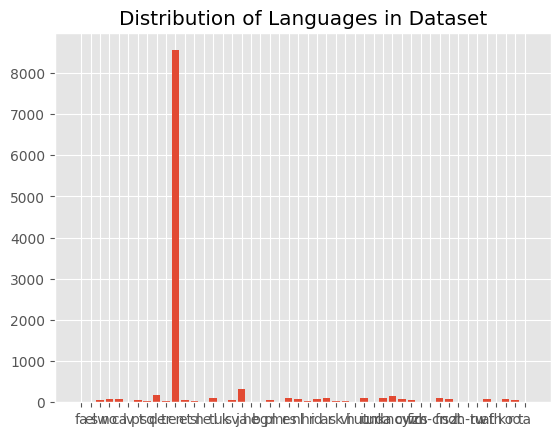

In [ ]:
users['language'] = languages
plt.bar(range(len(languages_dict)), list(languages_dict.values()), align='center')
plt.xticks(range(len(languages_dict)), list(languages_dict.keys()))
plt.title("Distribution of Languages in Dataset")
plt.show()

In [ ]:
en_users = users[users['language'] == 'en']

en_users['word_count'] = en_users['description'].apply(word_count)
en_users['word_count'].describe()

<ipython-input-28-f5e705d84784>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  en_users['word_count'] = en_users['description'].apply(word_count)


,word_count
count,8552.000000
mean,12.285898
std,8.838485
min,1.000000
25%,5.000000
50%,11.000000
75%,19.000000
max,126.000000


In [ ]:
WordCount_TargetClass (en_users, 'description')

In [ ]:
# Process the text
en_users['processed_description'] = en_users['description'].apply(process_text)
en_users.head()

<ipython-input-159-af40efaa606b>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,name,screen_name,location,profile_location,description,url,entities,followers_count,friends_count,...,translator_type,depression,profile_background_color_brightness,account_age,creation_year,language,word_count,processed_description,temp,cluster
3643,1057022347,Molly Wheeler,wheeler_molly,"Cleveland, OH",NaN,Is it Tribe time yet? —#BlueLivesMatter 💙—,NaN,{'description': {'urls': []}},0.000471,0.004931,...,none,0,0.106498,0.394208,2013,en,7,"[tribe, time, bluelivesmatter, blue_heart]",tribe time bluelivesmatter,31
1636,171999132,Angel of Music,ANGELofMUSICval,"Los Angeles, CA",NaN,Artistic wandering soul on a quest of self dis...,https://t.co/iWGz47jotC,{'url': {'urls': [{'url': 'https://t.co/iWGz47...,0.000255,0.016718,...,none,0,0.282984,0.632877,2010,en,14,"[artistic, wandering, soul, quest, self, disco...",artistic wandering soul quest self discovery c...,26
2992,2236408118,X,babbleqxeenjpg,wakefield // leeds,NaN,18 . aries . music . makeup . books . beauty...,NaN,{'description': {'urls': []}},0.005013,0.036608,...,none,1,1.000000,0.303298,2013,en,27,"[aries, music, makeup, book, beauty, fashion, ...",aries music makeup book beauty fashion youtube...,1
5502,434369401,Will,itzLilWill,,NaN,"Never rat on your friends, and always keep you...",NaN,{'description': {'urls': []}},0.000197,0.002477,...,none,1,0.842118,0.498525,2011,en,11,"[rat, friend, mouth, shut]",rat friend mouth shut,18
5812,24057360,R2-Dickhead,MsS3lena,Nebula to the Right,NaN,19. I'm a taurus baby so I don't give a fuck. ...,http://t.co/MQzmsaMaeZ,{'url': {'urls': [{'url': 'http://t.co/MQzmsaM...,0.000204,0.004260,...,none,1,0.221369,0.767498,2009,en,25,"[taurus, baby, fuck, just, stoned, soul, open,...",taurus baby fuck just stoned soul open minded ...,27


In [ ]:
text_1 = en_users['processed_description'].values
text = []
for x in text_1:
    text.append(' '.join(x))

text

['tribe time bluelivesmatter blue_heart',
 'artistic wandering soul quest self discovery currently searching muse',
 'aries music makeup book beauty fashion youtubers tweet seriously',
 'rat friend mouth shut',
 'taurus baby fuck just stoned soul open minded live life recklessly',
 'university south carolina',
 'im',
 'brand taco',
 'kiss bitch real able handle watchout co-owner porn site rockettube link bio',
 'pnn.io medium search rite.io beta lighter quicker deeper search ego wall pnn.io rite.io',
 'happily married screenwriter actor author rapper kingdomdreams',
 'unknown',
 'bitch',
 'set life seek fan flame ignite love ignite',
 'shut im princess otra',
 'slytherin working film major living art college',
 'unknown',
 'finding new way enjoy life :d',
 'unknown',
 'haley gallinot ma lcpc ncc clinical supervisor consultant including freelance writing ): question scheduling rate email haleygallinot.com',
 'missing action',
 'shit',
 'love band gaming arizona robbins enthusiast white_

In [ ]:
# Print most frequent bigrams

max_features = 2**12
df_bigram = vectorize(text, max_features, 2, 2, min_df=0.001, max_df=0.95)

df_bigram.head(60)

,frequency,bigrams
0,79.193308,mental health
1,61.345600,year old
2,53.696291,video game
3,32.023035,social medium
4,22.426222,red_heart red_heart
5,21.906737,love life
6,19.451863,live life
7,18.392345,star war
8,17.451671,depression anxiety
9,16.719879,mental illness


In [ ]:
# Print most frequent trigrams

df_trigram = vectorize(text, max_features, 3, 3, min_df=0.0005, max_df=0.90)  # trigrams

df_trigram

,frequency,trigrams
0,10.0,mental health advocate
1,8.0,live life fullest
2,7.0,play video game
3,5.0,year old girl
4,5.0,season ticket holder


In [ ]:
# Convert DataFrame to dictionary
bigrams = dict(zip(df_bigram["ngrams"], [1] * len(df_bigram)))
trigrams = dict(zip(df_trigram["ngrams"], [1] * len(df_trigram)))

# Merge all tokens in en_users['processed_description'] to one string
en_users['temp'] = en_users['processed_description'].apply(lambda x: ' '.join(x))

# If two consecutive words like mental and health are encountered in the text, then replace them with mental_health if they are in bigrams dictionary
def replace_bigrams(text):
    text = text.split()
    # for words in text check if word and next word are in bigrams dictionary, if yes then replace them with bigram
    for i in range(len(text)-1):
        if text[i] + ' ' + text[i+1] in bigrams:
            text[i] = text[i] + '_' + text[i+1]
            text[i+1] = ''
    # remove empty strings
    text = [x for x in text if x != '']
    return text

# Same as above but for trigrams
def replace_trigrams(text):
    text = text.split()
    for i in range(len(text)-2):
        if text[i] + ' ' + text[i+1] + ' ' + text[i+2] in trigrams:
            text[i] = text[i] + '_' + text[i+1] + '_' + text[i+2]
            text[i+1] = ''
            text[i+2] = ''
    text = [x for x in text if x != '']
    return text

en_users['temp'] = en_users['temp'].apply(lambda x: replace_trigrams(x))
en_users['temp'] = en_users['temp'].apply(lambda x: ' '.join(x))
en_users['temp'] = en_users['temp'].apply(lambda x: replace_bigrams(x))
en_users['temp'] = en_users['temp'].apply(lambda x: ' '.join(x))

<ipython-input-167-8fc5f62ed42b>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-167-8fc5f62ed42b>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-167-8fc5f62ed42b>:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-167-8

### Embeddings
Convert descriptions to numerical data: <br>
BERT: extracts different embeddings based on the context of the word, specifically Distilbert gives a nice balance between speed and performance <br>
Generate the BERT embeddings for a document using the 'sentence-transformers' package as the resulting embeddings have shown to be of high quality and typically work quite well for document-level embeddings.

In [ ]:
!pip install scikit-learn
!pip install sentence_transformers
!pip install umap-learn
!pip install hdbscan

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 582.6 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [ ]:
from sentence_transformers import SentenceTransformer

In [ ]:
model = SentenceTransformer('distilbert-base-nli-mean-tokens')

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.80k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/550 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/265M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/450 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

### Clustering
Cluster descriptions with similar topics together to enable finding topics within clusters <br>

In the end: <br>
Group users by cluster and count the proportion of depression (0 or 1). <br>
Compute the purity of each cluster as the largest class proportion. <br>
Compute the average purity across all clusters. <br>

<h4>Best Average Purity = 0.623 → Clusters are too mixed and may not be useful in the model</h4>

In [ ]:
from IPython.display import display
from tqdm import tqdm
from collections import Counter
import ast

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sb

from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

import umap
import plotly.express as px
%matplotlib inline

import hdbscan
from sklearn.cluster import KMeans

In [ ]:
def c_tf_idf(documents, m, ngram_range=(1, 1)):
    count = CountVectorizer(ngram_range=ngram_range, stop_words="english").fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)
    return tf_idf, count

def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic.Topic)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(df):
    topic_sizes = (df.groupby(['Topic'])
                     .temp
                     .count()
                     .reset_index()
                     .rename({"Topic": "Topic", "temp": "Size"}, axis='columns')
                     .sort_values("Size", ascending=False))
    return topic_sizes

#### Users Data

In [ ]:
descriptions = en_users['temp'].tolist()
embeddings = model.encode(descriptions, show_progress_bar=True)

Batches:   0%|          | 0/268 [00:00<?, ?it/s]

In [ ]:
embeddings.shape

(8552, 768)

In [ ]:
cluster = hdbscan.HDBSCAN(min_cluster_size=25,
                          metric='euclidean',
                          cluster_selection_method='eom').fit(embeddings)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
set(cluster.labels_)

{-1, 0, 1, 2, 3, 4}

In [ ]:
unique_labels, counts = np.unique(cluster.labels_, return_counts=True)
cluster_counts = dict(zip(unique_labels, counts))

cluster_counts

{-1: 7194, 0: 103, 1: 69, 2: 30, 3: 341, 4: 815}

In [ ]:
# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(n_neighbors=25, n_components=3, min_dist=0.0, metric='euclidean').fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = cluster.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)
result.loc[result['labels'] == -1, 'color'] = 'outlier'  # Mark outliers

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="HDBSCAN Clusters in 3D UMAP Projection",
                     opacity=0.8)

# Show the plot
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
kmeans = KMeans(n_clusters=25, random_state=42, n_init="auto").fit(embeddings)

In [ ]:
# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(
    n_neighbors=25,  # Slightly lower than before to emphasize local structure
    n_components=3,  # Still 3D for visualization
    min_dist=0.1,  # Prevents points from being too close together
    metric='euclidean'  # Better for KMeans compared to 'cosine'
).fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = kmeans.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)
result.loc[result['labels'] == -1, 'color'] = 'outlier'  # Mark outliers

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="Kmeans Clusters in 3D UMAP Projection",
                     opacity=1)

fig.update_traces(marker=dict(size=3))
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
docs_df = pd.DataFrame(en_users, columns=["temp"])
docs_df['Topic'] = kmeans.labels_
docs_df['Doc_ID'] = range(len(docs_df))
docs_per_topic = docs_df.groupby(['Topic'], as_index = False).agg({'temp': ' '.join})

tf_idf, count = c_tf_idf(docs_per_topic.temp.values, m=len(en_users))

In [ ]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20)
topic_sizes = extract_topic_sizes(docs_df)
topic_sizes.head(10)

,Topic,Size
6,6,1200
11,11,417
5,5,411
22,22,402
14,14,377
4,4,356
24,24,355
19,19,351
21,21,346
1,1,345


In [ ]:
top_n_words[topic_sizes.iloc[0].Topic][:20]

[('unknown', 1.9330936146998157),
 ('inactive', 0.01230492981862939),
 ('worthless', 0.01230492981862939),
 ('soberly', 0.007482578886532959),
 ('nope', 0.007482578886532959),
 ('unbothered', 0.007482578886532959),
 ('nothin', 0.007482578886532959),
 ('emotionless', 0.0069097299769792855),
 ('hidden', 0.0069097299769792855),
 ('thing', 0.0063909663584531),
 ('stranger', 0.006336881067425612),
 ('quiet', 0.006001785936757707),
 ('missing', 0.005874388680702122),
 ('extremely', 0.005666690806089803),
 ('action', 0.005666690806089803),
 ('emotional', 0.005500847256121083),
 ('non', 0.005301539771148448),
 ('interesting', 0.005049158242593753),
 ('special', 0.005006767090207347),
 ('dont', 0.004283239208096686)]

In [ ]:
top_n_words[topic_sizes.iloc[1].Topic][:20]

[('video_game', 0.033872158192254184),
 ('game', 0.032462359847406835),
 ('anime', 0.024344769065573042),
 ('music', 0.024096522043246898),
 ('gamer', 0.022887714716302878),
 ('snapchat', 0.02242007316732713),
 ('fan', 0.02134924277277887),
 ('nerd', 0.019790374411753887),
 ('love', 0.01923586173229753),
 ('tv', 0.018807622546159825),
 ('life', 0.01794196551300904),
 ('play', 0.017876521915915832),
 ('gaming', 0.015937368668501324),
 ('live', 0.015822888677062278),
 ('star', 0.015300195968596863),
 ('ig', 0.015183943257390722),
 ('wrestling', 0.015098586609910753),
 ('football', 0.0147989851921798),
 ('movie', 0.014485877315403147),
 ('stuff', 0.013298566667656261)]

In [ ]:
top_n_words[topic_sizes.iloc[2].Topic][:20]

[('snapchat', 0.04352416930970141),
 ('ig', 0.02774272384515138),
 ('sc', 0.023724911752951335),
 ('insta', 0.020114498271822462),
 ('life', 0.018908150030515603),
 ('university', 0.01820426108972091),
 ('account', 0.01712702301792002),
 ('follow', 0.016301735088649686),
 ('day', 0.015576797132753423),
 ('know', 0.015543193163247166),
 ('quote', 0.013989287031882342),
 ('main', 0.01340425178147784),
 ('aries', 0.012947730818576676),
 ('run', 0.012608693066461413),
 ('live', 0.012286812457911678),
 ('blacklivesmatter', 0.01187852914494984),
 ('airplane', 0.011279128176340655),
 ('state_university', 0.011226031525957492),
 ('fm', 0.011067551014144514),
 ('followed', 0.010705103422529321)]

In [ ]:
top_n_words[topic_sizes.iloc[3].Topic][:20]

[('hate', 0.024694662792375748),
 ('just', 0.017945885890554316),
 ('anti', 0.01648586695480705),
 ('life', 0.01602990965168665),
 ('bad', 0.015940355336884874),
 ('thing', 0.015741195262570902),
 ('love', 0.014719232228384314),
 ('lot', 0.014497404126103099),
 ('geek', 0.01449518899998558),
 ('black', 0.013723638071475737),
 ('people', 0.013392503881350513),
 ('tweet', 0.01327494974043384),
 ('shit', 0.013268693625505545),
 ('dead', 0.013171208495598177),
 ('fuck', 0.013120097578972693),
 ('god', 0.012293402085161921),
 ('post', 0.012215537574409017),
 ('depression', 0.011894677510648492),
 ('time', 0.011808516496135917),
 ('man', 0.011517144566191984)]

In [ ]:
#en_users.drop('cluster', axis=1)
en_users['cluster'] = kmeans.labels_

<ipython-input-179-9ce2ad9872ee>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
en_users

,id,name,screen_name,location,profile_location,description,url,entities,followers_count,friends_count,...,translator_type,depression,profile_background_color_brightness,account_age,creation_year,language,word_count,processed_description,temp,cluster
3643,1057022347,Molly Wheeler,wheeler_molly,"Cleveland, OH",NaN,Is it Tribe time yet? —#BlueLivesMatter 💙—,NaN,{'description': {'urls': []}},0.000471,0.004931,...,none,0,0.106498,0.394208,2013,en,7,"[tribe, time, bluelivesmatter]",tribe time bluelivesmatter,3
1636,171999132,Angel of Music,ANGELofMUSICval,"Los Angeles, CA",NaN,Artistic wandering soul on a quest of self dis...,https://t.co/iWGz47jotC,{'url': {'urls': [{'url': 'https://t.co/iWGz47...,0.000255,0.016718,...,none,0,0.282984,0.632877,2010,en,14,"[artistic, wandering, soul, quest, self, disco...",artistic wandering soul quest self discovery c...,10
2992,2236408118,X,babbleqxeenjpg,wakefield // leeds,NaN,18 . aries . music . makeup . books . beauty...,NaN,{'description': {'urls': []}},0.005013,0.036608,...,none,1,1.000000,0.303298,2013,en,27,"[aries, music, makeup, book, beauty, fashion, ...",aries music makeup book beauty fashion youtube...,1
5502,434369401,Will,itzLilWill,,NaN,"Never rat on your friends, and always keep you...",NaN,{'description': {'urls': []}},0.000197,0.002477,...,none,1,0.842118,0.498525,2011,en,11,"[rat, friend, mouth, shut]",rat friend mouth shut,2
5812,24057360,R2-Dickhead,MsS3lena,Nebula to the Right,NaN,19. I'm a taurus baby so I don't give a fuck. ...,http://t.co/MQzmsaMaeZ,{'url': {'urls': [{'url': 'http://t.co/MQzmsaM...,0.000204,0.004260,...,none,1,0.221369,0.767498,2009,en,25,"[taurus, baby, fuck, just, stoned, soul, open,...",taurus baby fuck just stoned soul open minded ...,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,84540710,alex,i_am_alexander_,"Hamilton, Ontario","{'id': '4939b600461c30a4', 'url': 'https://api...",no one wants to fall out of heaven / 19 / '97,https://t.co/XfcEC06Grp,{'url': {'urls': [{'url': 'https://t.co/XfcEC0...,0.000269,0.005799,...,none,0,0.313655,0.707428,2009,en,12,"[want, fall, heaven]",want fall heaven,2
5734,322279406,rae fLe❌❌urd,zackry_3,"Johnstown, OH",NaN,"⛳️, |20| too busy making my own waves. #tOSUBu...",NaN,{'description': {'urls': []}},0.000933,0.003038,...,none,1,0.486122,0.544382,2011,en,16,"[busy, making, wave, tosubuckeyes, steelernati...",busy making wave tosubuckeyes steelernation ca...,7
5191,1895493180,em + ziall,anselftzarry,,NaN,*:・✧ grow as a person ✧・:*,https://t.co/jaxYBoKHPR,{'url': {'urls': [{'url': 'https://t.co/jaxYBo...,0.007947,0.041326,...,none,1,0.842118,0.323679,2013,en,6,"[grow, person]",grow person,5
5390,2317448645,Gemini ♊1,lovelytaexo,,NaN,"Taehana , Mother of Jai'Dyn King, 21 yrs old ...",NaN,{'description': {'urls': []}},0.000643,0.006225,...,none,1,0.842118,0.288549,2014,en,21,"[taehana, mother, king, yr, old, future, model...",taehana mother king yr_old future model hard w...,18


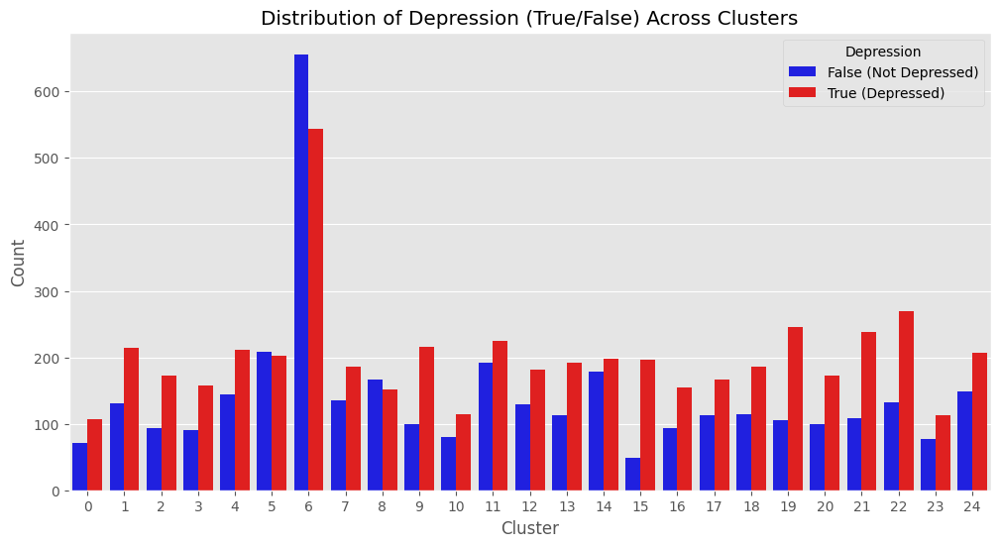

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=en_users, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[6].Topic][:20]

[('twitter', 0.0786491507838658),
 ('tweet', 0.07800338739515862),
 ('instagram', 0.07648799254001713),
 ('com', 0.04394155563589034),
 ('youtube', 0.039159450808932655),
 ('follow', 0.03679326989076918),
 ('bot', 0.03457869176187792),
 ('account', 0.03377200596401578),
 ('video', 0.031653033176964135),
 ('youtuber', 0.028291656896081936),
 ('email', 0.0274120367141865),
 ('facebook', 0.026276453254910893),
 ('free', 0.025262326360171623),
 ('snapchat', 0.024717125045188318),
 ('blogger', 0.02365608624999831),
 ('contact', 0.022740436759867554),
 ('online', 0.02195326817176024),
 ('twitch', 0.019458377629970755),
 ('news', 0.01794090787346822),
 ('community', 0.016587128796936166)]

In [ ]:
purity = []

for n in range(15, 16):
    kmeans = KMeans(n_clusters=n, random_state=42, n_init="auto").fit(embeddings)

    en_users.drop('cluster', axis=1)
    en_users['cluster'] = kmeans.labels_

    # Count the proportion of depressed vs. not depressed in each cluster
    cluster_distribution = en_users.groupby('cluster')['depression'].value_counts(normalize=True).unstack()

    # Compute purity as the max class proportion per cluster
    cluster_distribution['purity'] = cluster_distribution.max(axis=1)

    # Compute the overall average purity
    average_purity = cluster_distribution['purity'].mean()
    purity.append(average_purity)

    # Display cluster purity
    print(f'{n}: {average_purity}')

15: 0.6124811367814865


<ipython-input-194-4dc0bf121daf>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
max(purity)

0.6231790048633375

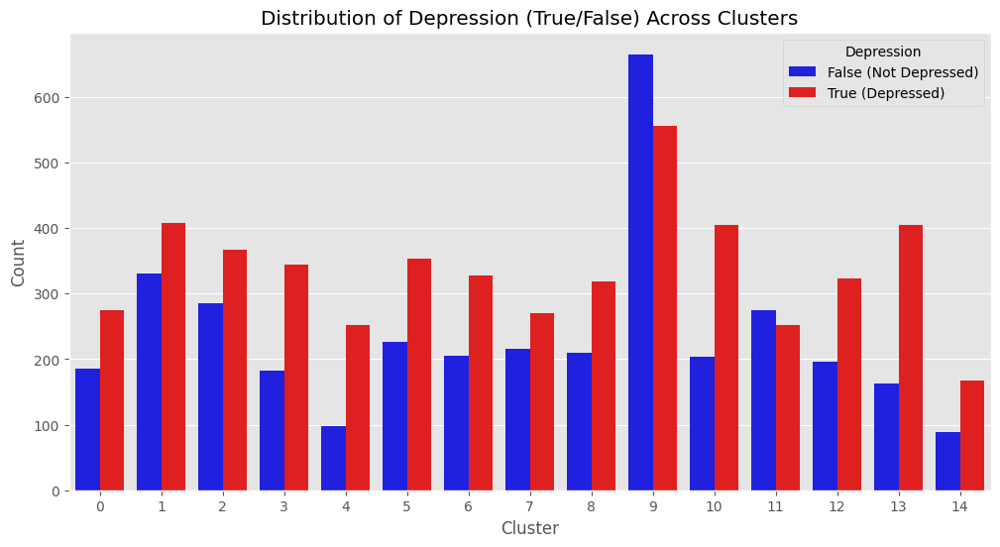

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=en_users, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[9].Topic][:20], top_n_words[topic_sizes.iloc[3].Topic][:20], top_n_words[topic_sizes.iloc[6].Topic][:20]

([('writer', 0.04640250364828519),
  ('student', 0.02883767930536069),
  ('artist', 0.026240951576381816),
  ('news', 0.025807049422508867),
  ('music', 0.025140021344626427),
  ('journalist', 0.024392155945317733),
  ('author', 0.024379691765809054),
  ('radio', 0.021900377809403144),
  ('editor', 0.02157993231113906),
  ('com', 0.021207816327734497),
  ('art', 0.020620392809451493),
  ('manager', 0.020548549918545427),
  ('founder', 0.02027712601829239),
  ('marketing', 0.01928487245600138),
  ('web', 0.01928487245600138),
  ('blog', 0.01926661502526762),
  ('medium', 0.019175926393726582),
  ('view', 0.019041244683942582),
  ('owner', 0.01816203718734224),
  ('ex', 0.017887581026566336)],
 [('hate', 0.024694662792375748),
  ('just', 0.017945885890554316),
  ('anti', 0.01648586695480705),
  ('life', 0.01602990965168665),
  ('bad', 0.015940355336884874),
  ('thing', 0.015741195262570902),
  ('love', 0.014719232228384314),
  ('lot', 0.014497404126103099),
  ('geek', 0.01449518899998558

#### Timeline Data

In [ ]:
embeddings = model.encode(df_final['temp'].tolist(), show_progress_bar=True)

embeddings.shape

Batches:   0%|          | 0/102 [00:00<?, ?it/s]

(3246, 768)

In [ ]:
kmeans = KMeans(n_clusters=25, random_state=42, n_init="auto").fit(embeddings)
df_final['cluster'] = kmeans.labels_

# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(
    n_neighbors=25,  # Slightly lower than before to emphasize local structure
    n_components=3,  # Still 3D for visualization
    min_dist=0.1,  # Prevents points from being too close together
    metric='euclidean'  # Better for KMeans compared to 'cosine'
).fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = kmeans.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="Kmeans Clusters in 3D UMAP Projection",
                     opacity=1)

fig.update_traces(marker=dict(size=3))
fig.show()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
docs_df = pd.DataFrame(df_final, columns=["temp"])
docs_df['Topic'] = kmeans.labels_
docs_df['Doc_ID'] = range(len(docs_df))
docs_per_topic = docs_df.groupby(['Topic'], as_index = False).agg({'temp': ' '.join})

tf_idf, count = c_tf_idf(docs_per_topic.temp.values, m=len(df_final))

In [ ]:
top_n_words = extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20)
topic_sizes = extract_topic_sizes(docs_df)
topic_sizes.head(10)

,Topic,Size
6,6,228
2,2,226
11,11,218
16,16,198
14,14,190
17,17,188
15,15,185
10,10,184
4,4,182
3,3,176


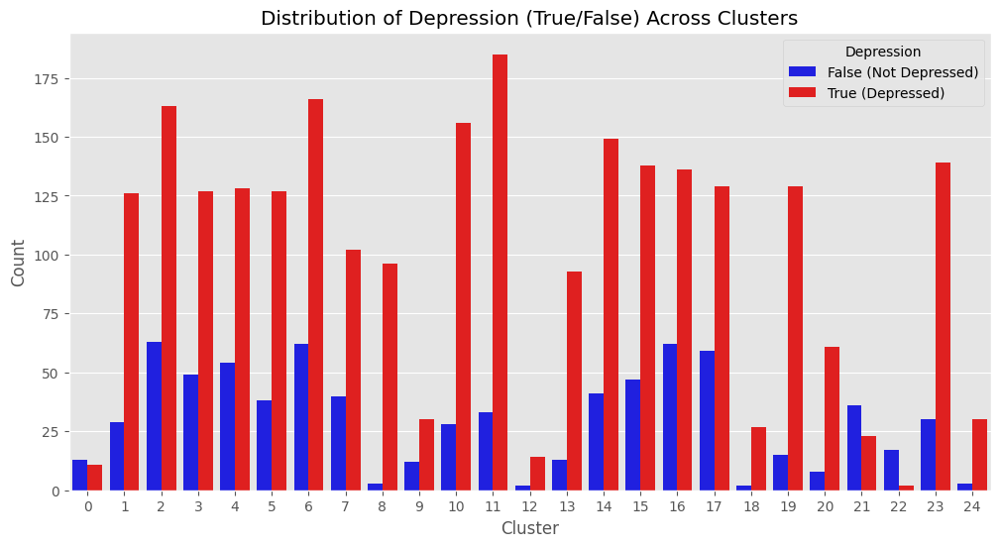

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=df_final, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[19].Topic][:40]

[('miself', np.float64(0.13733808678912077)),
 ('etsy', np.float64(0.1007532097044446)),
 ('harma', np.float64(0.09622402920936132)),
 ('paradise', np.float64(0.09217825914094237)),
 ('really_awesome', np.float64(0.07386102111054445)),
 ('island', np.float64(0.07269210488645658)),
 ('bolero', np.float64(0.07195428487530112)),
 ('listing', np.float64(0.06733720856239808)),
 ('lot_follow', np.float64(0.05813315453903297)),
 ('sandy', np.float64(0.05397168245714499)),
 ('check_item', np.float64(0.04964921352841551)),
 ('honor', np.float64(0.047745794955505044)),
 ('bridal', np.float64(0.04752516074520594)),
 ('achievement', np.float64(0.043949519856499863)),
 ('cap', np.float64(0.043081445816526384)),
 ('mini', np.float64(0.040588387513272005)),
 ('score', np.float64(0.04016933661057104)),
 ('babe_love', np.float64(0.03536353495363248)),
 ('ive_just', np.float64(0.03093530199494656)),
 ('harmrug', np.float64(0.025545060586217184))]

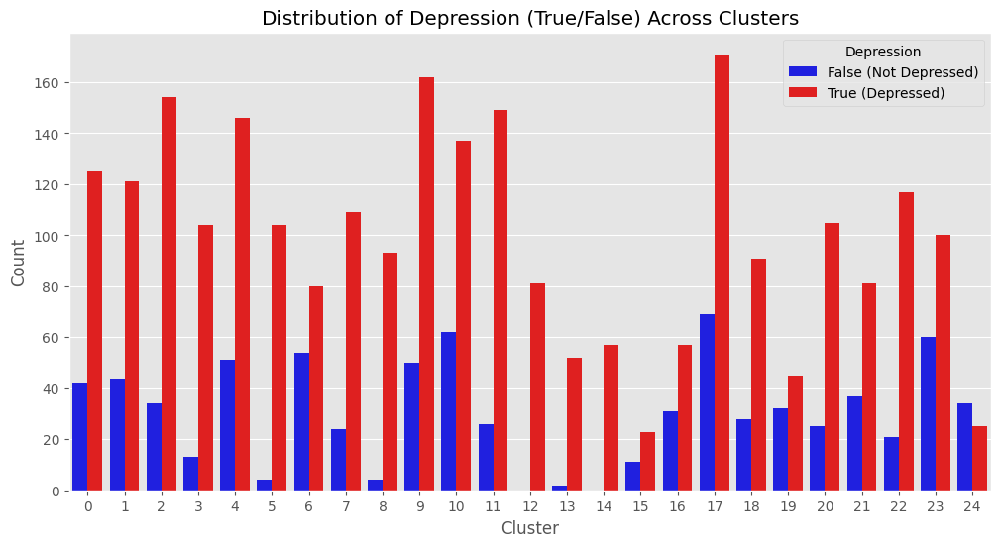

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=df_final, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[0].Topic][:20]

[('ik', 0.0014885468599116066),
 ('connie', 0.0014864297262921493),
 ('red', 0.0012383190590905177),
 ('follow_thanks', 0.001110855541508263),
 ('yall', 0.0011065911205611566),
 ('niall_love', 0.0010901416216581546),
 ('blessup', 0.0010789299919699647),
 ('fuckin', 0.0010061342567300878),
 ('yuo', 0.0009993888099396856),
 ('mate', 0.0009809012181083222),
 ('mm', 0.0009749431758572374),
 ('niet', 0.000922212403606515),
 ('blackoutday', 0.0008700161860950706),
 ('tyler', 0.0008431709663435791),
 ('vine', 0.0008307637211590664),
 ('aint', 0.0008271750025623302),
 ('casualty', 0.0008265404085624767),
 ('je', 0.0007915089655452149),
 ('error', 0.0007841785976456559),
 ('het', 0.0007627056667458067)]

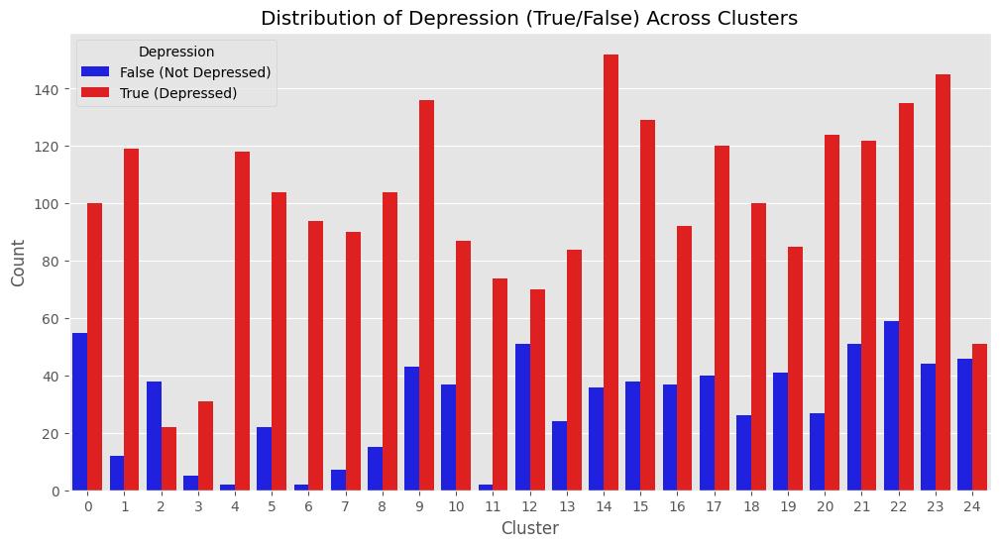

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Create the bar plot
sns.countplot(data=df_final, x='cluster', hue='depression', palette=['blue', 'red'])

# Customize labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Distribution of Depression (True/False) Across Clusters')

# Show the legend
plt.legend(title='Depression', labels=['False (Not Depressed)', 'True (Depressed)'])

# Show the plot
plt.show()

In [ ]:
top_n_words[topic_sizes.iloc[5].Topic][:20]

[('undateablelive', 0.0078798727725969),
 ('jsquad', 0.004659250408060809),
 ('rt_liked_video', 0.0038279009223551853),
 ('imtherealcalumhoodfollowparty', 0.0031591037331046784),
 ('reiki', 0.0031337350480476387),
 ('nbc', 0.0029617617832157564),
 ('camerondallas', 0.0027250976593891124),
 ('entertainer', 0.002698075420547354),
 ('stream', 0.0024879010796530396),
 ('autism', 0.0023220370449942834),
 ('pokémon', 0.0021735717468010438),
 ('streamys', 0.0021098227006032975),
 ('sitcom', 0.002094357311658377),
 ('rt_spread_word', 0.0019991592520375414),
 ('twitch', 0.0019413078247588705),
 ('weezer', 0.001876798322744142),
 ('hgss', 0.0017464562446633924),
 ('wedlink', 0.0017135224895820644),
 ('pretzelgate', 0.0016531681397941207),
 ('grinning_face', 0.0016490234708684411)]

In [ ]:
top_n_words[topic_sizes.iloc[10].Topic][:20]

[('cameron', 0.003129070103381413),
 ('teambts', 0.0029380363137686324),
 ('camsfollowingspree', 0.002893219914001115),
 ('hundred_points', 0.0025316311578734286),
 ('purple_heart', 0.0025108998768432612),
 ('matttomill', 0.0024302225480814193),
 ('tweetmecarter', 0.002329593330656024),
 ('loudly_crying_face_sparkling_heart', 0.002252456026295068),
 ('clapping_hands_medium', 0.0022356822031227774),
 ('loudly_crying_face_folded_hands', 0.0020475069401535554),
 ('money_with_wings', 0.0020464436318790406),
 ('callmesierra', 0.0019199039669332274),
 ('flexed_biceps_medium', 0.0019132197939924487),
 ('omfg', 0.001821920931925935),
 ('dark_skin_tone', 0.0018068805584887393),
 ('friend_want', 0.0017957442966707164),
 ('softly', 0.0017260191169254247),
 ('oovoo', 0.001699543709349071),
 ('ye', 0.0015812517308153474),
 ('raising_hands', 0.0014913498294079606)]

In [ ]:
top_n_words[topic_sizes.iloc[13].Topic][:20]

[('wrapped_gift', 0.007528239464832325),
 ('mind_following', 0.00637481995942114),
 ('birthday_coming', 0.006341147303139148),
 ('birthday_present', 0.006028200930017477),
 ('advanced', 0.005882709635491244),
 ('crescent_moon', 0.0058536124184522505),
 ('cloud', 0.004956304802611087),
 ('wrapped_gift_wrapped_gift', 0.004259790090898037),
 ('happy_birthday', 0.0033315234522557037),
 ('grinning_face_with_big_eyes', 0.003089403447192431),
 ('ino', 0.002928871291968734),
 ('grinning_face_with_smiling_eyes', 0.0023431195510699933),
 ('aga', 0.0022984147367171312),
 ('amazingupdatersfacetime', 0.0021097395580400666),
 ('christmasnjuly', 0.00199131013684474),
 ('teamclc', 0.0017948932720620338),
 ('grinning_squinting_face', 0.0017712865907219995),
 ('gemini', 0.0017077305709039267),
 ('slightly_smiling_face', 0.0015858917756657355),
 ('stile', 0.0015034380287519476)]

In [ ]:
top_n_words[topic_sizes.iloc[16].Topic][:20]

[('followback', 0.009431167101004173),
 ('foto', 0.008087805621195923),
 ('teamfollowback', 0.00676617461838071),
 ('bellletstalk_rt', 0.005691539084916616),
 ('bellletstalk', 0.004036426808141798),
 ('fotoset', 0.003221130261432477),
 ('nowimstronger', 0.0027919244394519495),
 ('cialis', 0.0024961159264552924),
 ('london', 0.002315946192148976),
 ('nitrogen', 0.002060001914544888),
 ('beiiietstaik', 0.002047343741714795),
 ('camera', 0.001875281767795773),
 ('la_vega', 0.0018385878985822347),
 ('canada', 0.0018091549114397766),
 ('bell_letstalk', 0.0017424466693797193),
 ('viagra', 0.0015966374757947826),
 ('initiative', 0.001533696902632289),
 ('startup', 0.0013318420223806253),
 ('marketing', 0.0012790443661312803),
 ('canadian', 0.0012744459623254781)]

In [ ]:
top_n_words[topic_sizes.iloc[18].Topic][:20]

[('sheskindahotvma_rt', 0.004677269869657681),
 ('love_new_song', 0.004129786964190497),
 ('dnz', 0.00347032062041014),
 ('limitless', 0.003398310563233932),
 ('rt_real_love', 0.003358370373683182),
 ('loving', 0.0033195287139059083),
 ('nct', 0.0031585128853126687),
 ('jaehyun', 0.0030955884597170698),
 ('asklube', 0.003053553111210535),
 ('true_love', 0.0030102643660980324),
 ('love_smiling_face_with_smiling_eyes', 0.002919554127784254),
 ('new_song', 0.002909974386063285),
 ('fails', 0.0028239365229057946),
 ('sheskindahotvma', 0.0024737217639652143),
 ('giving', 0.0024592033019235674),
 ('michael', 0.0023098949215761564),
 ('dmmetriz', 0.002243587556842853),
 ('jai', 0.0022382315761071904),
 ('amazing_follow', 0.0021819228387121204),
 ('mnwild', 0.002181178568245191)]

In [ ]:
purity = []

for n in range(15, 16):
    kmeans = KMeans(n_clusters=n, random_state=42, n_init="auto").fit(embeddings)

    en_users.drop('cluster', axis=1)
    en_users['cluster'] = kmeans.labels_

    # Count the proportion of depressed vs. not depressed in each cluster
    cluster_distribution = en_users.groupby('cluster')['depression'].value_counts(normalize=True).unstack()

    # Compute purity as the max class proportion per cluster
    cluster_distribution['purity'] = cluster_distribution.max(axis=1)

    # Compute the overall average purity
    average_purity = cluster_distribution['purity'].mean()
    purity.append(average_purity)

    # Display cluster purity
    print(f'{n}: {average_purity}')

In [ ]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.8 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-9uipqy7m
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-9uipqy7m
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=b0a0b81a614d45d90cbc9152fa742874d6618272e8e6aeeff3dbbe7abd9c7a43
  Stored in directory: /tmp/pip-ephem-wheel-cache-0v02ty3k/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip


In [ ]:
import torch
import clip

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 64.5MiB/s]


In [ ]:
text = clip.tokenize(text).to(device)

with torch.no_grad():
    text_features = model.encode_text(text)

# text_features /= text_features.norm(dim=-1, keepdim=True)

AttributeError: 'list' object has no attribute 'to'

In [ ]:
kmeans = KMeans(n_clusters=25, random_state=42, n_init="auto").fit(text_features)
df_final['cluster_CLIP'] = kmeans.labels_

# Perform UMAP for dimensionality reduction to 3D
umap_data = umap.UMAP(
    n_neighbors=25,  # Slightly lower than before to emphasize local structure
    n_components=3,  # Still 3D for visualization
    min_dist=0.1,  # Prevents points from being too close together
    metric='euclidean'  # Better for KMeans compared to 'cosine'
).fit_transform(embeddings)

# Create a DataFrame
result = pd.DataFrame(umap_data, columns=['x', 'y', 'z'])
result['labels'] = kmeans.labels_

# Define colors: gray for outliers, colormap for clusters
result['color'] = result['labels'].astype(str)

# Create an interactive 3D scatter plot
fig = px.scatter_3d(result, x='x', y='y', z='z', color='color',
                     color_discrete_sequence=px.colors.qualitative.Set1,  # Nice categorical colors
                     title="Kmeans Clusters in 3D UMAP Projection",
                     opacity=1)

fig.update_traces(marker=dict(size=3))
fig.show()

# BERT and its Variants for Text Classification

In [ ]:
from sklearn import model_selection
from sklearn import metrics
from torch.optim import AdamW
from transformers import get_linear_schedule_with_warmup
from transformers import AutoTokenizer
from transformers import AutoModel
from tqdm import tqdm
from re import sub
import torch.nn as nn
import torch
from sklearn.model_selection import train_test_split

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_unstructured_data.csv"
df_final = pd.read_csv(save_path)

In [ ]:
df_final.rename(columns={"depression": "target"}, inplace=True)

In [ ]:
# Assuming df is your DataFrame and 'target' is your binary column
df, test_data = train_test_split(df_final, test_size=0.2, stratify=df_final['target'], random_state=42)

In [ ]:
# Checking class distribution
print(df['target'].value_counts(normalize=True))  # Should be similar in both
print(test_data['target'].value_counts(normalize=True))

target
True     0.619696
False    0.380304
Name: proportion, dtype: float64
target
True     0.619696
False    0.380304
Name: proportion, dtype: float64


In [ ]:
# Find max and min word counts
max_words = df_final['word_count'].max()
min_words = df_final['word_count'].min()

max_words, min_words

(113, 1)

In [ ]:
class config:
    BERT_PATH = "vinai/bertweet-base"
    # this is the maximum number of tokens in the sentence
    MAX_LEN = 128
    # batch sizes is small because model is huge!
    TRAIN_BATCH_SIZE = 16
    VALID_BATCH_SIZE = 8
    EPOCHS = 5
    # this is where you want to save the model
    MODEL_PATH = '/content/drive/MyDrive/MentalHealthProject/model.bin'

In [ ]:
def sample(df):
    """
    return sample view of dataframe
    """
    sample_df = df.sample(1)
    for row , col in zip(sample_df.values[0], sample_df.columns):
        print(f'--{col}--\n\n{row}\n')

def clean_whitespace(text):
    """
    clean white space in text
    """
    if not text:
        return
    return " ".join(text.split())

def clean_data(text, add_keyword=None):
    """
    to clean tweets and keywords,
    solve formatting issue,
    remove hastags, usernames and links
    """
    # remove links
    text = sub(r'http\S+', '', text)
    # remove username
    text = sub(r'@\S+', '', text)
    text = text.replace('#', '')
    return clean_whitespace(text)

def get_data(df, test_data):
    """
    read and return data frame
    """
    df["contents"] = ''
    df["contents"] = df.text.apply(lambda x:clean_data(x))
    if test_data:
        return df
    df.rename(columns={'target': "targets"}, inplace=True)
    return df

In [ ]:
df = get_data(df, test_data=None)
test_data = get_data(test_data, test_data=True)

In [ ]:
TOKENIZER = AutoTokenizer.from_pretrained(config.BERT_PATH, do_lower_case=True)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/558 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/843k [00:00<?, ?B/s]

bpe.codes:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

emoji is not installed, thus not converting emoticons or emojis into text. Install emoji: pip3 install emoji==0.6.0


In [ ]:
class DatasetTransformer:
    """
    :param content: list or numpy array of strings
    :param targets: list or numpy array which is binary
    """
    def __init__(self, contents, targets, test_data=None):
        self.contents = contents
        self.targets = targets
        self.tokenizer = TOKENIZER
        self.max_len = config.MAX_LEN
        self.test_data = test_data

    def __len__(self):
        return len(self.contents)

    def __getitem__(self, index):
        """
        for a given item index, return a dictionary
        of inputs.
        """
        content = str(self.contents[index])
        inputs = self.tokenizer.encode_plus(
            content,
            padding='max_length',
            max_length=self.max_len,
            truncation=True,
        )
        ids = inputs["input_ids"]
        mask = inputs["attention_mask"]
        token_type_ids = inputs["token_type_ids"]
        if self.test_data:
            return {
                "ids": torch.tensor(ids, dtype=torch.long),
                "mask": torch.tensor(mask, dtype=torch.long),
                "token_type_ids": torch.tensor(token_type_ids, dtype=torch.long)
            }
        target = self.targets[index]
        return {
            "ids": torch.tensor(ids, dtype=torch.long),
            "mask": torch.tensor(mask, dtype=torch.long),
            "token_type_ids": torch.tensor(token_type_ids, dtype=torch.long),
            "target": torch.tensor(target, dtype=torch.float),

        }

In [ ]:
# Example
DatasetTransformer(df.contents, df.targets)[0]

{'ids': tensor([  0,   8,  70, 143,  51, 141,  33,   2,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1]),
 'mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0

In [ ]:
class BERTweet(nn.Module):
    def __init__(self):
        super(BERTweet, self).__init__()
        self.bert = AutoModel.from_pretrained(config.BERT_PATH)
        # add a dropout for regularization
        self.bert_drop = nn.Dropout(0.3)
        # hidden size can be 768 or 1024 depending
        # on the transfomer model we are using
        # in our case, it is 768
        self.out = nn.Linear(768, 1)

    def forward(self, ids, mask, token_type_ids):
        """
        bert will return 2 dicts with keys
        'pooler_output' and 'last_hidden_state'
        we need pooler_output with size torch.Size([batch size, hidden_size])
        """
        bert_output = self.bert(
            ids,
            attention_mask=mask,
            token_type_ids=token_type_ids
        )
        reguralized_output = self.bert_drop(bert_output["pooler_output"])
        output = self.out(reguralized_output)
        return output

In [ ]:
def train_model(data_loader, model, optimizer, epoch, device, scheduler):
    """
    This is the main training function that trains model
    for one epoch
    :param data_loader: this is the torch dataloader
    :param model: transformer- model
    :param optimizer: torch optimizer, e.g. adam, sgd, etc.
    :param device: this can be "cuda" or "cpu"
    :param scheduler: learning rate scheduler
    """
    # set model to training mode
    model.train()
    # go through batches of data in data loader
    print(f'training for epoch {epoch}')
    for data in tqdm(data_loader):
        # extract ids, token type ids and mask
        # from current batch
        # also extract targets
        ids = data["ids"]
        token_type_ids = data["token_type_ids"]
        mask = data["mask"]
        targets = data["target"]
        # move everything to specified device
        ids = ids.to(device, dtype=torch.long)
        token_type_ids = token_type_ids.to(device, dtype=torch.long)
        mask = mask.to(device, dtype=torch.long)
        targets = targets.to(device, dtype=torch.float)
        optimizer.zero_grad()
        # pass through the model
        predictions = model(
            ids=ids,
            mask=mask,
            token_type_ids=token_type_ids
        )
        # calculate the loss
        loss = nn.BCEWithLogitsLoss()(
            predictions,
            targets.view(-1, 1)
        )
        # compute gradient of loss w.r.t.
        # all parameters of the model that are trainable
        loss.backward()
        # single optimization step
        optimizer.step()
        # step scheduler
        scheduler.step()
    print(f'training loss for epoch {epoch} {loss}')


def evaluate(data_loader, model, device):
    """
    validation loop
    """
    # initialize empty lists to store predictions
    # and targets
    final_predictions = []
    final_targets = []
    # put the model in eval mode
    model.eval()
    # disable gradient calculation
    with torch.no_grad():
        for data in data_loader:
            ids = data["ids"]
            token_type_ids = data["token_type_ids"]
            mask = data["mask"]
            targets = data["target"]
            ids = ids.to(device, dtype=torch.long)
            token_type_ids = token_type_ids.to(device, dtype=torch.long)
            mask = mask.to(device, dtype=torch.long)
            targets = targets.to(device, dtype=torch.float)
            # make predictions
            outputs = model(
                ids=ids,
                mask=mask,
                token_type_ids=token_type_ids
            )
            # move predictions and targets to list
            # we need to move predictions and targets to cpu too
            targets = targets.cpu().detach()
            targets = targets.numpy().tolist()
            final_targets.extend(targets)
            # convert outputs to cpu and extend the final list
            outputs = torch.sigmoid(outputs).cpu().detach()
            outputs = outputs.numpy().tolist()
            final_predictions.extend(outputs)
    return final_predictions, final_targets

In [ ]:
def get_optimizer_param(model):
    """
    return optimizer paramters after applying
    weight decay to all parameters other
    than bias and layer normalization terms:
    """
    param_optimizer = list(model.named_parameters())
    no_decay = ["bias", "LayerNorm.weight"]
    optimizer_parameters = [
        {
            "params": [
                p for n, p in param_optimizer if not any(nd in n for nd in no_decay) # noqa
                ],
            "weight_decay": 0.001,
        },
        {
            "params": [
                p for n, p in param_optimizer if any(nd in n for nd in no_decay)], # noqa
            "weight_decay": 0.0,
        },
    ]
    return optimizer_parameters


def get_scheduler(optimizer, num_train_steps):
    """
    return learning rate scheduler based on the
    optimizer and training steps.

    """
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_train_steps
    )
    return scheduler

In [ ]:
def run(data_df):
    df_train, df_valid = model_selection.train_test_split(
        data_df,
        test_size=0.1,
        random_state=42,
    )
    # reset index
    df_train = df_train.reset_index(drop=True)
    df_valid = df_valid.reset_index(drop=True)
    # Initialize training and validation dataset
    train_dataset = DatasetTransformer(
        df_train.contents.values,
        df_train.targets.values
    )
    valid_dataset = DatasetTransformer(
        df_valid.contents.values,
        df_valid.targets.values
    )
    # create training and validation dataloader
    train_data_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=config.TRAIN_BATCH_SIZE,
        num_workers=1
    )
    valid_data_loader = torch.utils.data.DataLoader(
        valid_dataset,
        batch_size=config.VALID_BATCH_SIZE,
        num_workers=1
    )
    availble_device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f'Training in device {availble_device}')
    device = torch.device(availble_device)
    model = BERTweet()
    # send model to device
    model.to(device)
    optimizer_parameters = get_optimizer_param(model)
    optimizer = AdamW(optimizer_parameters, lr=3e-5)
    num_train_steps = int(
        len(df_train) / config.TRAIN_BATCH_SIZE * config.EPOCHS
    )
    scheduler = get_scheduler(optimizer, num_train_steps)
    best_accuracy = 0
    print(f'Total no of epochs = {config.EPOCHS}')
    for epoch in range(config.EPOCHS):
        # train one epoch
        train_model(
            train_data_loader, model, optimizer, epoch,
            device, scheduler
        )
        # validate
        outputs, targets = evaluate(
            valid_data_loader,
            model,
            device
        )
        outputs = np.array(outputs) >= 0.5
        accuracy = metrics.accuracy_score(targets, outputs)
        print(
            f"\n epoch:{epoch} | Validation Accuracy Score = {accuracy}."
        )
        if accuracy > best_accuracy:
            torch.save(model.state_dict(), config.MODEL_PATH)
            best_accuracy = accuracy

In [ ]:
run(df)

Training in device cuda
Total no of epochs = 5
training for epoch 0


100%|██████████| 31395/31395 [2:56:36<00:00,  2.96it/s]


training loss for epoch 0 0.25703391432762146

 epoch:0 | Validation Accuracy Score = 0.8192177449698099.
training for epoch 1


100%|██████████| 31395/31395 [2:56:48<00:00,  2.96it/s]


training loss for epoch 1 0.21652966737747192

 epoch:1 | Validation Accuracy Score = 0.8319746295665884.
training for epoch 2


100%|██████████| 31395/31395 [2:56:53<00:00,  2.96it/s]


training loss for epoch 2 0.1797247678041458

 epoch:2 | Validation Accuracy Score = 0.8367226273448838.
training for epoch 3


100%|██████████| 31395/31395 [2:56:36<00:00,  2.96it/s]


training loss for epoch 3 0.07712981849908829

 epoch:3 | Validation Accuracy Score = 0.8370451328543529.
training for epoch 4


100%|██████████| 31395/31395 [2:56:37<00:00,  2.96it/s]


training loss for epoch 4 0.043563954532146454

 epoch:4 | Validation Accuracy Score = 0.8394818411481196.


In [ ]:
# Running on A100 GPU
run(df)

Training in device cuda
Total no of epochs = 5
training for epoch 0


100%|██████████| 62790/62790 [50:54<00:00, 20.55it/s]

training loss for epoch 0 0.6600818634033203



 epoch:0 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 1


100%|██████████| 62790/62790 [50:56<00:00, 20.55it/s]

training loss for epoch 1 0.6922457814216614



 epoch:1 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 2


100%|██████████| 62790/62790 [51:01<00:00, 20.51it/s]

training loss for epoch 2 0.6798412203788757



 epoch:2 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 3


100%|██████████| 62790/62790 [51:01<00:00, 20.51it/s]

training loss for epoch 3 0.6913415789604187



 epoch:3 | Validation Accuracy Score = 0.6199093401178937.
training for epoch 4


100%|██████████| 62790/62790 [50:59<00:00, 20.52it/s]

training loss for epoch 4 0.6862208247184753



 epoch:4 | Validation Accuracy Score = 0.6199093401178937.


In [ ]:
model = BERTweet()

In [ ]:
model.load_state_dict(torch.load(config.MODEL_PATH))

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

<All keys matched successfully>

In [ ]:
def inference(model, test_data):
    """
    to make predictions or inference
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    test_dataset = DatasetTransformer(
        test_data.contents.values, None, test_data=True)
    data_loader = torch.utils.data.DataLoader(
        test_dataset,
        batch_size=1,
        num_workers=1)
    final_predictions = []
    # put the model in eval mode
    model.eval()
    # disable gradient calculation
    with torch.no_grad():
        for data in tqdm(data_loader):
            ids = data["ids"]
            token_type_ids = data["token_type_ids"]
            mask = data["mask"]
            ids = ids.to(device, dtype=torch.long)
            token_type_ids = token_type_ids.to(device, dtype=torch.long)
            mask = mask.to(device, dtype=torch.long)
            # make predictions
            outputs = model(
                ids=ids,
                mask=mask,
                token_type_ids=token_type_ids
            )
            outputs = torch.sigmoid(outputs).cpu().detach()
            outputs = outputs.numpy().tolist()
            final_predictions.extend(outputs)
    return final_predictions

In [ ]:
predictions = inference(model, test_data)

100%|██████████| 139533/139533 [27:56<00:00, 83.23it/s]


In [ ]:
predictions = np.array(predictions) >= 0.5
predictions = predictions.flatten()
predictions_df = pd.DataFrame(predictions, columns=['target'])

In [ ]:
metrics.accuracy_score(
    predictions_df.target.values,
    test_data.target.values
)

0.834204095088617

# Hybrid Model

In [ ]:
!pip3 install emoji==0.6.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-0.6.0-py3-none-any.whl size=49719 sha256=1e5b005250033566b2d4fa107c997a537dbe8ae81250d286e34ae8900740e330
  Stored in directory: /root/.cache/pip/wheels/b7/23/31/f9b93f25b95da9b91729c4cd5f35a2b692ab06f688f6759630
Successfully built emoji


In [ ]:
from sklearn import model_selection
from sklearn import metrics
from torch.optim import AdamW
from transformers import get_linear_schedule_with_warmup
from transformers import AutoTokenizer
from transformers import AutoModel
from tqdm import tqdm
from re import sub
import torch.nn as nn
import torch
from sklearn.model_selection import train_test_split

tqdm.pandas()

### Data Cleaning

In [ ]:
file_path = "/content/drive/MyDrive/MentalHealthProject/timeline_full_data.csv"
df_timeline = pd.read_csv(file_path)

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/timeline_unstructured_data.csv"
df_final = pd.read_csv(save_path)

In [ ]:
df_final.columns, df_timeline.columns

(Index(['created_at', 'user_id', 'id', 'text', 'in_reply_to_status_id',
        'in_reply_to_user_id', 'is_quote_status', 'quoted_status_id',
        'retweeted_status', 'quoted_status', 'word_count', 'depression'],
       dtype='object'),
 Index(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'source',
        'in_reply_to_status_id', 'in_reply_to_status_id_str',
        'in_reply_to_user_id', 'in_reply_to_user_id_str',
        'in_reply_to_screen_name', 'geo', 'coordinates', 'place',
        'is_quote_status', 'retweet_count', 'favorite_count', 'favorited',
        'retweeted', 'possibly_sensitive', 'extended_entities',
        'quoted_status_id', 'quoted_status_id_str', 'user_id', 'depression',
        'retweeted_status', 'quoted_status'],
       dtype='object'))

In [ ]:
df_timeline = df_final.merge(df_timeline, on=['created_at', 'user_id', 'id', 'text',
                                              'in_reply_to_status_id', 'in_reply_to_user_id',
                                              'is_quote_status', 'quoted_status_id',
                                              'retweeted_status', 'quoted_status', 'depression'], how="left")

In [ ]:
len(df_timeline)==len(df_final)

True

In [ ]:
def clean_whitespace(text):
    """
    clean white space in text
    """
    if not text:
        return
    return " ".join(text.split())

def clean_data(text, add_keyword=None):
    """
    to clean tweets and keywords,
    solve formatting issue,
    remove hastags, usernames and links
    """
    # remove links
    text = sub(r'http\S+', '', text)
    # remove username
    text = sub(r'@\S+', '', text)
    text = text.replace('#', '')
    return clean_whitespace(text)

df_timeline["text"] = df_timeline['text'].progress_apply(lambda x:clean_data(x))

100%|██████████| 1348915/1348915 [00:04<00:00, 302948.60it/s]


In [ ]:
# Load tokenizer
tokenizer = AutoTokenizer.from_pretrained("vinai/bertweet-base")  # BERTweet tokenizer

def process_tweets(df, tokenizer):
    def select_and_chunk(user_tweets):
        # Step 1: Filter out retweeted tweets
        user_tweets = user_tweets[user_tweets["retweeted"] == False]

        # Step 2: Drop tweets where "text" is None or NaN
        user_tweets = user_tweets.dropna(subset=["text"])

        # Step 3: Sort tweets by engagement (low retweet & favorite counts first)
        user_tweets = user_tweets.sort_values(by=["retweet_count", "favorite_count"], ascending=[True, True])

        # Step 4: Initialize token chunks
        chunk_1_tokens, chunk_2_tokens = [], []
        chunk_1_length, chunk_2_length = 0, 0

        for _, row in user_tweets.iterrows():
            tweet_text = row["text"]
            if not isinstance(tweet_text, str) or tweet_text.strip() == "":
                continue  # Skip empty or invalid texts

            tokenized_tweet = tokenizer.tokenize(tweet_text)  # Tokenize
            tweet_length = len(tokenized_tweet)

            # Fit into chunk 1 if possible
            if chunk_1_length + tweet_length <= 128:
                chunk_1_tokens.append(tokenized_tweet)
                chunk_1_length += tweet_length
            # Otherwise, try chunk 2
            elif chunk_2_length + tweet_length <= 128:
                chunk_2_tokens.append(tokenized_tweet)
                chunk_2_length += tweet_length
            else:
                # Check if replacing a longer tweet improves the chunk
                for chunk_list, chunk_length in [(chunk_1_tokens, chunk_1_length), (chunk_2_tokens, chunk_2_length)]:
                    long_tweet_idx = None
                    for i, existing_tweet in enumerate(chunk_list):
                        if len(existing_tweet) > tweet_length:
                            long_tweet_idx = i
                            break

                    if long_tweet_idx is not None:
                        chunk_list[long_tweet_idx] = tokenized_tweet
                        break  # Stop after replacing one

        # Step 5: Convert token lists back to text
        chunk_1_text = tokenizer.convert_tokens_to_string([token for sublist in chunk_1_tokens for token in sublist])
        chunk_2_text = tokenizer.convert_tokens_to_string([token for sublist in chunk_2_tokens for token in sublist])

        return pd.Series([chunk_1_text, chunk_2_text])

    # Apply to each user
    result_df = df.groupby("user_id").progress_apply(select_and_chunk).reset_index()
    result_df.columns = ["user_id", "chunk_1", "chunk_2"]

    return result_df

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


config.json:   0%|          | 0.00/558 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/843k [00:00<?, ?B/s]

bpe.codes:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.91M [00:00<?, ?B/s]

In [ ]:
# Remove Duplicate Tweets
df_unique = df_timeline.drop_duplicates(subset=["user_id", "text"])
print(f"unique_texts : {len(df_unique)}")

# Aggregate Representative Tweets per User
df_text = process_tweets(df_unique, tokenizer)

# Keep the depression label
df_final = df_text.merge(df_timeline[["user_id", "depression"]].drop_duplicates(), on="user_id", how="left")

unique_texts : 1316489


100%|██████████| 6026/6026 [03:55<00:00, 25.59it/s]


In [ ]:
df_final

,user_id,chunk_1,chunk_2,depression
0,11913,Two more days! You are incredibly welcome Dear...,RT That is all. Pretty much... Dominion RenewD...,True
1,12719,"watch expressions? well, the protocol needs lo...",using clients downloaded from the App Store? C...,False
2,823654,This is sad but true RT Who wore it better? RT...,omg!! I love that show too!!! The all-women Gh...,True
3,1865661,You're a New Age Girl. Has Phoenix reached out...,"Can we insert an old recording of saying ""hope...",False
4,4856011,I'm at Tan Son Nhat Cargo Terminal in Ho Chi M...,,False
...,...,...,...,...
6021,819435250698719233,feast its time... Im so pissed off i should pl...,youre the only person i fucking follow i like ...,False
6022,819443795443982338,Will you watch Shameless? || Also he can be da...,Logan {Noel Fisher}. He's not entirely sure ho...,False
6023,819445547748601858,i get gift cards for xmas ... for my fave DVD/...,,False
6024,819452923071565824,nice,,False


### Text Embeddings from BERTweet Model Extraction

In [ ]:
class config:
    BERT_PATH = "vinai/bertweet-base"
    # this is the maximum number of tokens in the sentence
    MAX_LEN = 128
    # Path for the finetuned model
    MODEL_PATH = '/content/drive/MyDrive/MentalHealthProject/model.bin'

In [ ]:
class BERTweet(nn.Module):
    def __init__(self):
        super(BERTweet, self).__init__()
        self.bert = AutoModel.from_pretrained(config.BERT_PATH)
        self.bert_drop = nn.Dropout(0.3)
        self.out = nn.Linear(768, 1)

    def forward(self, ids, mask, token_type_ids, output_hidden_states=False):
        bert_output = self.bert(
            ids,
            attention_mask=mask,
            token_type_ids=token_type_ids,
            output_hidden_states=output_hidden_states  # Request hidden states
        )
        if output_hidden_states:
            return bert_output.hidden_states  # Return all hidden states
        else:
            reguralized_output = self.bert_drop(bert_output.pooler_output)
            return self.out(reguralized_output)

In [ ]:
# Load fine-tuned model
model = BERTweet()  # Ensure this is your fine-tuned model class
model.load_state_dict(torch.load(config.MODEL_PATH, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")))
model.eval()  # Set to evaluation mode

BERTweet(
  (bert): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(64001, 768, padding_idx=1)
      (position_embeddings): Embedding(130, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm

In [ ]:
def get_embeddings(text, model, tokenizer, layer=-1, use_cls=True):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=config.MAX_LEN, padding="max_length")
    with torch.no_grad():
        hidden_states = model(inputs["input_ids"], inputs["attention_mask"], inputs["token_type_ids"], output_hidden_states=True)

    # Extract hidden states of the desired layer
    hidden_states = hidden_states[layer]  # Shape: (batch_size, seq_len, hidden_dim)

    if use_cls:
        return hidden_states[:, 0, :]  # Extract [CLS] token embedding
    else:
        return torch.mean(hidden_states, dim=1)  # Mean pooling over all tokens

In [ ]:
text = "This is an example tweet <3."
embedding = get_embeddings(text, model, tokenizer, layer=-1, use_cls=True)  # Use CLS embedding
print(embedding.shape)  # Should be [1, 768] (for vinai/bertweet-base)

torch.Size([1, 768])


In [ ]:
from torch.utils.data import DataLoader, Dataset

class TextDataset(Dataset):
    def __init__(self, texts, tokenizer, max_len=128):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        inputs = self.tokenizer(
            text, return_tensors="pt", truncation=True,
            max_length=self.max_len, padding="max_length"
        )
        return {
            "input_ids": inputs["input_ids"].squeeze(0),
            "attention_mask": inputs["attention_mask"].squeeze(0),
            "token_type_ids": inputs["token_type_ids"].squeeze(0)
        }

def get_batch_embeddings(model, dataloader, layer=-1, use_cls=True):
    model.eval()
    embeddings_list = []

    with torch.no_grad():
        for batch in tqdm(dataloader):
            batch = {k: v.to(device) for k, v in batch.items()}
            hidden_states = model(
                batch["input_ids"], batch["attention_mask"], batch["token_type_ids"], output_hidden_states=True
            )
            batch_embeddings = hidden_states[layer]  # Extract specified layer embeddings

            if use_cls:
                batch_embeddings = batch_embeddings[:, 0, :]  # Extract [CLS] token embeddings
            else:
                batch_embeddings = batch_embeddings.mean(dim=1)  # Mean pooling

            embeddings_list.append(batch_embeddings.cpu())  # Move to CPU before storing

    return torch.cat(embeddings_list, dim=0)  # Stack all batch embeddings

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

BERTweet(
  (bert): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(64001, 768, padding_idx=1)
      (position_embeddings): Embedding(130, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm

In [ ]:
# Load DataFrame
if df_final["chunk_1"].isna().any():
    df_final["chunk_1"] = df_final["chunk_1"].fillna("")
texts1 = df_final["chunk_1"].tolist()

if df_final["chunk_2"].isna().any():
    df_final["chunk_2"] = df_final["chunk_2"].fillna("")
texts2 = df_final["chunk_2"].tolist()

# Create dataset and dataloader
dataset = TextDataset(texts1, tokenizer, max_len=config.MAX_LEN)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)  # Adjust batch size for GPU RAM
dataset2 = TextDataset(texts2, tokenizer, max_len=config.MAX_LEN)
dataloader2 = DataLoader(dataset2, batch_size=32, shuffle=False)  # Adjust batch size for GPU RAM

# Compute embeddings
embeddings = get_batch_embeddings(model, dataloader, layer=-1, use_cls=True)
embeddings2 = get_batch_embeddings(model, dataloader2, layer=-1, use_cls=True)

# Convert to list format and store in DataFrame
df_final["BERTembeddings_1"] = embeddings.tolist()
df_final["BERTembeddings_2"] = embeddings2.tolist()

 96%|█████████▋| 182/189 [42:05<01:38, 14.09s/it]

In [ ]:
df_final

In [ ]:
df_final.columns

Index(['user_id', 'chunk_1', 'chunk_2', 'depression', 'BERTembeddings_1',
       'BERTembeddings_2'],
      dtype='object')

In [ ]:
df_timeline = df_final[['user_id', 'BERTembeddings_1', 'BERTembeddings_2', 'depression']]

save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/BERTembeddings.csv"
df_timeline.to_csv(save_path, index=False)

In [ ]:
save_path = "/content/drive/MyDrive/MentalHealthProject/LabeledNeg/BERTembeddings.csv"
df_timeline = pd.read_csv(save_path)

In [ ]:
# Convert boolean to integer
df_timeline["depression"] = df_timeline["depression"].astype(int)

In [ ]:
df_timeline

,user_id,BERTembeddings_1,BERTembeddings_2,depression
0,11913,"[-0.22315560281276703, -0.08521655201911926, 0...","[-0.22740352153778076, -0.08045326173305511, 0...",1
1,12719,"[-0.06041385978460312, -0.043921906501054764, ...","[-0.05152348056435585, -0.046263404190540314, ...",0
2,823654,"[-0.21504448354244232, -0.06807327270507812, 0...","[-0.2028002142906189, 0.08246419578790665, 0.0...",1
3,1865661,"[0.0587310828268528, -0.0054571242071688175, 0...","[0.0027674725279212, -0.0483691580593586, 0.08...",0
4,4856011,"[0.21879605948925018, -0.031491201370954514, 0...","[-0.008580361492931843, 0.04647406190633774, -...",0
...,...,...,...,...
6021,819435250698719233,"[0.01689508929848671, -0.018542956560850143, 0...","[0.011855357326567173, -0.017573172226548195, ...",0
6022,819443795443982338,"[-0.07933548092842102, -0.05396927520632744, -...","[-0.07069995254278183, -0.05561063066124916, 0...",0
6023,819445547748601858,"[-0.012105021625757217, -0.03094174712896347, ...","[-0.008580361492931843, 0.04647406190633774, -...",0
6024,819452923071565824,"[-0.04684869572520256, 0.0023436914198100567, ...","[-0.008580361492931843, 0.04647406190633774, -...",0


### Metadata and classification Embeddings Extraction (From GradientBoosting Model)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
import requests
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from tqdm import tqdm

from sklearn.ensemble import StackingClassifier, VotingClassifier

In [ ]:
merged_df = pd.read_csv("/content/drive/MyDrive/MentalHealthProject/LabeledNeg/structured_data.csv")

In [ ]:
merged_df.columns

Index(['id', 'avg_retweets', 'avg_favorites', 'tweet_count', 'mean_time_gap',
       'tweet_rate', 'unique_interactions', 'interactions_with_depressed',
       'total_interactions', 'unique_sources', 'quote_ratio',
       'followers_count', 'favourites_count', 'statuses_count',
       'has_extended_profile', 'profile_background_color_brightness',
       'account_age', 'depression'],
      dtype='object')

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6093 entries, 0 to 6092
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   6093 non-null   int64  
 1   avg_retweets                         6093 non-null   float64
 2   avg_favorites                        6093 non-null   float64
 3   tweet_count                          6093 non-null   float64
 4   mean_time_gap                        6093 non-null   float64
 5   tweet_rate                           6093 non-null   float64
 6   unique_interactions                  6093 non-null   float64
 7   interactions_with_depressed          6093 non-null   float64
 8   total_interactions                   6093 non-null   float64
 9   unique_sources                       6093 non-null   float64
 10  quote_ratio                          6093 non-null   float64
 11  followers_count               

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA

In [ ]:
df_timeline = df_timeline.rename(columns={"user_id": "id"})
merged_df = merged_df.merge(df_timeline, on=["id", "depression"], how="inner")

In [ ]:
merged_df.columns, len(merged_df)

(Index(['id', 'avg_retweets', 'avg_favorites', 'tweet_count', 'mean_time_gap',
        'tweet_rate', 'unique_interactions', 'interactions_with_depressed',
        'total_interactions', 'unique_sources', 'quote_ratio',
        'followers_count', 'favourites_count', 'statuses_count',
        'has_extended_profile', 'profile_background_color_brightness',
        'account_age', 'depression', 'BERTembeddings_1', 'BERTembeddings_2'],
       dtype='object'),
 6022)

In [ ]:
merged_df = merged_df[['id', 'avg_retweets', 'avg_favorites', 'tweet_count', 'mean_time_gap',
        'tweet_rate', 'unique_interactions', 'interactions_with_depressed',
        'total_interactions', 'unique_sources', 'quote_ratio',
        'followers_count', 'favourites_count', 'statuses_count',
        'has_extended_profile', 'profile_background_color_brightness',
        'account_age', 'depression']]

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6022 entries, 0 to 6021
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   id                                   6022 non-null   int64  
 1   avg_retweets                         6022 non-null   float64
 2   avg_favorites                        6022 non-null   float64
 3   tweet_count                          6022 non-null   float64
 4   mean_time_gap                        6022 non-null   float64
 5   tweet_rate                           6022 non-null   float64
 6   unique_interactions                  6022 non-null   float64
 7   interactions_with_depressed          6022 non-null   float64
 8   total_interactions                   6022 non-null   float64
 9   unique_sources                       6022 non-null   float64
 10  quote_ratio                          6022 non-null   float64
 11  followers_count               

In [ ]:
X = merged_df.drop(["id", "depression"], axis=1)
y = merged_df["depression"]

# Define your best model with the optimal parameters
best_model = GradientBoostingClassifier(
    n_estimators=1000,
    learning_rate=0.22132944375008318,
    max_depth=5,
    subsample=0.7098092451187741,
    min_samples_split=3,
    min_samples_leaf=4,
    random_state=42
)

# Fit the model on the data
best_model.fit(X, y)

# Extract leaf indices for all data samples
leaf_indices = best_model.apply(X)  # Shape: (num_samples, num_trees)
leaf_indices = leaf_indices.reshape(X.shape[0], -1)  # Reshape if needed
print(f"leaf_indices shape: {leaf_indices.shape}")

# One-Hot Encode the leaf indices
encoder = OneHotEncoder(sparse_output=True, handle_unknown="ignore")
leaf_embeddings = encoder.fit_transform(leaf_indices)  # Sparse matrix format
print(f"leaf_embeddings shape: {leaf_embeddings.shape}")

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(


leaf_indices shape: (6022, 1000)
leaf_embeddings shape: (6022, 23796)


In [ ]:
from sklearn.decomposition import PCA

# Fit PCA to determine explained variance ratio
pca = PCA()
pca.fit(leaf_embeddings.toarray())  # Convert sparse to dense for PCA

# Cumulative variance plot
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Find number of components to retain 95% variance
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Number of components to retain 95% variance: {n_components_95}")

Number of components to retain 95% variance: 1550


In [ ]:
# Dimensionality Reduction if too high-dimensional
pca = PCA(n_components=n_components_95)
leaf_embeddings_dense = pca.fit_transform(leaf_embeddings.toarray())  # Convert to dense

print(f"leaf_embeddings_dense: {leaf_embeddings_dense.shape}")

leaf_embeddings_dense: (6022, 1550)


In [ ]:
merged_df['GBMembeddings'] = list(leaf_embeddings_dense)

In [ ]:
df_timeline = df_timeline.merge(merged_df, on=["id", "depression"], how="inner")

In [ ]:
df_timeline.columns, len(df_timeline)

(Index(['id', 'BERTembeddings_1', 'BERTembeddings_2', 'depression',
        'avg_retweets', 'avg_favorites', 'tweet_count', 'mean_time_gap',
        'tweet_rate', 'unique_interactions', 'interactions_with_depressed',
        'total_interactions', 'unique_sources', 'quote_ratio',
        'followers_count', 'favourites_count', 'statuses_count',
        'has_extended_profile', 'profile_background_color_brightness',
        'account_age', 'GBMembeddings'],
       dtype='object'),
 6022)

In [ ]:
df_timeline = df_timeline[['id', 'BERTembeddings_1', 'BERTembeddings_2',
                           'GBMembeddings', 'depression']]

In [ ]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

# Function to stack embeddings into a single feature vector per row
def stack_embeddings(row):
    return np.concatenate([
        np.array(row['BERTembeddings_1']),  # Shape: (N1,)
        np.array(row['BERTembeddings_2']),  # Shape: (N2,)
        np.array(row['GBMembeddings'])      # Shape: (N3,)
    ])

# Apply function to stack embeddings
df_timeline['features'] = df_timeline.progress_apply(stack_embeddings, axis=1)

# Extract features and labels
X = np.vstack(df_timeline['features'].values)  # Shape: (num_samples, total_embedding_size)
y = df_timeline['depression'].values.astype(np.float32)  # Ensure correct dtype

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)  # Ensure 2D shape
y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)

# PyTorch dataset class
class EmbeddingDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Create datasets and dataloaders
train_dataset = EmbeddingDataset(X_train_tensor, y_train_tensor)
test_dataset = EmbeddingDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Print shapes for verification
print(f"Train Features Shape: {X_train.shape}, Train Labels Shape: {y_train.shape}")
print(f"Test Features Shape: {X_test.shape}, Test Labels Shape: {y_test.shape}")

  0%|          | 1/6022 [00:00<00:34, 176.22it/s]


ValueError: zero-dimensional arrays cannot be concatenated

In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoTokenizer, AutoModel
from sklearn.ensemble import GradientBoostingClassifier

# Merge embeddings and structured data
final_embeddings = np.hstack([leaf_embeddings_pca, structured_data])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(final_embeddings, labels, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
def prepare_dataloader(X, y, batch_size=32):
    tensor_X = torch.tensor(X, dtype=torch.float32)
    tensor_y = torch.tensor(y, dtype=torch.long)
    dataset = TensorDataset(tensor_X, tensor_y)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

train_loader = prepare_dataloader(X_train, y_train)
test_loader = prepare_dataloader(X_test, y_test)

# Define MLP model
class MLPClassifier(nn.Module):
    def __init__(self, input_dim):
        super(MLPClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 1024)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, 2)

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        return self.fc3(x)

# Initialize model, loss, optimizer
model = MLPClassifier(input_dim=final_embeddings.shape[1])
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
def train_model(model, train_loader, epochs=10):
    model.train()
    for epoch in range(epochs):
        for batch_X, batch_y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
        print(f"Epoch {epoch+1}/{epochs}, Loss: {loss.item():.4f}")

train_model(model, train_loader)